# Importing Dataset and Libraries

In [1334]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats
import time

from scipy.spatial.distance import cdist
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import MiniBatchKMeans, DBSCAN, KMeans, SpectralClustering, MeanShift
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [1335]:
mental_health_dataset = pd.read_csv("/content/Mental health Depression disorder Data.csv")
data = mental_health_dataset.copy()

<ipython-input-1335-d56f5d64e3b9>:1: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  mental_health_dataset = pd.read_csv("/content/Mental health Depression disorder Data.csv")




---





# Exploring the dataset

In [1336]:
print(data) #print the DataFrame

         index       Entity Code  Year Schizophrenia (%) Bipolar disorder (%)  \
0            0  Afghanistan  AFG  1990           0.16056             0.697779   
1            1  Afghanistan  AFG  1991          0.160312             0.697961   
2            2  Afghanistan  AFG  1992          0.160135             0.698107   
3            3  Afghanistan  AFG  1993          0.160037             0.698257   
4            4  Afghanistan  AFG  1994          0.160022             0.698469   
...        ...          ...  ...   ...               ...                  ...   
108548  108548     Zimbabwe  ZWE  2013      303564.60359                  NaN   
108549  108549     Zimbabwe  ZWE  2014     311665.769283                  NaN   
108550  108550     Zimbabwe  ZWE  2015     320638.507158                  NaN   
108551  108551     Zimbabwe  ZWE  2016     330437.353798                  NaN   
108552  108552     Zimbabwe  ZWE  2017     340583.157405                  NaN   

       Eating disorders (%)

The dataframe has an index column which is not useful to us so we will be deleting it

In [1337]:
del data['index'] #delete index

In [1338]:
data.head() #show first 5 elements

,Entity,Code,Year,Schizophrenia (%),Bipolar disorder (%),Eating disorders (%),Anxiety disorders (%),Drug use disorders (%),Depression (%),Alcohol use disorders (%)
0,Afghanistan,AFG,1990,0.16056,0.697779,0.101855,4.828830,1.677082,4.071831,0.672404
1,Afghanistan,AFG,1991,0.160312,0.697961,0.099313,4.829740,1.684746,4.079531,0.671768
2,Afghanistan,AFG,1992,0.160135,0.698107,0.096692,4.831108,1.694334,4.088358,0.670644
3,Afghanistan,AFG,1993,0.160037,0.698257,0.094336,4.830864,1.705320,4.096190,0.669738
4,Afghanistan,AFG,1994,0.160022,0.698469,0.092439,4.829423,1.716069,4.099582,0.669260


In [1339]:
data.tail() #show last 5 elements

,Entity,Code,Year,Schizophrenia (%),Bipolar disorder (%),Eating disorders (%),Anxiety disorders (%),Drug use disorders (%),Depression (%),Alcohol use disorders (%)
108548,Zimbabwe,ZWE,2013,303564.60359,NaN,NaN,NaN,NaN,NaN,NaN
108549,Zimbabwe,ZWE,2014,311665.769283,NaN,NaN,NaN,NaN,NaN,NaN
108550,Zimbabwe,ZWE,2015,320638.507158,NaN,NaN,NaN,NaN,NaN,NaN
108551,Zimbabwe,ZWE,2016,330437.353798,NaN,NaN,NaN,NaN,NaN,NaN
108552,Zimbabwe,ZWE,2017,340583.157405,NaN,NaN,NaN,NaN,NaN,NaN


We can see that we have a lot of null values but also values that don't seem to conform (e.g. schizophrenia is supposed to be a percentage yet we're getting numbers like 320639.507158	). We will be exploring and clearing the dataset below:

Using one of the demographic characteristics e.g.'Year' we're going to see if there are any other tables in our dataset

In [1340]:
data[data.Year == 'Year'] #show every row that contains the value 'Year'

,Entity,Code,Year,Schizophrenia (%),Bipolar disorder (%),Eating disorders (%),Anxiety disorders (%),Drug use disorders (%),Depression (%),Alcohol use disorders (%)
6468,Entity,Code,Year,Prevalence in males (%),Prevalence in females (%),Population,NaN,NaN,NaN,NaN
54276,Entity,Code,Year,"Suicide rate (deaths per 100,000 individuals)",Depressive disorder rates (number suffering pe...,Population,NaN,NaN,NaN,NaN
102084,Entity,Code,Year,Prevalence - Depressive disorders - Sex: Both ...,NaN,NaN,NaN,NaN,NaN,NaN


It becomes apparent that there are 4 different data tables:


*   Rows 0-6467 Table 1: Mental Health Disorder Shares in %
            Schizophrenia (%)
            Bipolar disorder (%)
            Eating disorders (%)
            Anxiety disorders (%)
            Drug use disorders (%)
            Depression (%)
            Alcohol use disorders (%)


*  Rows 6468 - 54275 Table 2: Mental Health Disorder Share per Sex in %
                  Prevalence in males (%)
                  Prevalence in females (%)
*  Rows 54276 - 102083 Table 3: Suicide and Depression per 100k inhabitants
                    Suicide rate (deaths per 100,000 individuals)
                    Depressive disorder rates (number suffering per 100,000)
                    Population
* Rows  102084 - 108553 Table 4: Prevalence - Depressive disorders per 100k inhabitants
                    Prevalence - Depressive disorders - Sex: Both - Age: All Ages (Number) (people suffering from depression)




We will be using only the first table.

In [1341]:
data = data.iloc[:6468].copy() #create copy of first 6468 rows
data = data.reset_index(drop=True) #reset index
data = data.drop('Code', axis = 1) #drop country code column
data.columns = ['country', 'year','schizophrenia', 'bipolar','eating_disorder', 'anxiety','drug_use', 'depression','alcohol_use'] #rename columns for easier presentation of data
data.info() #display info
data.shape #display shape of DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6468 entries, 0 to 6467
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country          6468 non-null   object 
 1   year             6468 non-null   object 
 2   schizophrenia    6468 non-null   object 
 3   bipolar          6468 non-null   object 
 4   eating_disorder  6468 non-null   object 
 5   anxiety          6468 non-null   float64
 6   drug_use         6468 non-null   float64
 7   depression       6468 non-null   float64
 8   alcohol_use      6468 non-null   float64
dtypes: float64(4), object(5)
memory usage: 454.9+ KB


(6468, 9)

In [1342]:
for col in data.columns[1:]:
  data[col] = pd.to_numeric(data[col], errors='coerce') #change all columns except the first one to numeric values

data['country'] = data['country'].astype('string') #change country to string type
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6468 entries, 0 to 6467
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country          6468 non-null   string 
 1   year             6468 non-null   int64  
 2   schizophrenia    6468 non-null   float64
 3   bipolar          6468 non-null   float64
 4   eating_disorder  6468 non-null   float64
 5   anxiety          6468 non-null   float64
 6   drug_use         6468 non-null   float64
 7   depression       6468 non-null   float64
 8   alcohol_use      6468 non-null   float64
dtypes: float64(7), int64(1), string(1)
memory usage: 454.9 KB


Finally we are left with no null values and 6468 rows.
Below we will continue to explore our data.

Looking into what countries are in the dataset we can see that it includes not only countries but some territories like e.g. the 'American Samoa' value.
We will only be keeping the countries for more accurate results.

In [1343]:
print("number of countries: \n" , len(data.country.unique())) #show number of unique countries
print("countries & regions: \n" , data.country.unique()) #print unique countries

number of countries: 
 231
countries & regions: 
 <StringArray>
[               'Afghanistan',                    'Albania',
                    'Algeria',             'American Samoa',
       'Andean Latin America',                    'Andorra',
                     'Angola',        'Antigua and Barbuda',
                  'Argentina',                    'Armenia',
 ...
                    'Vanuatu',                  'Venezuela',
                    'Vietnam',                      'Wales',
             'Western Europe', 'Western Sub-Saharan Africa',
                      'World',                      'Yemen',
                     'Zambia',                   'Zimbabwe']
Length: 231, dtype: string


In [1344]:
noncountries = ['Andean Latin America', 'Australasia', 'Caribbean', 'Central Asia', 'Central Europe', 'Central Europe, Eastern Europe, and Central Asia', 'Central Latin America', 'Central Sub-Saharan Africa' 'East Asia' 'Eastern Europe', 'Eastern Sub-Saharan Africa', 'High SDI', 'High-income', 'High-income Asia Pacific', 'High-middle SDI', 'Latin America and Caribbean', 'Low SDI', 'Low-middle SDI', 'Middle SDI', 'North Africa and Middle East', 'North America', 'Oceania', 'South Asia', 'Southeast Asia', 'Southeast Asia, East Asia, and Oceania', 'Southern Latin America', 'Southern Sub-Saharan Africa', 'Sub-Saharan Africa', 'Tropical Latin America', 'Western Europe', 'Western Sub-Saharan Africa', 'American Samoa', 'Bermuda', 'Greenland', 'Guam', 'Northern Mariana Islands', 'Puerto Rico', 'United States Virgin Islands', 'World']
data = data[~data['country'].isin(noncountries)] #drop all non countries

In [1345]:
print("number of countries: \n" , len(data.country.unique())) #show number of unique countries
print("countries & regions: \n" , data.country.unique()) #print unique countries

number of countries: 
 195
countries & regions: 
 <StringArray>
[        'Afghanistan',             'Albania',             'Algeria',
             'Andorra',              'Angola', 'Antigua and Barbuda',
           'Argentina',             'Armenia',           'Australia',
             'Austria',
 ...
       'United States',             'Uruguay',          'Uzbekistan',
             'Vanuatu',           'Venezuela',             'Vietnam',
               'Wales',               'Yemen',              'Zambia',
            'Zimbabwe']
Length: 195, dtype: string


It now becomes apparent how we have, 195 countries and 28 years of data for ever one of them

In [1346]:
for column in data.columns[2:8]:
    avg_values = data.groupby('country')[column].mean()
    print(f"Average {column}:\n", avg_values.sort_values())
    print("\n")

Average schizophrenia:
 country
Central African Republic    0.148887
Mozambique                  0.150924
Malawi                      0.152340
Somalia                     0.153407
Burundi                     0.153603
                              ...   
China                       0.327059
United States               0.338117
New Zealand                 0.340113
Australia                   0.364498
Netherlands                 0.372330
Name: schizophrenia, Length: 195, dtype: float64


Average bipolar:
 country
China               0.319829
East Asia           0.320392
North Korea         0.325294
Taiwan              0.350378
Papua New Guinea    0.409889
                      ...   
Brazil              1.102082
England             1.105841
Northern Ireland    1.142926
Australia           1.144660
New Zealand         1.199014
Name: bipolar, Length: 195, dtype: float64


Average eating_disorder:
 country
Somalia                         0.078287
Liberia                         0.084655
Ethi

By ranking the average depression rates and anxiety rates trough the years we can easily see the countries most and least affected by each disorder.

We have chosen to separate the years into year groups of 10 years at a time (decades) so we can work with the data from 1990-1999, 2000-2009 and so on.

We have chosen to work with the mean of each decade.

In [1347]:
data['year'] = pd.to_numeric(data['year']) #convert to numeric
data['decade'] = (data['year'] // 10) * 10 #create year gorups per decade
data = data.drop('year', axis = 1)
#group by 'country' and 'decade' and calculate the mean for all columns
dataByDecade = data.groupby(['country', 'decade']).mean().reset_index()
print(dataByDecade)

         country  decade  schizophrenia   bipolar  eating_disorder   anxiety  \
0    Afghanistan    1990       0.160419  0.698636         0.092729  4.828749   
1    Afghanistan    2000       0.163384  0.702607         0.089434  4.848602   
2    Afghanistan    2010       0.165654  0.706685         0.102210  4.871668   
3        Albania    1990       0.193666  0.696446         0.127670  3.341843   
4        Albania    2000       0.196477  0.700748         0.144724  3.379775   
..           ...     ...            ...       ...              ...       ...   
580       Zambia    2000       0.159540  0.601869         0.119016  3.554869   
581       Zambia    2010       0.164319  0.604777         0.135865  3.578088   
582     Zimbabwe    1990       0.162622  0.606750         0.141158  3.091524   
583     Zimbabwe    2000       0.159747  0.607136         0.130642  3.090009   
584     Zimbabwe    2010       0.156167  0.608620         0.118757  3.094277   

     drug_use  depression  alcohol_use 

In [1348]:
dataByDecade.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 585 entries, 0 to 584
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country          585 non-null    string 
 1   decade           585 non-null    int64  
 2   schizophrenia    585 non-null    float64
 3   bipolar          585 non-null    float64
 4   eating_disorder  585 non-null    float64
 5   anxiety          585 non-null    float64
 6   drug_use         585 non-null    float64
 7   depression       585 non-null    float64
 8   alcohol_use      585 non-null    float64
dtypes: float64(7), int64(1), string(1)
memory usage: 41.3 KB


In the end we will be working with a dataset of 9 columns, that contains 195 countries and data for 3 decades for every one of them



---



# Visualization of data

<Axes: >

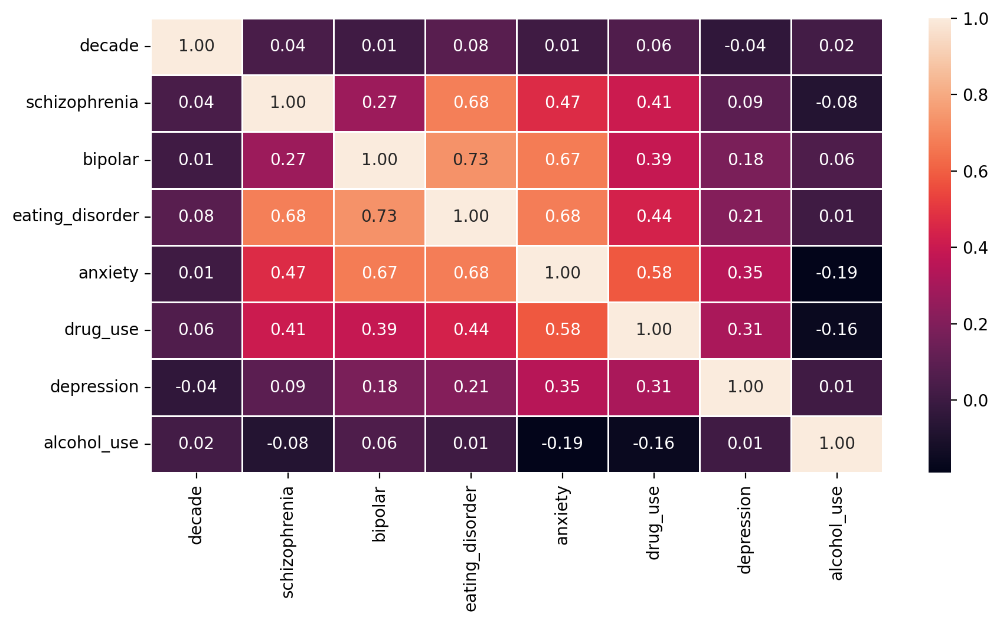

In [1170]:
num = ['decade', 'schizophrenia', 'bipolar', 'eating_disorder', 'anxiety', 'drug_use', 'depression', 'alcohol_use' ]
Corrmat = dataByDecade[num].corr()
plt.figure(figsize=(10, 5), dpi=200)
sns.heatmap(Corrmat, annot=True,fmt=".2f", linewidth=.5)

Scatter plots

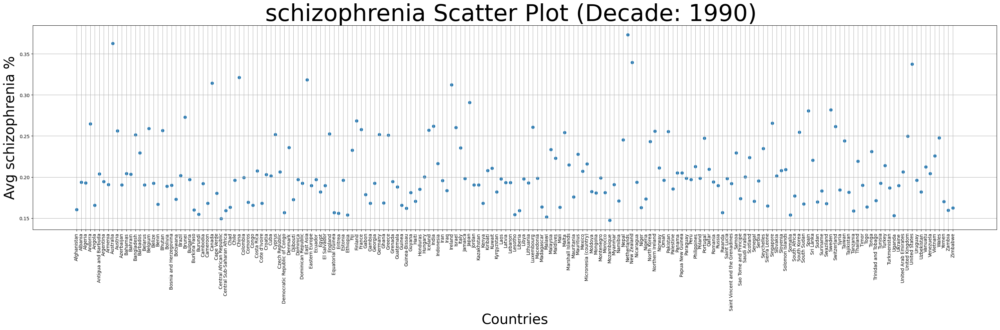

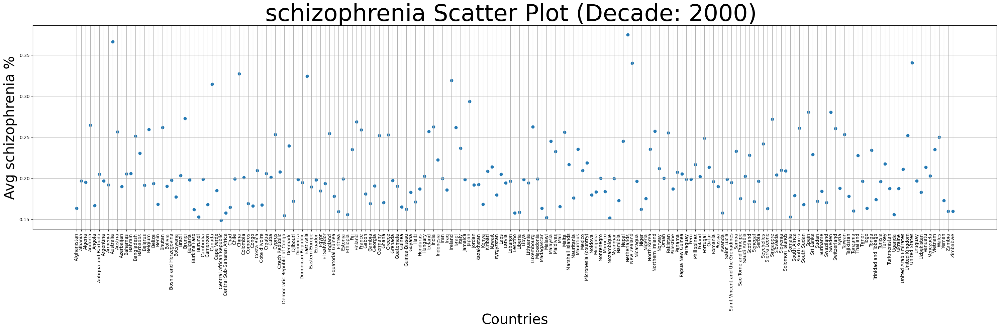

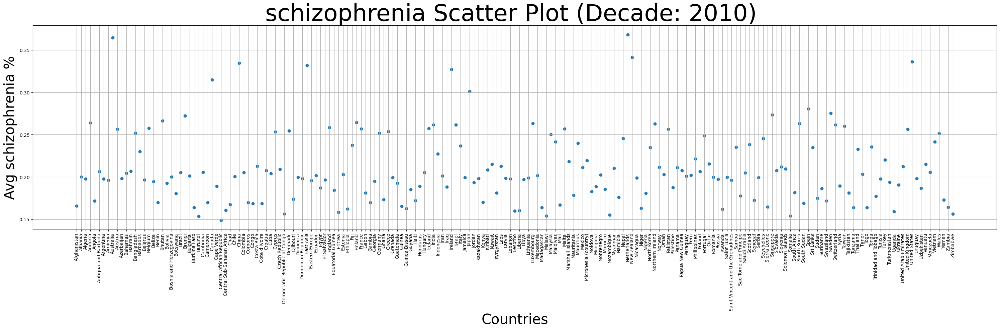

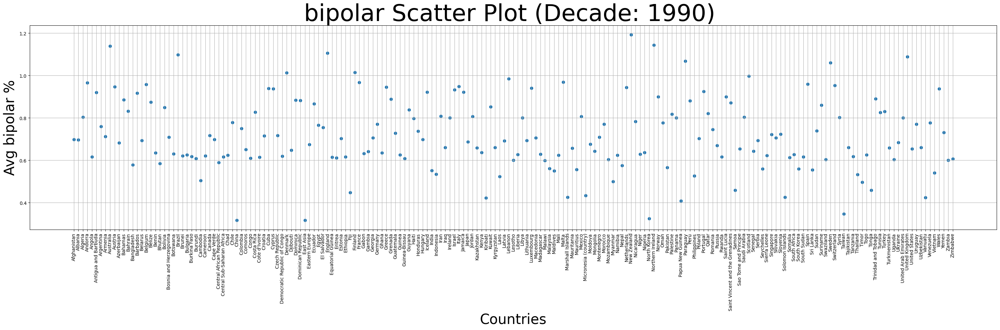

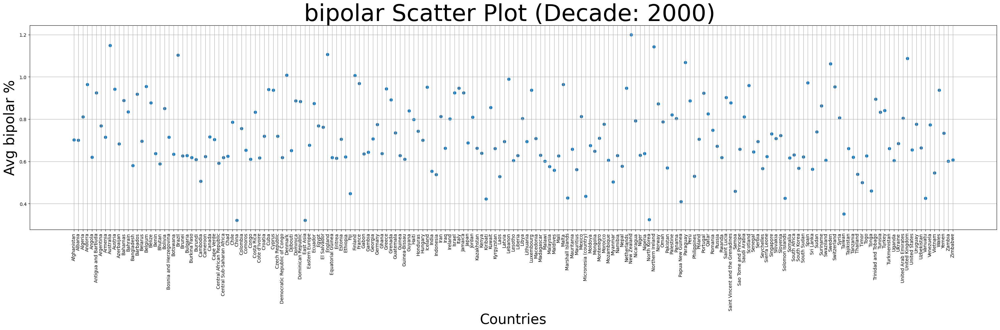

...

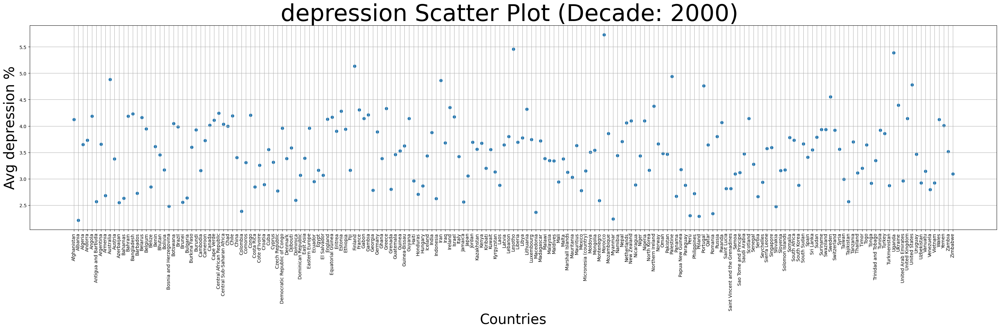

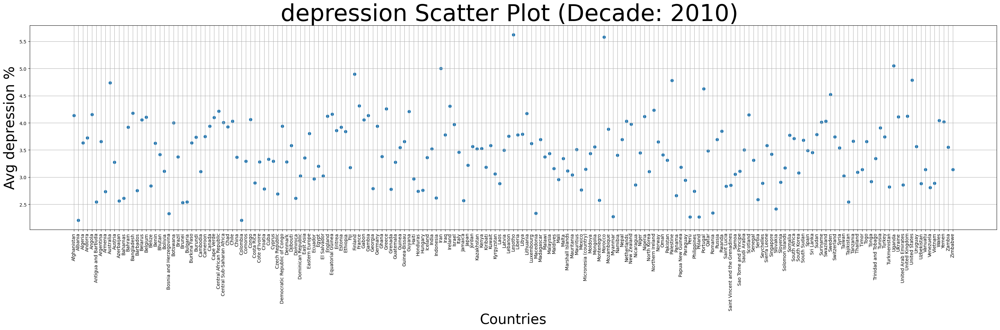

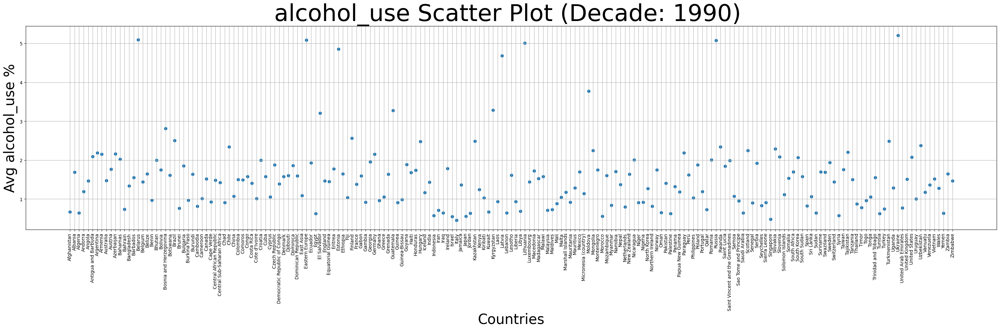

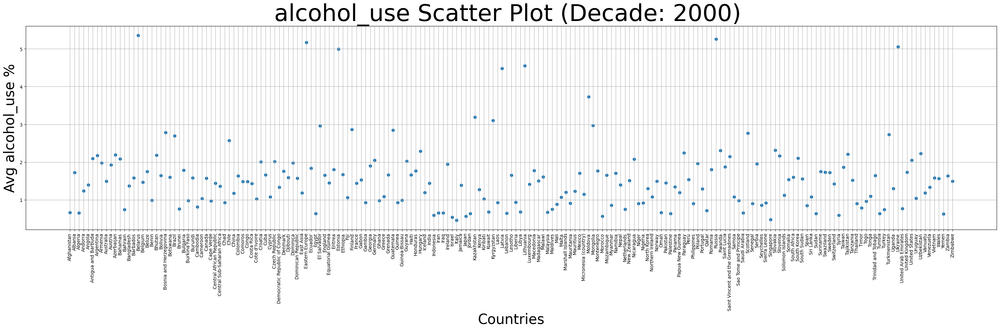

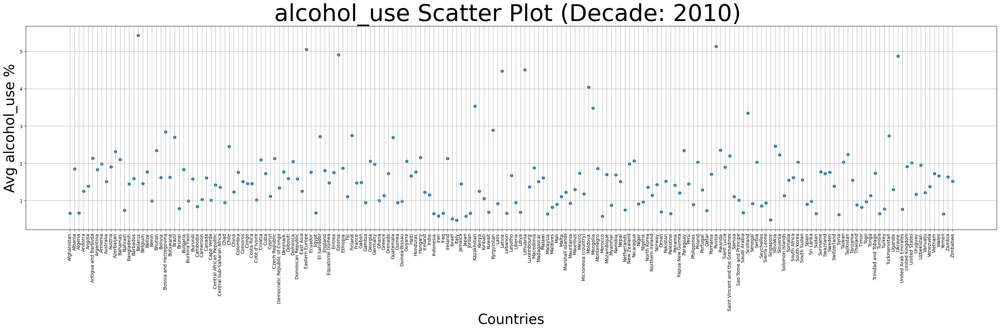

In [1171]:
# Create scatter plots for depression percentages by decade
for column in dataByDecade.columns[2:9]:
  for decade in dataByDecade['decade'].unique():
      decade_data = dataByDecade[dataByDecade['decade'] == decade]

      plt.figure(figsize=(30, 10))
      plt.scatter(decade_data['country'], decade_data[column])
      plt.title(f"{column} Scatter Plot (Decade: {decade}) ",fontsize=50)
      plt.xlabel("Countries", fontsize = 30)
      plt.ylabel(f"Avg {column} %", fontsize = 30)
      plt.xticks(rotation=90)
      plt.grid()
      plt.tight_layout()
      plt.show()

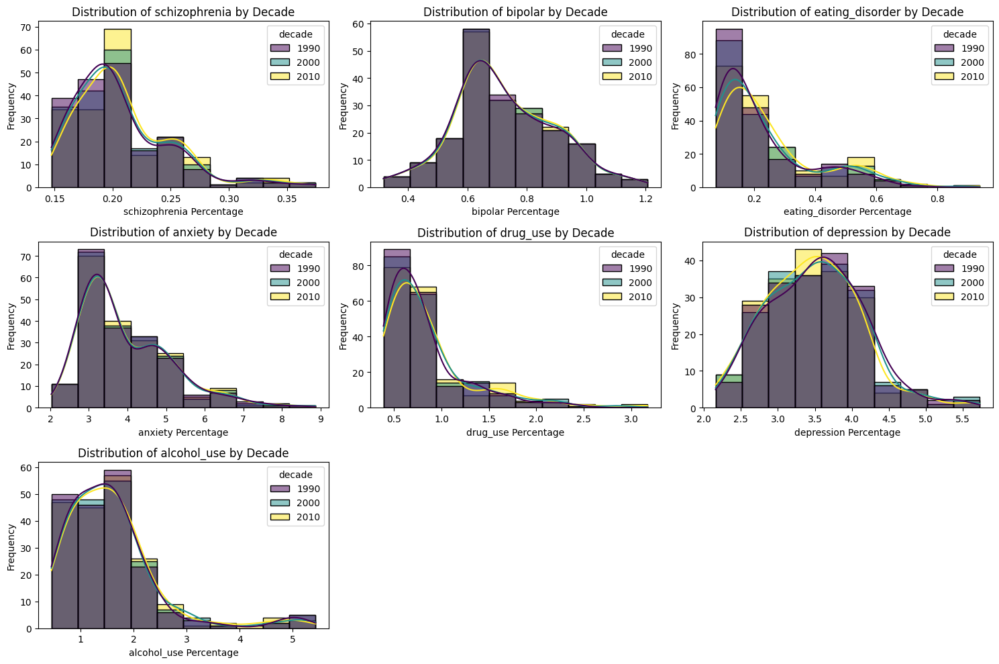

In [1172]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(dataByDecade.columns[2:]):  # Loop through disorder columns
    plt.subplot(3, 3, i + 1)  # Create subplots
    sns.histplot(data=dataByDecade, x=column, hue="decade", kde=True, palette="viridis", bins=10)
    plt.title(f"Distribution of {column} by Decade")
    plt.xlabel(f"{column} Percentage")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

Histograms

Box plots

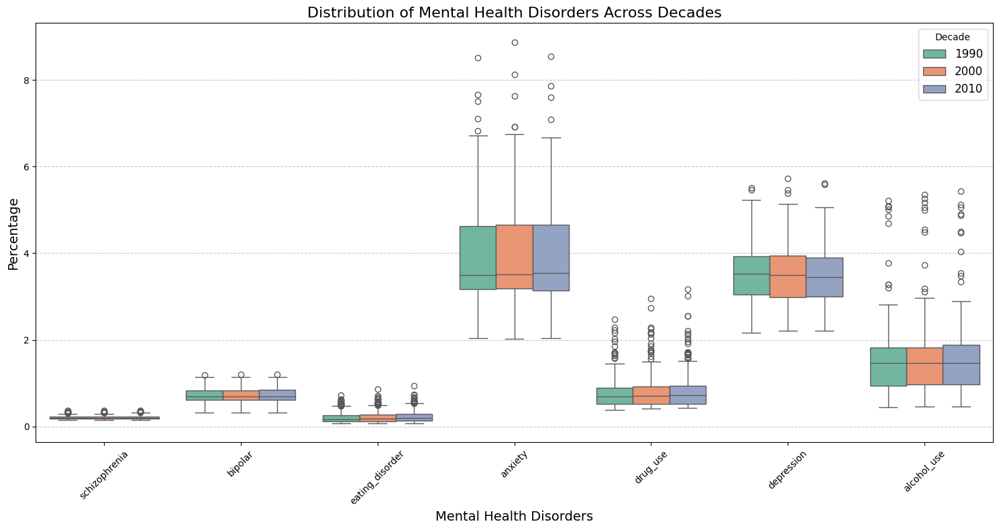

In [1173]:
# Melt the dataset for easier plotting with Seaborn
melted_df = dataByDecade.melt(id_vars=["country", "decade"],
                    value_vars=['schizophrenia', 'bipolar', 'eating_disorder', 'anxiety', 'drug_use', 'depression', 'alcohol_use' ],
                    var_name="Disorder",
                    value_name="Percentage")

# Plot boxplots for each disorder, grouped by decade
plt.figure(figsize=(15, 8))
sns.boxplot(data=melted_df, x="Disorder", y="Percentage", hue="decade", palette="Set2")

# Add labels and title
plt.title("Distribution of Mental Health Disorders Across Decades", fontsize=16)
plt.xlabel("Mental Health Disorders", fontsize=14)
plt.ylabel("Percentage", fontsize=14)
plt.legend(title="Decade", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

# Processing

We will scale the features for every decade separately, removing the country and decade columns first

In [1349]:
numeric_columns = ["schizophrenia", "bipolar", "eating_disorder",
                   "anxiety", "drug_use", "depression", "alcohol_use"]
scaler = MinMaxScaler()
#group by decade
decades = dataByDecade['decade'].unique()
data = {}

for decade in decades: #loop for every decade
    decade_data = dataByDecade[dataByDecade['decade'] == decade][numeric_columns]
    normalized_data = scaler.fit_transform(decade_data) #normalize the data

    #store results in "data" dataframe
    data[decade] = pd.DataFrame(normalized_data, columns=numeric_columns)
    #add coutry and decade columns back
    data[decade]['country'] = dataByDecade[dataByDecade['decade'] == decade]['country'].values
    data[decade]['decade'] = decade

#print data for one decade to ensure data has been scaled correctly
print(data[1990])

     schizophrenia   bipolar  eating_disorder   anxiety  drug_use  depression  \
0         0.058330  0.436091         0.027042  0.430802  0.641627    0.578077   
1         0.205359  0.433591         0.080480  0.201525  0.050827    0.000000   
2         0.201544  0.556124         0.166822  0.453924  0.483315    0.455950   
3         0.520785  0.741152         0.782767  0.496512  0.228443    0.477650   
4         0.081223  0.341968         0.088431  0.182879  0.064060    0.608738   
..             ...       ...              ...       ...       ...         ...   
190       0.347905  0.255405         0.019837  0.000000  0.114262    0.227370   
191       0.444927  0.708616         0.540261  0.416464  0.510526    0.618850   
192       0.101342  0.473116         0.070208  0.430194  0.359075    0.545147   
193       0.054573  0.324619         0.066085  0.234147  0.063848    0.427483   
194       0.068073  0.331206         0.101107  0.162927  0.174709    0.275682   

     alcohol_use      count

We now have a dictionary of dataframes with the decade values as keys, below we acces each one of these and store them in different variables.

In [1350]:
#dataFrame for 1990 - 1999 decade:
df_90s = data[1990]

#dataFrame for 2000 - 2009 decade:
df_00s = data[2000]

#dataFrame for 2010 - 2017 decade:
df_10s = data[2010]

countries = df_90s['country']

In [1182]:
#dataFrames to store results in
results_df_90s = pd.DataFrame(columns=[
    "Dimensionality Reduction",
    "Clustering Algorithm",
    "Best Parameters",
    "Dimensionality Reduction Time (s)",
    "Clustering Execution Time (s)",
    "Suggested Clusters",
    "Calinski-Harabasz Index",
    "Davies-Bouldin Index",
    "Silhouette Score",
    "Dunn Index"
])

results_df_00s = results_df_90s.copy()
results_df_10s = results_df_90s.copy()

decade_dfs = {0: results_df_90s,
    1: results_df_00s,
    2: results_df_10s}

####Necessary functions

In [1176]:
def dunn_index(data, labels):
    unique_labels = np.unique(labels)
    centroids = [data[labels == label].mean(axis=0) for label in unique_labels]

    #inter-cluster distances (distances between cluster centroids)
    inter_cluster_distances = cdist(centroids, centroids, metric='euclidean')
    np.fill_diagonal(inter_cluster_distances, np.inf)  # Exclude self-distances

    #intra-cluster distances (largest distance within a cluster)
    intra_cluster_distances = []
    for label in unique_labels:
        cluster_points = data[labels == label]
        if len(cluster_points) > 1:
            intra_cluster_distances.append(np.max(cdist(cluster_points, cluster_points, metric='euclidean')))
        else:
            intra_cluster_distances.append(0)  # Single-point cluster

    dunn = np.min(inter_cluster_distances) / np.max(intra_cluster_distances)
    return dunn

In [1177]:
#will be used later to evaluate each technique
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score, mutual_info_score

def performance_score(data, labels):

  if len(set(labels)) < 2: #if one or less clusters formed dont compute
    return np.nan, np.nan, np.nan, np.nan

  ch_score = calinski_harabasz_score(data, labels)
  db_score = davies_bouldin_score(data, labels)
  silh_score = silhouette_score(data, labels)
  dunn = dunn_index(data, labels)

  return silh_score, ch_score, db_score, dunn

def plot_clusters_with_scores(X, labels, title, execution_time):
    # Calculate performance scores
    silh_score, ch_score, db_score, dunn_index = performance_score(X, labels)

    # Plotting the clustering results
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis', s=50)

    # Add execution time to the title
    plt.title(f"{title} (Execution Time: {execution_time:.2f} sec)")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")

    # Display performance scores in the bottom right corner
    plt.text(0.95, 0.05, f"Silhouette: {silh_score:.2f}\nCH Index: {ch_score:.2f}\nDBI: {db_score:.2f}\nDunn Index: {dunn_index:.2f}",
             fontsize=10, verticalalignment='bottom', horizontalalignment='right',
             bbox=dict(facecolor='white', alpha=0.5), transform=plt.gca().transAxes)

    # plt.legend(loc='best')
    plt.legend(loc='upper left')
    plt.show()


In [1178]:
#silhouette scorer
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    n_clusters = len(set(labels))
    n_samples = X.shape[0]
    # Silhouette score requires at least 2 clusters
    if 2 <= n_clusters < n_samples:
           return silhouette_score(X, labels)
    else:
           return -1  # Return a low score for invalid cases

In [1179]:
#function to create histograms for cluster labels
def plot_cluster_histograms(labels, decade_label):
    plt.figure(figsize=(8, 6))
    plt.hist(labels, bins=np.arange(labels.min(), labels.max() + 2) - 0.5, edgecolor='black')
    plt.title(f"Histogram of Cluster Labels for {decade_label} Decade")
    plt.xlabel("Cluster Label")
    plt.ylabel("Frequency")
    plt.xticks(range(labels.min(), labels.max() + 1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

In [1180]:
def optimize_eps(data):
    # Compute pairwise distances
    distances = pairwise_distances(data)
    distances_flat = distances[np.triu_indices_from(distances, k=1)]  # Extract upper triangle

    # Calculate min_eps (mean of distances) and max_eps (std deviation of distances)
    min_eps = np.mean(distances_flat)
    max_eps = np.std(distances_flat) + min_eps

    return min_eps, max_eps

In [1181]:
def display_countries_per_cluster(clustered_data, decade_label):

    print(f"Clusters for {decade_label} Decade:")
    for cluster_id in clustered_data[decade_label]['Cluster'].unique():
        countries = clustered_data[decade_label].loc[clustered_data[decade_label]['Cluster'] == cluster_id, 'Country']
        print(f"Cluster {cluster_id}:")
        print(", ".join(countries))
        print()



---



# Clustering

The dimensionality reduction tecniques used will be:
1. Principal Component Analysis (PCA)
2. t-distributed Stochastic Neighbor Embedding (t-SNE)
3. Stacked Autoencoder (SAE)

The raw data will also be clustered for comparison




## 0. Clustering on Raw data


In [1183]:
df_90s = df_90s.drop(columns=["country", "decade"])
df_00s = df_00s.drop(columns=["country", "decade"])
df_10s = df_10s.drop(columns=["country", "decade"])

decades = {
    "90s": df_90s,
    "00s": df_00s,
    "10s": df_10s,
}

###0.1 Minibatch KMeans

HyperParameter Optimization



*   **Elbow Method**



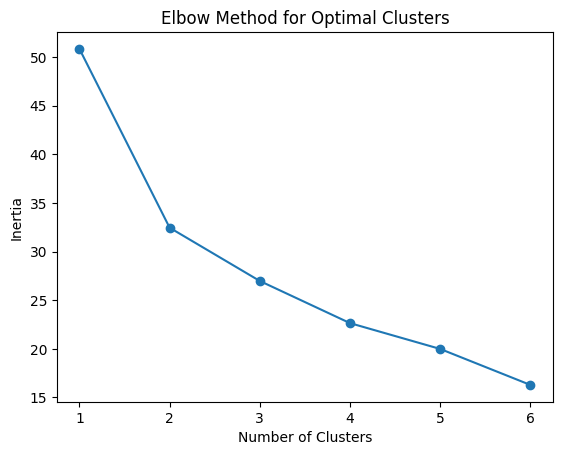

In [1184]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 7):
    minibatch = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    minibatch.fit(df_90s)
    inertia.append(minibatch.inertia_)

# Plot the elbow curve
plt.plot(range(1, 7), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*   **Grid Search**


In [1185]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

# GridSearchCV
minibatch = MiniBatchKMeans()

grid_search = GridSearchCV(
    minibatch,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(df_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters (GridSearchCV): {'batch_size': 10, 'init': 'random', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.41




*   **Random Search**



In [1186]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

minibatch = MiniBatchKMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    minibatch,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(df_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'batch_size': 50, 'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.41




---



**Execute MiniBatch Kmeans Clustering**

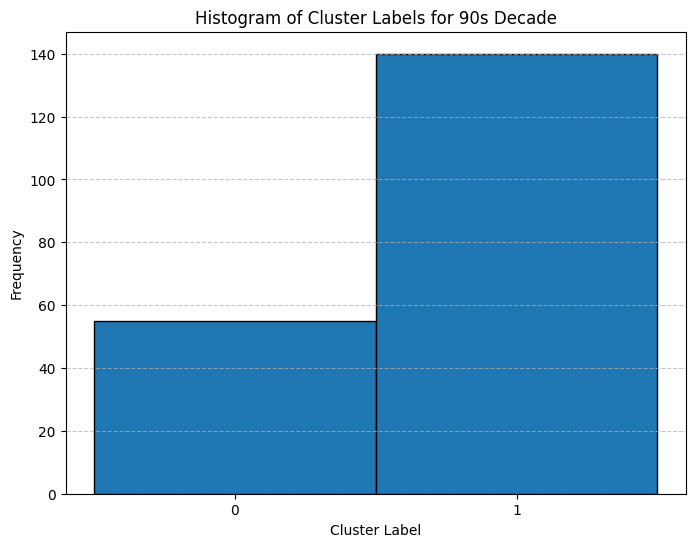

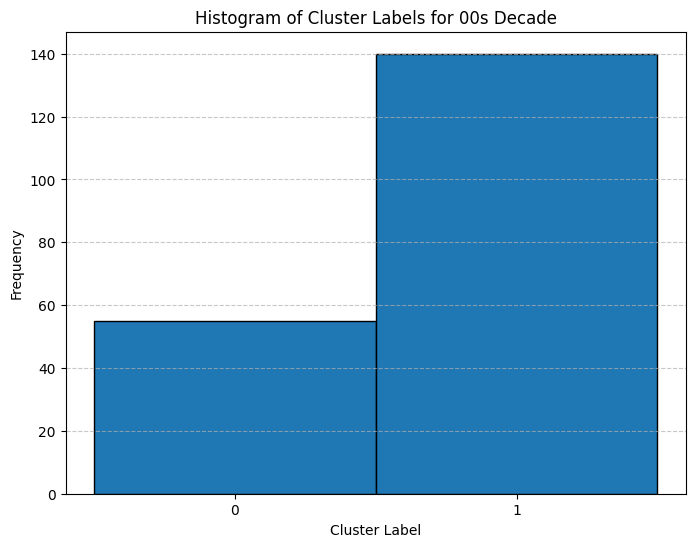

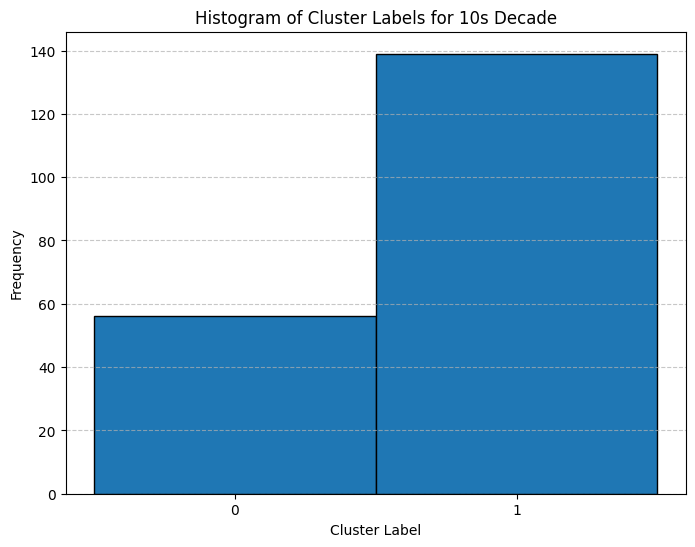

In [1187]:
minibatch_time = {}
raw_minibatch_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for decade_label, data_raw in decades.items():
    # Perform MiniBatchKMeans clustering
    time_start = time.time()
    minibatch = MiniBatchKMeans(n_clusters=2, batch_size=100, init='k-means++', random_state=42)
    raw_minibatch_labels[i] = minibatch.fit_predict(data_raw)
    minibatch_time[i] = time.time() - time_start

    # Calculate performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_raw, raw_minibatch_labels[i])

    # Visualize cluster labels with histograms
    plot_cluster_histograms(raw_minibatch_labels[i], decade_label)
    i = i + 1


In [1188]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "Raw",
                        "Clustering Algorithm": "MiniBatch Kmeans",
                        "Best Parameters": {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": 0,
                        "Clustering Execution Time (s)": minibatch_time[i],
                        "Suggested Clusters": len(set(raw_minibatch_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

     #add new row to final dataframe
    decade_dfs[i] = new_row #assign new row to dataframe directly since it's empty
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.007419                  

### 0.2 DBSCAN

Hyperparameter optimization

Calculate the distances between each point and use the two values as the max and min values for hyperparameter optimization of the epsilon parameter

In [1189]:
from sklearn.metrics.pairwise import pairwise_distances
import numpy as np

def optimize_eps(data_pca):
    # Compute pairwise distances
    distances = pairwise_distances(df_90s)
    distances_flat = distances[np.triu_indices_from(distances, k=1)]  # Extract upper triangle

    # Calculate min_eps (mean of distances) and max_eps (std deviation of distances)
    min_eps = np.mean(distances_flat)
    max_eps = np.std(distances_flat) + min_eps

    return min_eps, max_eps

# Example usage for PCA-reduced data of the 90s decade
min_eps_90s, max_eps_90s = optimize_eps(df_90s)
print(f"Suggested min_eps for 90s: {min_eps_90s}")
print(f"Suggested max_eps for 90s: {max_eps_90s}")


min_eps_00s, max_eps_00s = optimize_eps(df_00s)
print(f"Suggested min_eps for 00s: {min_eps_00s}")
print(f"Suggested max_eps for 00s: {max_eps_00s}")

min_eps_10s, max_eps_10s = optimize_eps(df_10s)
print(f"Suggested min_eps for 10s: {min_eps_10s}")
print(f"Suggested max_eps for 10s: {max_eps_10s}")

Suggested min_eps for 90s: 0.6577629422357217
Suggested max_eps for 90s: 0.960115530313391
Suggested min_eps for 00s: 0.6577629422357217
Suggested max_eps for 00s: 0.960115530313391
Suggested min_eps for 10s: 0.6577629422357217
Suggested max_eps for 10s: 0.960115530313391


* Randomized Search   



In [1190]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'eps': scipy.stats.uniform(0.6, 1.0),
    'min_samples': scipy.stats.randint(2, 11)
}

dbscan = DBSCAN()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    dbscan,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(df_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'eps': 0.6070663052197174, 'min_samples': 10}
Best Silhouette Score (RandomizedSearchCV): 0.12




*   GridSearch



In [1191]:
# Parameter grid for GridSearchCV
param_grid = {
    'eps': np.linspace(0.6, 1.0),
    'min_samples': range(2, 11)
}

# GridSearchCV
dbscan = DBSCAN()

grid_search = GridSearchCV(
    dbscan,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(df_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 450 candidates, totalling 2250 fits
Best parameters (GridSearchCV): {'eps': 0.6, 'min_samples': 2}
Best Silhouette Score (GridSearchCV): 0.13




---



**Execute DBSCAN Clustering**

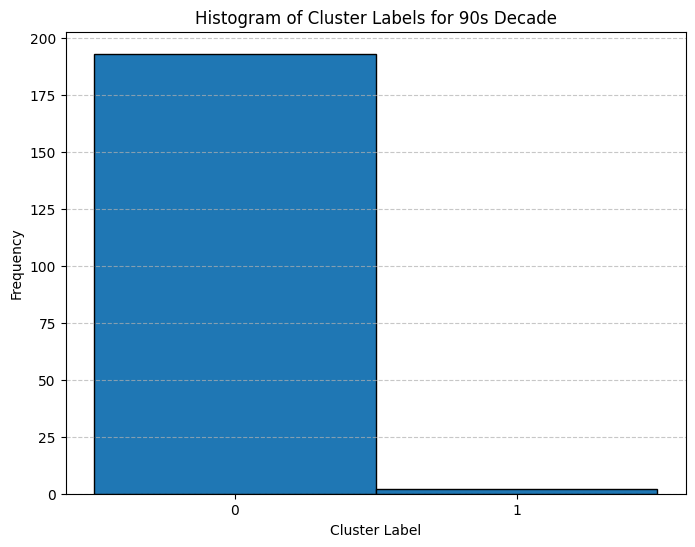

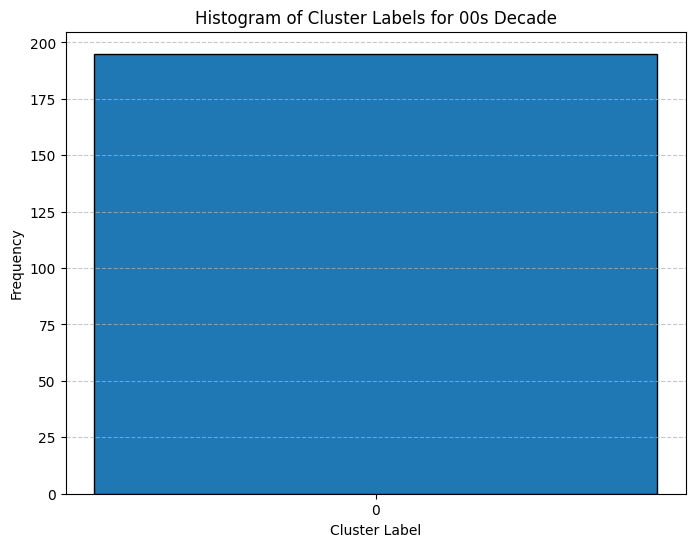

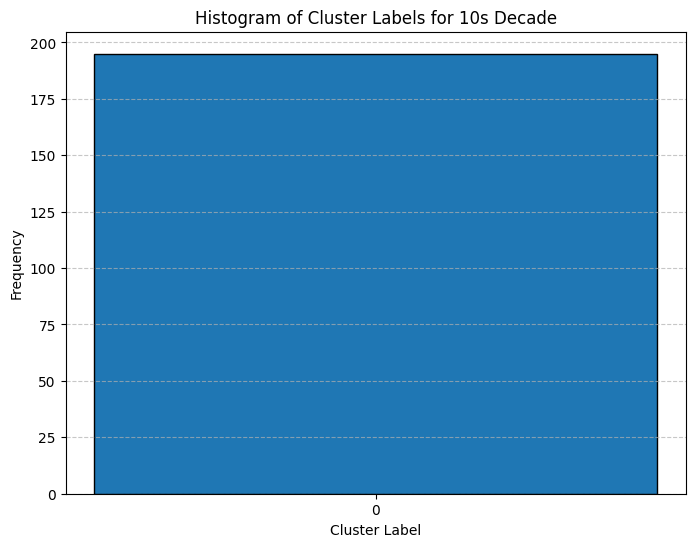

In [1192]:
dbscan_time = {}
raw_dbscan_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for decade_label, data_raw in decades.items():

    # Perform DBSCAN clustering
    start_time = time.time()
    dbscan = DBSCAN(eps=0.6, min_samples=2)
    raw_dbscan_labels[i] = dbscan.fit_predict(data_raw)
    dbscan_time[i] = time.time() - start_time


    #visualize dbscan clustering with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_raw, raw_dbscan_labels[i])
    #visualize
    #plot_clusters_with_scores(data_pca, dbscan_labels,"DBSCAN", dbscan_time[i])
    plot_cluster_histograms(raw_dbscan_labels[i], decade_label)
    i = i + 1

In [1193]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "Raw",
                        "Clustering Algorithm": "DBSCAN",
                        "Best Parameters": {'eps': 0.6, 'min_samples': 2},
                        "Dimensionality Reduction Time (s)": 0,
                        "Clustering Execution Time (s)": dbscan_time[i],
                        "Suggested Clusters": len(set(raw_dbscan_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                                  0                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Cluste

### 0.3 KMeans

HyperParameter Optimization



*   **Elbow Method**


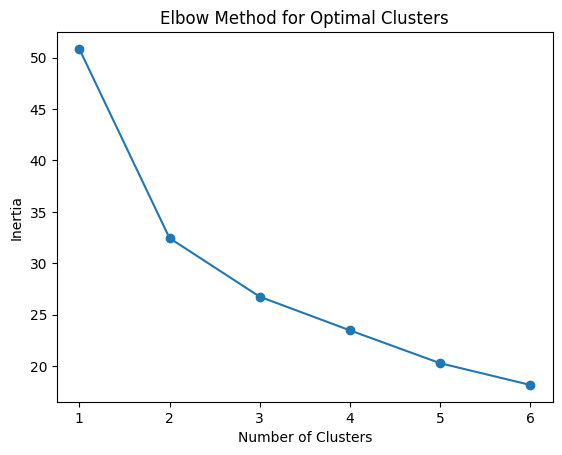

In [1194]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 7):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(df_90s)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 7), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*  **Grid Search**



In [1195]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'init': ['k-means++', 'random']
}

# GridSearchCV
kmeans = KMeans()

grid_search = GridSearchCV(
    kmeans,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(df_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters (GridSearchCV): {'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.42




*   **Random Search**



In [1196]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),  # Uniform distribution for eps
    'init': ['k-means++', 'random'] # Integer distribution for min_samples
}

kmeans = KMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    kmeans,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(df_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'init': 'random', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.41




---



**Execute Kmeans Clustering**

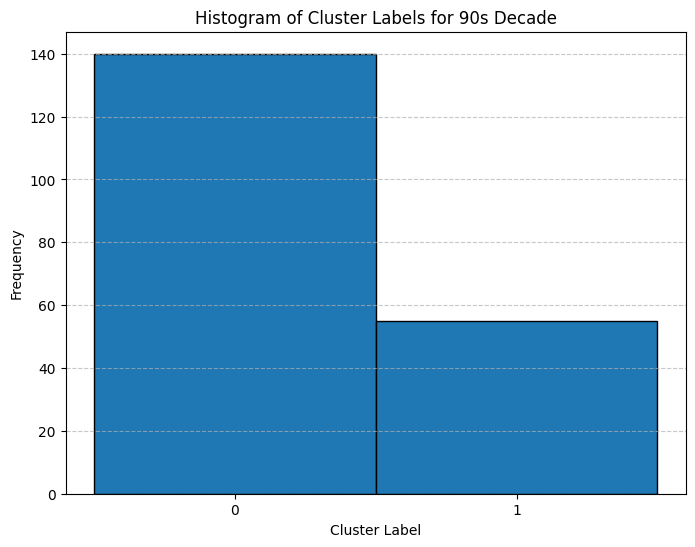

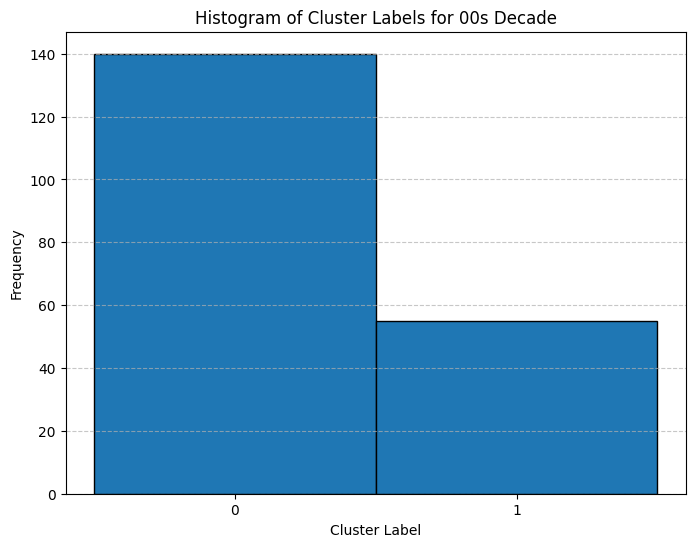

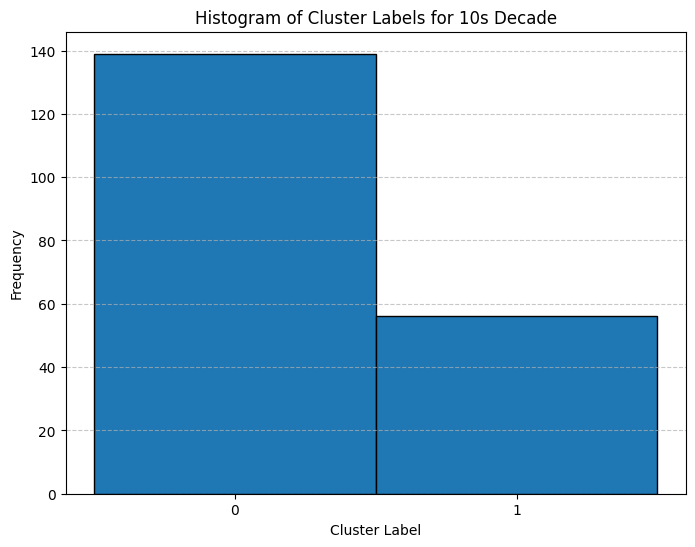

In [1197]:
kmeans_time = {}
raw_kmeans_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0

for decade_label, data_raw in decades.items():
    # Perform MiniBatchKMeans clustering
    start_time = time.time()
    kmeans = KMeans(n_clusters=2, init = 'k-means++', random_state=42)
    raw_kmeans_labels[i] = kmeans.fit_predict(data_raw)
    kmeans_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_raw, raw_kmeans_labels[i])
    #visualize
    #plot_clusters_with_scores(data_raw, kmeans_labels,"Kmeans", kmeans_time[i])
    plot_cluster_histograms(raw_kmeans_labels[i], decade_label)
    i = i + 1

In [1198]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "Raw",
                        "Clustering Algorithm": "Kmeans",
                        "Best Parameters": {'init': 'random', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": 0,
                        "Clustering Execution Time (s)": kmeans_time[i],
                        "Suggested Clusters": len(set(raw_kmeans_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                                  0                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                                  0                       0.005849                  

### 0.4 Spectral Clustering

Hyperparameter Optimization



*   GridSearch



In [1199]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}

# GridSearchCV
SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')

grid_search = GridSearchCV(
    SC,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(df_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (GridSearchCV): {'assign_labels': 'kmeans', 'n_clusters': 6}
Best Silhouette Score (GridSearchCV): 0.33




*   RandomizedSearch


In [1200]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}


SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    SC,
    param_distributions=param_distributions,
    n_iter=18,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(df_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (RandomizedSearchCV): {'n_clusters': 6, 'assign_labels': 'kmeans'}
Best Silhouette Score (RandomizedSearchCV): 0.33




---



**Execute Spectral Clustering**

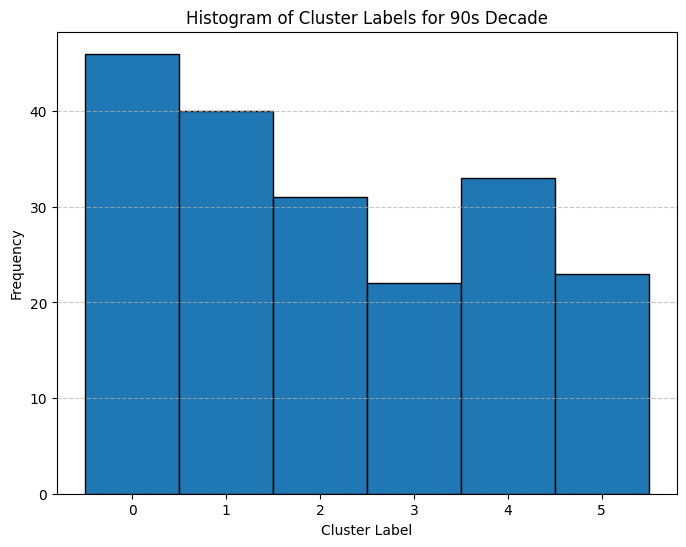

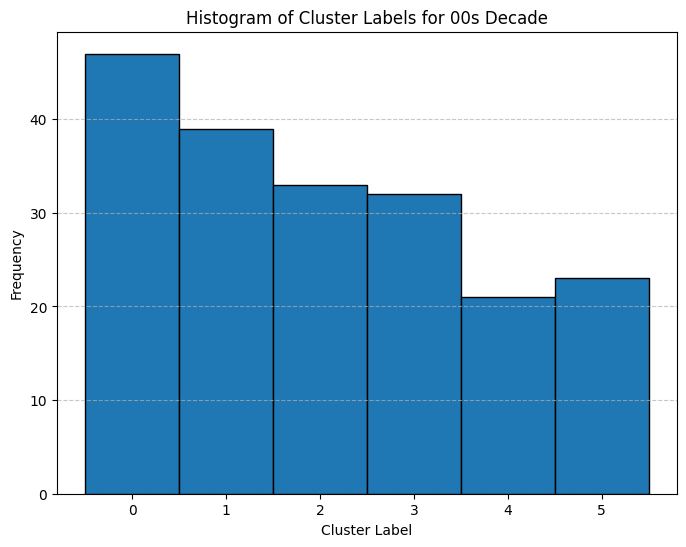

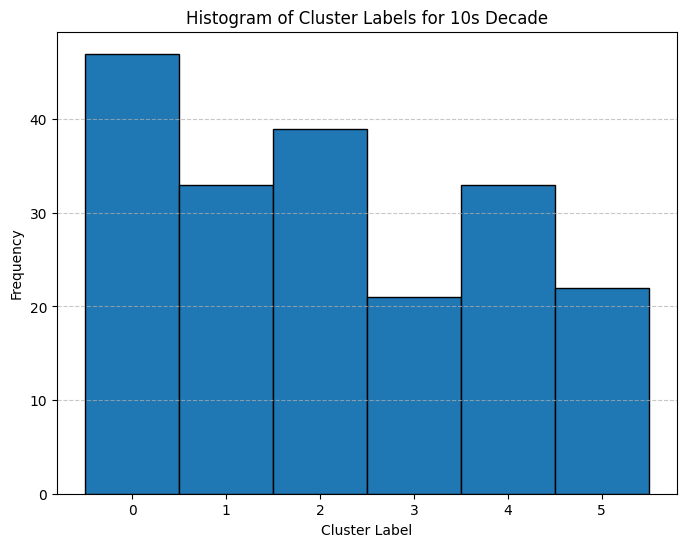

In [1201]:
sc_time = {}
raw_sc_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0

for decade_label, data_raw in decades.items():

    # Perform Spectral Clustering
    start_time = time.time()
    SC = SpectralClustering(n_clusters=6, assign_labels='kmeans',random_state=42, affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')
    raw_sc_labels[i] = SC.fit_predict(data_raw)
    sc_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_raw, raw_sc_labels[i])
    #visualize
    #plot_clusters_with_scores(data_raw, sc_labels,"Spectral Clustering", sc_time[i])
    plot_cluster_histograms(raw_sc_labels[i], decade_label)
    i = i + 1

In [1202]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "Raw",
                        "Clustering Algorithm": "Spectral Clustering",
                        "Best Parameters": {'n_clusters': 6, 'assign_labels': 'kmeans'},
                        "Dimensionality Reduction Time (s)": 0,
                        "Clustering Execution Time (s)": sc_time[i],
                        "Suggested Clusters": len(set(raw_sc_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                                  0                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                                  0                       0.005849                  

### 0.5 MeanShift

Hyperparameter Optimization

In [1205]:
for decade_label, data_raw in decades.items():
    #estimate optimal bandwidth for each run
    bandwidth = estimate_bandwidth(data_raw)
    print(f"Estimated Bandwidth: {bandwidth:.2f}")

Estimated Bandwidth: 0.53
Estimated Bandwidth: 0.51
Estimated Bandwidth: 0.52


* RandomizedSearch

In [1290]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'bandwidth' : scipy.stats.uniform(0.1, 0.6)
}

meanshift = MeanShift()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    meanshift,
    param_distributions=param_distributions,
    n_iter=10,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(df_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (RandomizedSearchCV): {'bandwidth': 0.5248435466776273}
Best Silhouette Score (RandomizedSearchCV): 0.35


* GridSearch

In [1204]:
param_grid = {
    'bandwidth': np.linspace(0.1, 2.0, 10)
}

meanshift = MeanShift()
grid_search = GridSearchCV(
    meanshift,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(df_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (GridSearchCV): {'bandwidth': 0.5222222222222223}
Best score (GridSearchCV): 0.35




---



**Execute MeanShift Clustering**

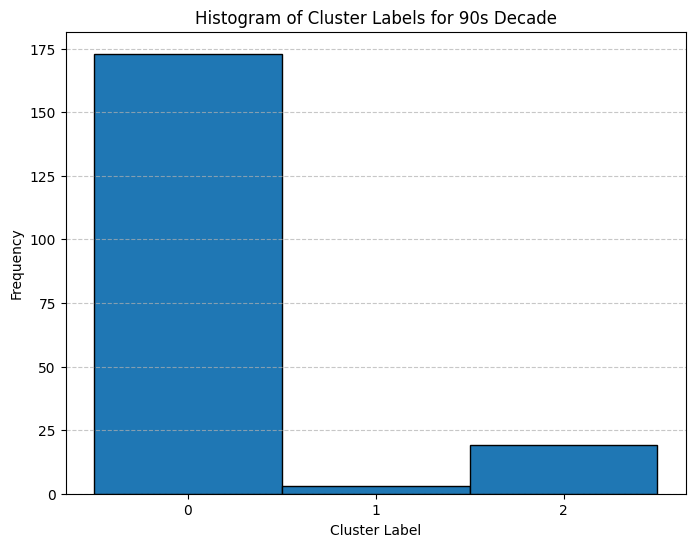

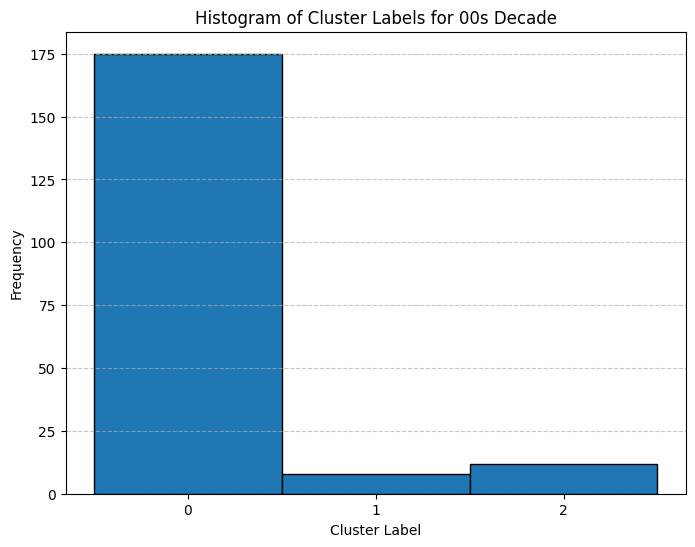

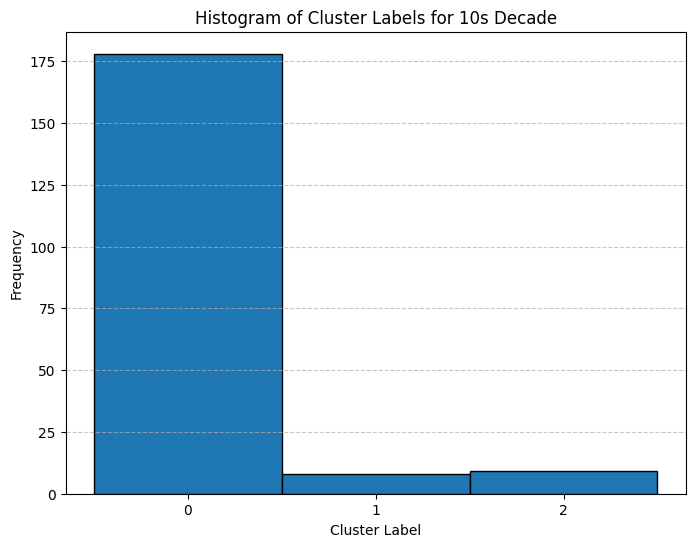

In [1206]:
ms_time = {}
raw_ms_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for decade_label, data_raw in decades.items():

    # Perform MeanShift Clustering
    start_time = time.time()
    meanshift = MeanShift(bandwidth = 0.52)
    raw_ms_labels[i] = meanshift.fit_predict(data_raw)
    ms_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_raw, raw_ms_labels[i])
    #visualize
    #plot_clusters_with_scores(data_raw, raw_ms_labels,"Spectral Clustering", ms_time[i])
    plot_cluster_histograms(raw_ms_labels[i], decade_label)
    i = i + 1

In [1207]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "Raw",
                        "Clustering Algorithm": "MeanShift",
                        "Best Parameters": {'bandwidth': 0.52},
                        "Dimensionality Reduction Time (s)": 0,
                        "Clustering Execution Time (s)": ms_time[i],
                        "Suggested Clusters": len(set(raw_ms_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                                  0                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                                  0                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                                  0                       0.005849                  



##1.   Clustering with PCA



### Perform PCA

Hyperparameter optimization for PCA

In [1208]:
pca = PCA()
pca.fit_transform(df_90s)

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

    # Find n for 90% explained variance
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
print(f"Number of components for 90% explained variance: {n_components_90}")

    # Find n for 50% explained variance
n_components_50 = np.argmax(cumulative_variance >= 0.50) + 1
print(f"Number of components for 50% explained variance: {n_components_50}")

Number of components for 90% explained variance: 5
Number of components for 50% explained variance: 2


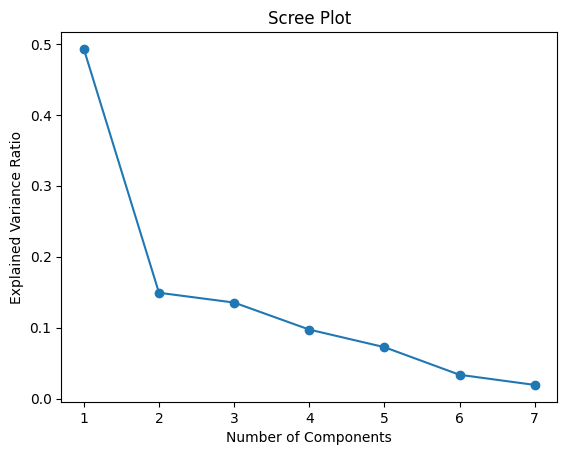

In [1209]:
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title("Scree Plot")
plt.xlabel("Number of Components")
plt.ylabel("Explained Variance Ratio")
plt.show()



---



**Perform PCA**

PCA Training Time: 0.01 seconds


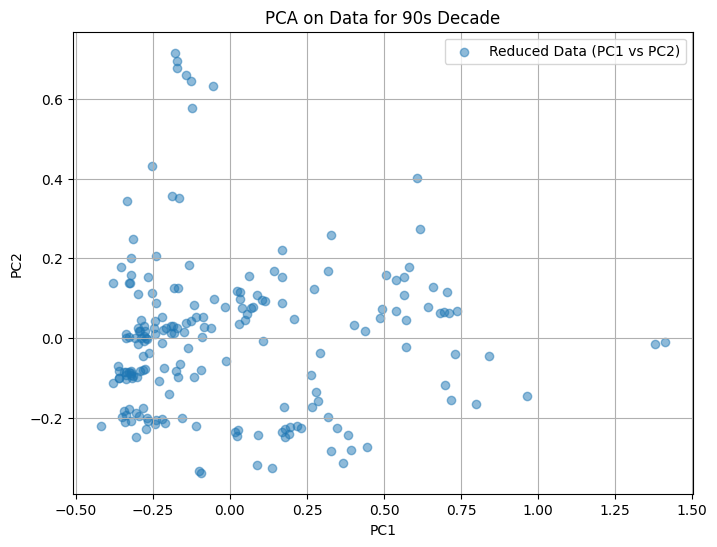

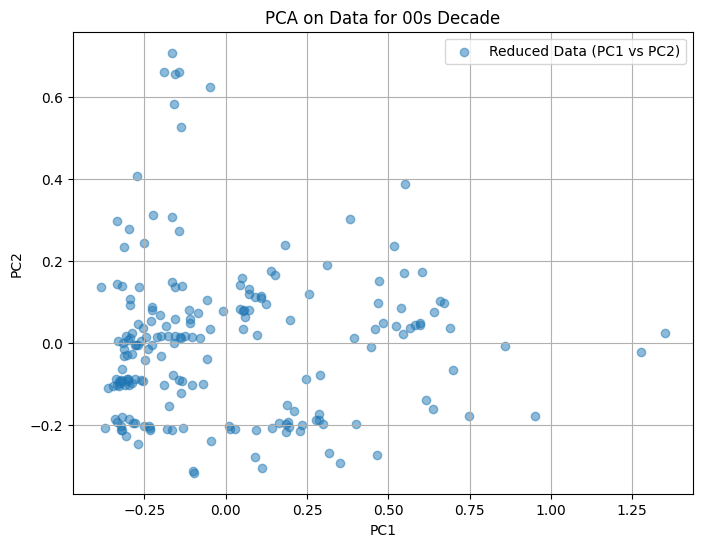

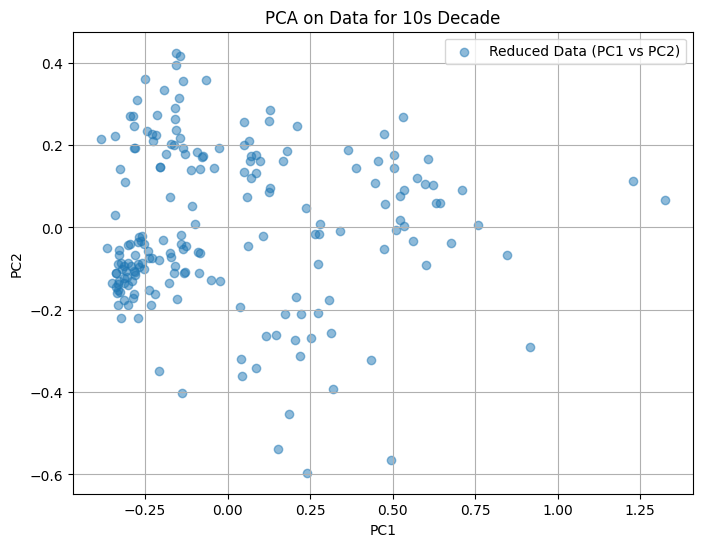

In [1210]:
pca = PCA(n_components=2)

start_time = time.time()
#pca dimensionality reduction for 90s decade
pca_90s = pca.fit_transform(df_90s)

#pca dimensionality reduction for 00s decade
pca_00s = pca.fit_transform(df_00s)

#pca dimensionality reduction for 10s decade
pca_10s = pca.fit_transform(df_10s)
pca_time = time.time() - start_time

print(f"PCA Training Time: {pca_time:.2f} seconds")

reduced_data = [
    (pca_90s, "90s"),
    (pca_00s, "00s"),
    (pca_10s, "10s"),
]

# Visualization
for data, decade_label in reduced_data:
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], label='Reduced Data (PC1 vs PC2)', alpha=0.5)
    plt.title(f"PCA on Data for {decade_label} Decade")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.grid(True)
    plt.show()

###1.1 Minibatch KMeans

HyperParameter Optimization



*   **Elbow Method**



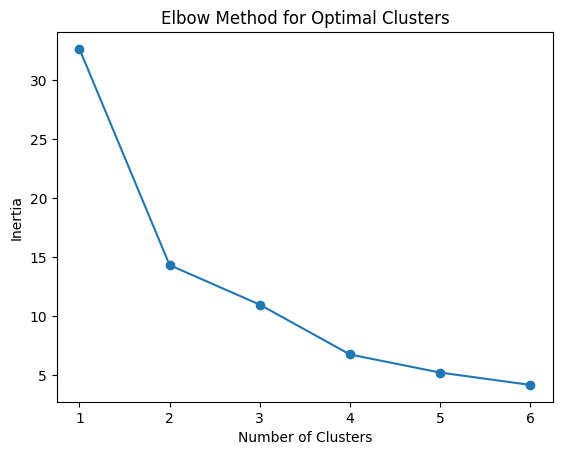

In [1211]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 7):
    minibatch = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    minibatch.fit(pca_90s)
    inertia.append(minibatch.inertia_)

# Plot the elbow curve
plt.plot(range(1, 7), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*   **Grid Search**


In [1212]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

# GridSearchCV
minibatch = MiniBatchKMeans()

grid_search = GridSearchCV(
    minibatch,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(pca_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters (GridSearchCV): {'batch_size': 20, 'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.56




*   **Random Search**



In [1213]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

minibatch = MiniBatchKMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    minibatch,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(pca_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'batch_size': 10, 'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.56




---



**Execute MiniBatch Kmeans Clustering**

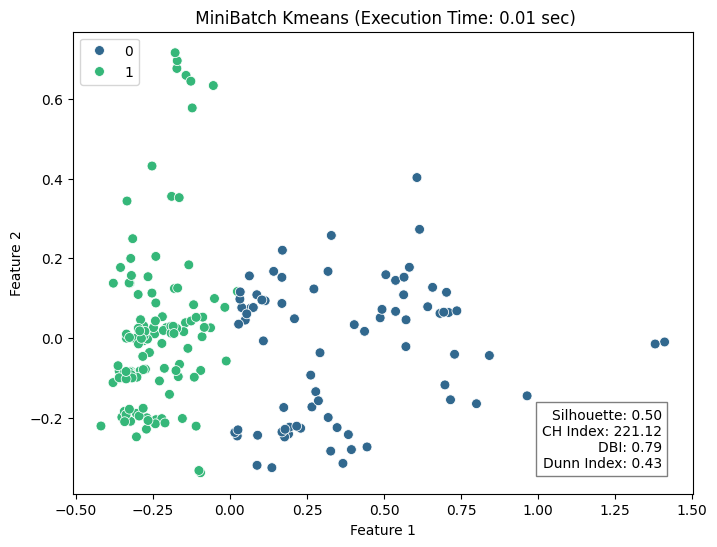

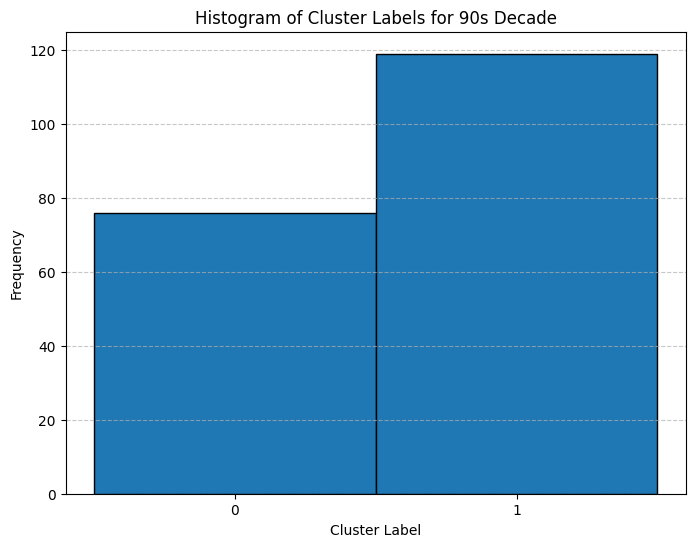

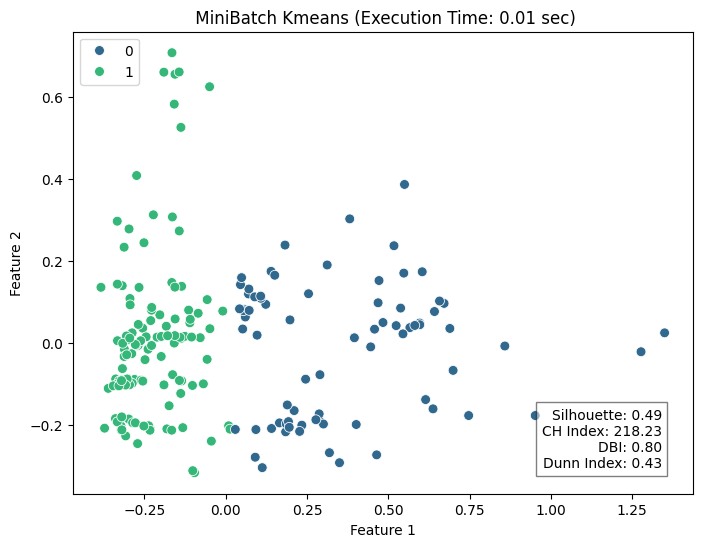

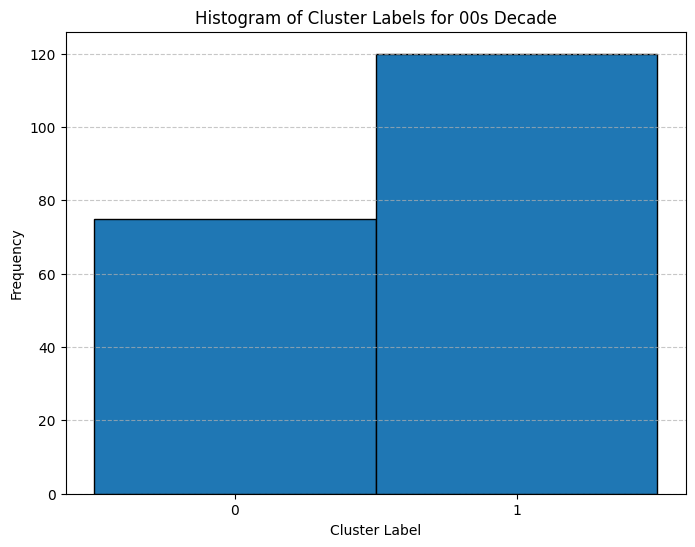

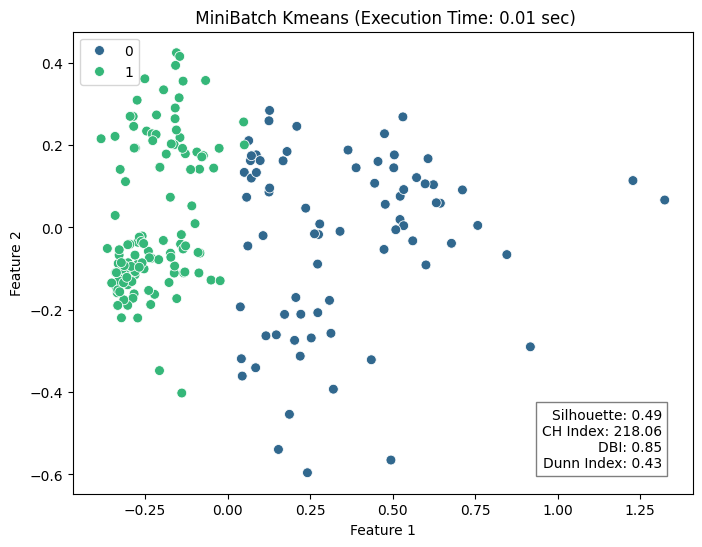

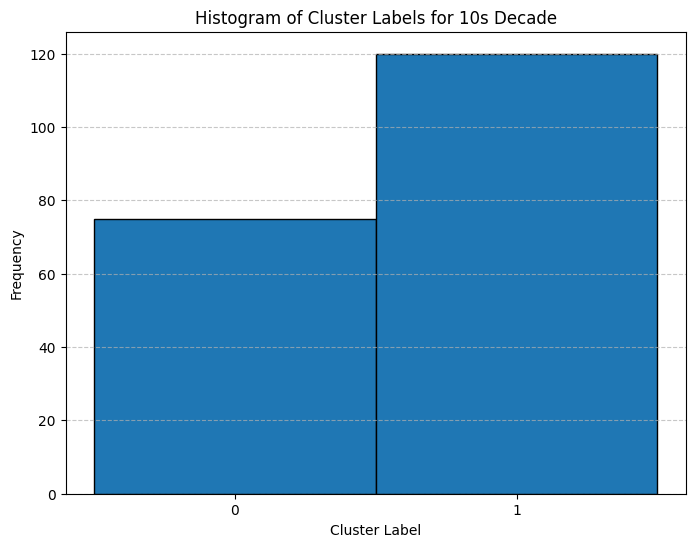

In [1214]:
minibatch_time = {}
pca_minibatch_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_pca, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    time_start = time.time()
    minibatch = MiniBatchKMeans(n_clusters = 2, batch_size = 10, init = 'k-means++',  random_state=42)
    pca_minibatch_labels[i] = minibatch.fit_predict(data_pca)
    minibatch_time[i] = time.time() - time_start


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i]= performance_score(data_pca, pca_minibatch_labels[i])
    #visualize
    plot_clusters_with_scores(data_pca, pca_minibatch_labels[i]," MiniBatch Kmeans", minibatch_time[i])
    plot_cluster_histograms(pca_minibatch_labels[i], decade_label)
    i = i + 1

In [1215]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "PCA",
                        "Clustering Algorithm": "MiniBatch Kmeans",
                        "Best Parameters": {'batch_size': 10, 'init': 'k-means++', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": pca_time,
                        "Clustering Execution Time (s)": minibatch_time[i],
                        "Suggested Clusters": len(set(pca_minibatch_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849                  

### 1.2 DBSCAN

Hyperparameter optimization

Calculate the distances between each point and use the two values as the max and min values for hyperparameter optimization of the epsilon parameter

In [1216]:
# Example usage for PCA-reduced data of the 90s decade
min_eps_90s, max_eps_90s = optimize_eps(pca_90s)
print(f"Suggested min_eps for 90s: {min_eps_90s}")
print(f"Suggested max_eps for 90s: {max_eps_90s}")


min_eps_00s, max_eps_00s = optimize_eps(pca_00s)
print(f"Suggested min_eps for 00s: {min_eps_00s}")
print(f"Suggested max_eps for 00s: {max_eps_00s}")

min_eps_10s, max_eps_10s = optimize_eps(pca_10s)
print(f"Suggested min_eps for 10s: {min_eps_10s}")
print(f"Suggested max_eps for 10s: {max_eps_10s}")

Suggested min_eps for 90s: 0.6577629422357217
Suggested max_eps for 90s: 0.960115530313391
Suggested min_eps for 00s: 0.6577629422357217
Suggested max_eps for 00s: 0.960115530313391
Suggested min_eps for 10s: 0.6577629422357217
Suggested max_eps for 10s: 0.960115530313391


* Randomized Search   



In [1217]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'eps': scipy.stats.uniform(0.4, 1.0),  # Uniform distribution for eps
    'min_samples': scipy.stats.randint(2, 11)  # Integer distribution for min_samples
}

dbscan = DBSCAN()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    dbscan,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(pca_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'eps': 0.40565304417577397, 'min_samples': 10}
Best Silhouette Score (RandomizedSearchCV): 0.1986707707249287




*   GridSearch



In [1218]:
# Parameter grid for GridSearchCV
param_grid = {
    'eps': np.linspace(0.4, 1.0),  # Uniform grid for eps
    'min_samples': range(2, 11)        # Integer range for min_samples
}

# GridSearchCV
dbscan = DBSCAN()

grid_search = GridSearchCV(
    dbscan,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(pca_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_}")

Fitting 5 folds for each of 450 candidates, totalling 2250 fits
Best parameters (GridSearchCV): {'eps': 0.4, 'min_samples': 9}
Best Silhouette Score (GridSearchCV): 0.1986707707249287




---------------------------------------



**Execute DBSCAN Clustering**

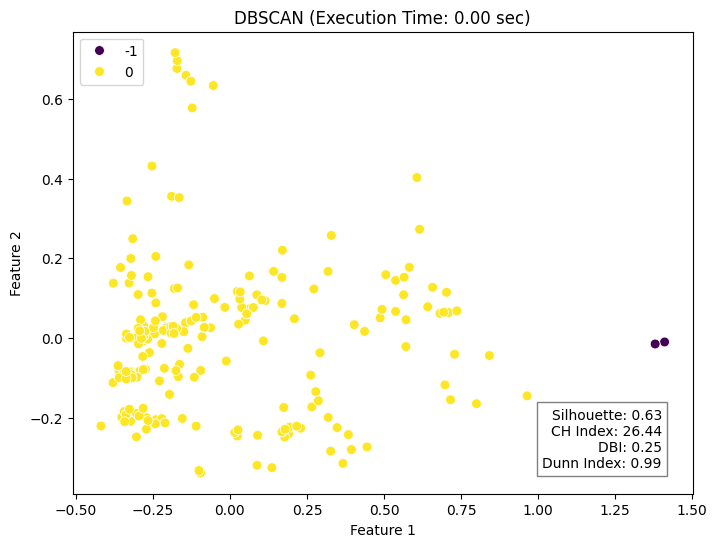

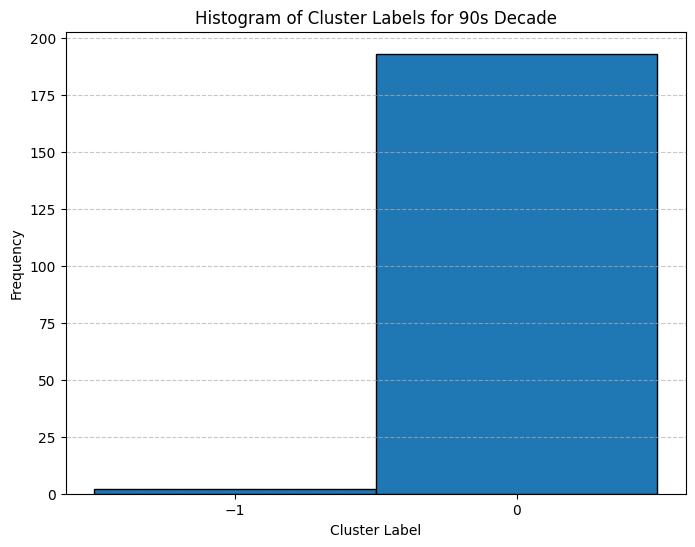

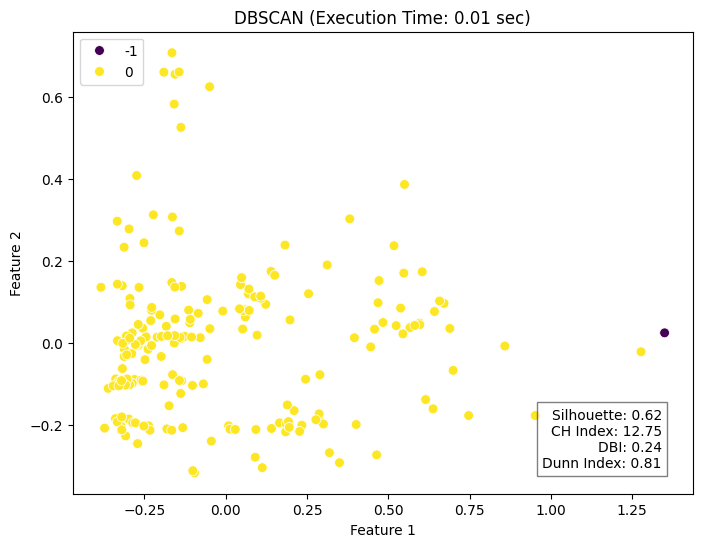

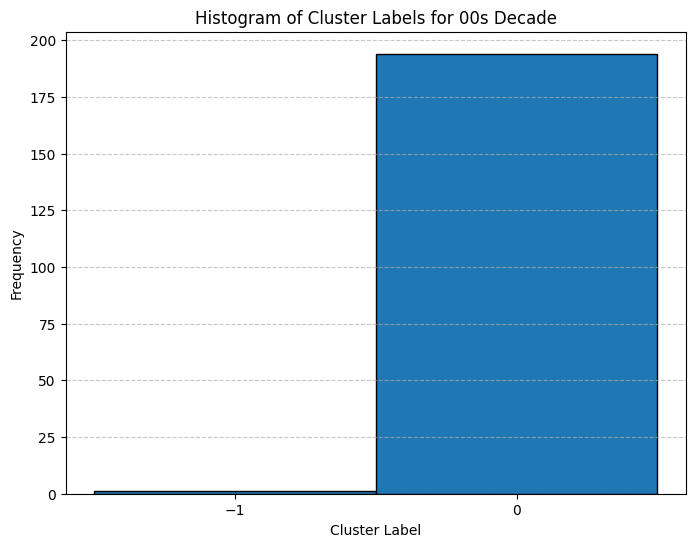

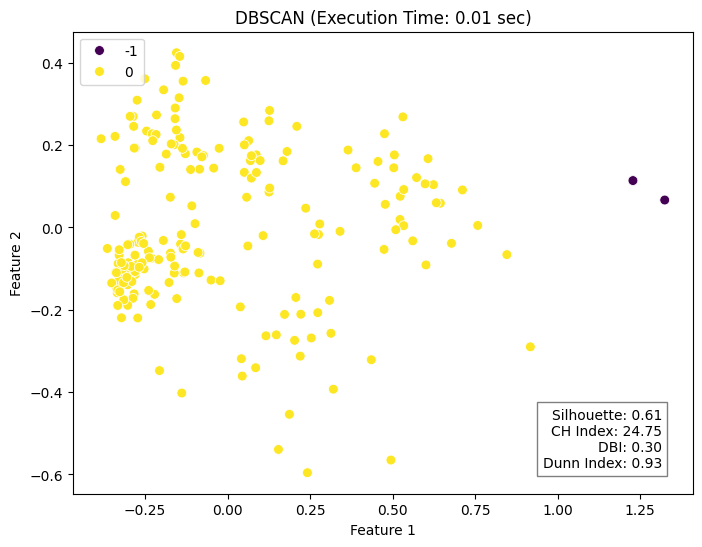

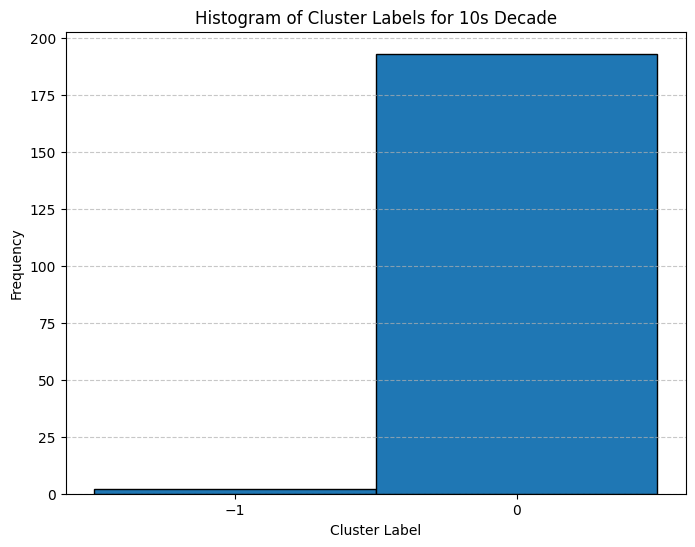

In [1219]:
dbscan_time = {}
pca_dbscan_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_pca, decade_label in reduced_data:

    # Perform DBSCAN clustering
    start_time = time.time()
    dbscan = DBSCAN(eps=0.4, min_samples=9)
    pca_dbscan_labels[i] = dbscan.fit_predict(data_pca)
    dbscan_time[i] = time.time() - start_time


    #visualize dbscan clustering with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_pca, pca_dbscan_labels[i])
    #visualize
    plot_clusters_with_scores(data_pca, pca_dbscan_labels[i],"DBSCAN", dbscan_time[i])
    plot_cluster_histograms(pca_dbscan_labels[i], decade_label)
    i = i + 1

In [1220]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "PCA",
                        "Clustering Algorithm": "DBSCAN",
                        "Best Parameters": {'eps': 0.4, 'min_samples': 9},
                        "Dimensionality Reduction Time (s)": pca_time,
                        "Clustering Execution Time (s)": dbscan_time[i],
                        "Suggested Clusters": len(set(pca_dbscan_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849                  

### 1.3 KMeans

HyperParameter Optimization



*   **Elbow Method**


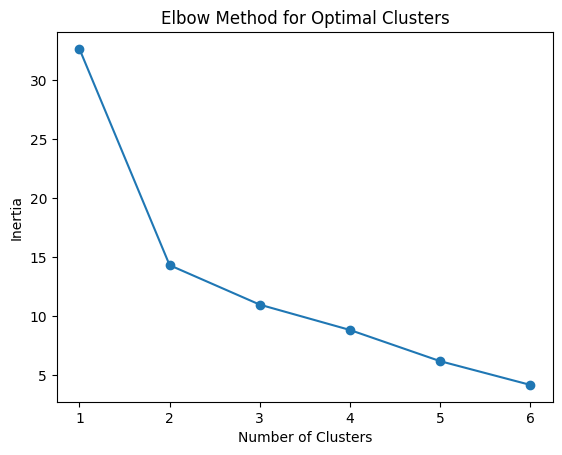

In [1221]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 7):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(pca_90s)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 7), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*  **Grid Search**



In [1222]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'init': ['k-means++', 'random']
}

# GridSearchCV
kmeans = KMeans()

grid_search = GridSearchCV(
    kmeans,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(pca_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters (GridSearchCV): {'init': 'random', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.56




*   **Random Search**



In [1223]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),  # Uniform distribution for eps
    'init': ['k-means++', 'random'] # Integer distribution for min_samples
}

kmeans = KMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    kmeans,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(pca_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.56




---



**Execute Kmeans Clustering**

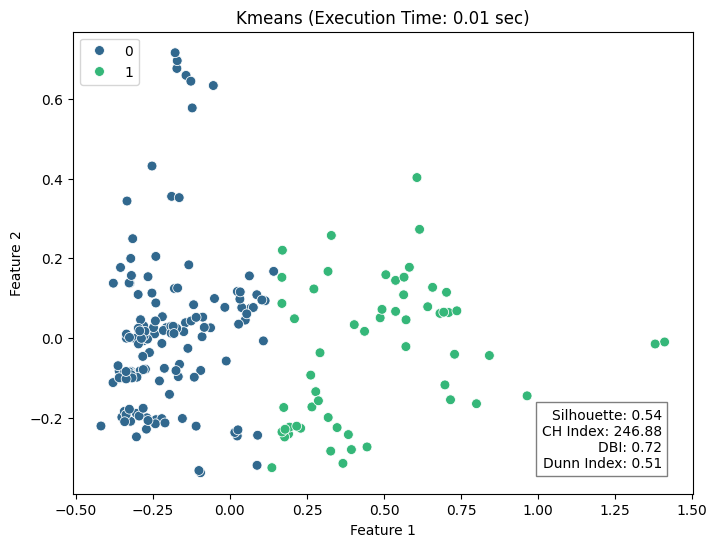

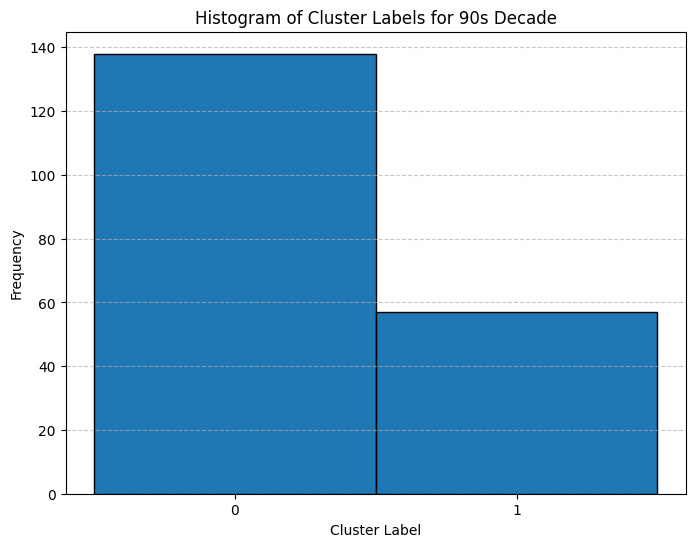

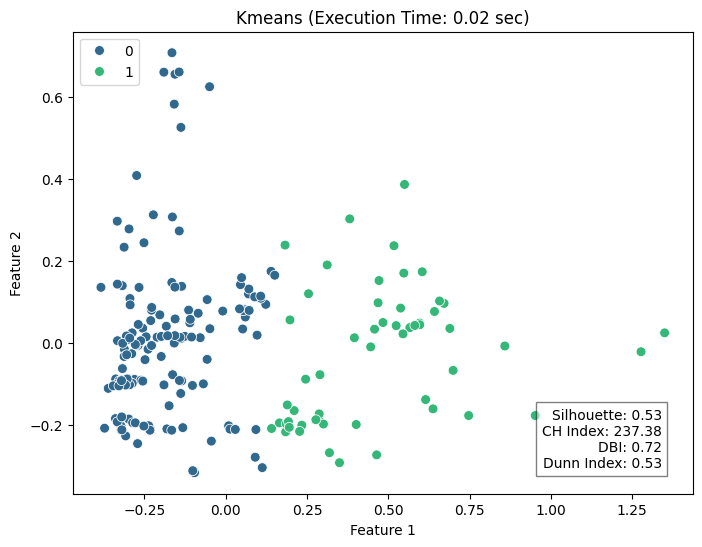

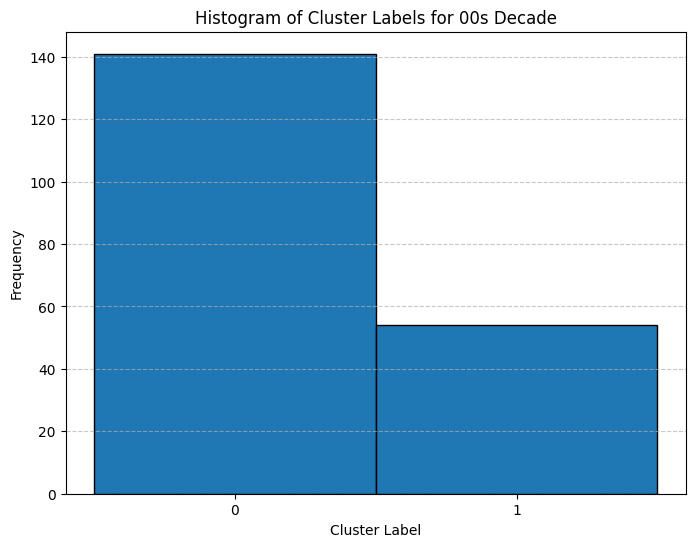

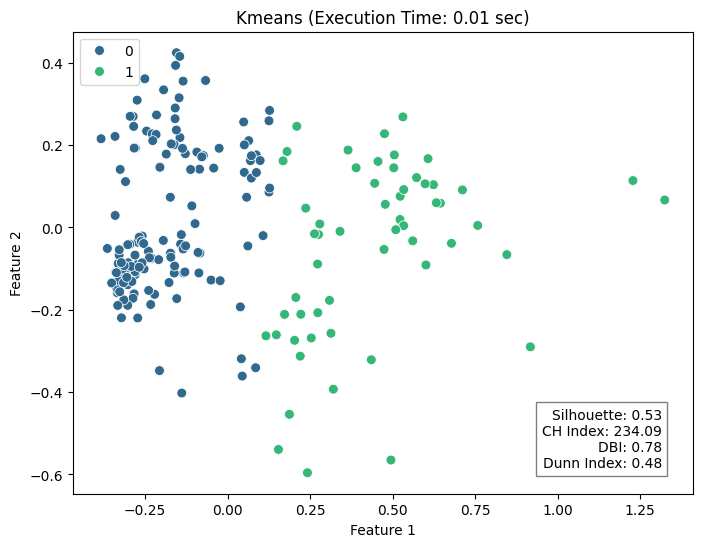

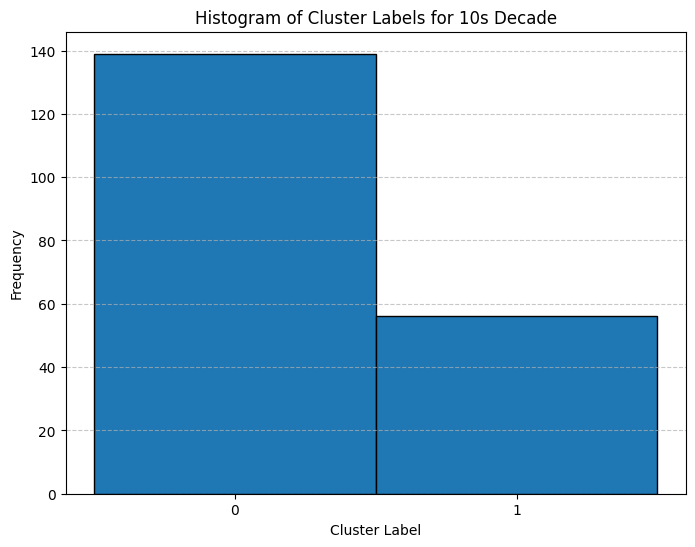

In [1224]:
kmeans_time = {}
pca_kmeans_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_pca, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    start_time = time.time()
    kmeans = KMeans(n_clusters=2, init = 'random', random_state=42)
    pca_kmeans_labels[i] = kmeans.fit_predict(data_pca)
    kmeans_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_pca, pca_kmeans_labels[i])
    #visualize
    plot_clusters_with_scores(data_pca, pca_kmeans_labels[i], "Kmeans", kmeans_time[i])
    plot_cluster_histograms(pca_kmeans_labels[i], decade_label)
    i = i + 1

In [1225]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "PCA",
                        "Clustering Algorithm": "Kmeans",
                        "Best Parameters": {'init': 'random', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": pca_time,
                        "Clustering Execution Time (s)": kmeans_time[i],
                        "Suggested Clusters": len(set(pca_kmeans_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849                  

### 1.4 Spectral Clustering

Hyperparameter Optimization



*   GridSearch



In [1226]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}

# GridSearchCV
SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')

grid_search = GridSearchCV(
    SC,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(pca_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (GridSearchCV): {'assign_labels': 'kmeans', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.47




*   RandomizedSearch


In [1227]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}


SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    SC,
    param_distributions=param_distributions,
    n_iter=18,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(pca_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (RandomizedSearchCV): {'n_clusters': 2, 'assign_labels': 'kmeans'}
Best Silhouette Score (RandomizedSearchCV): 0.47




---



**Execute Spectral Clustering**

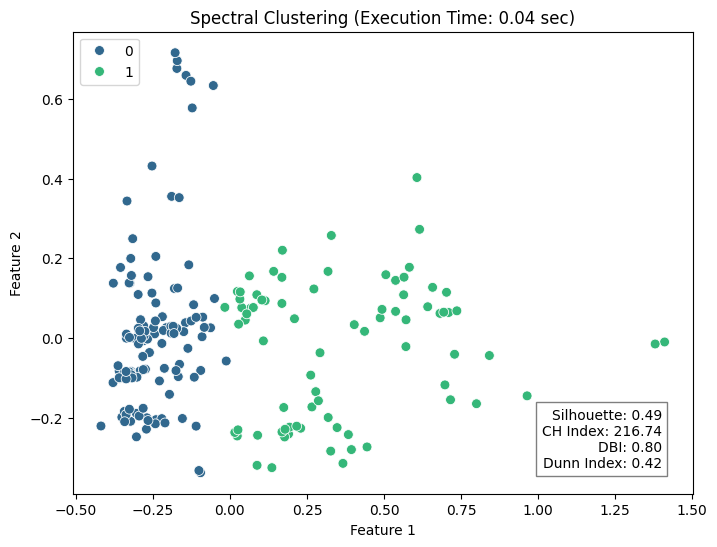

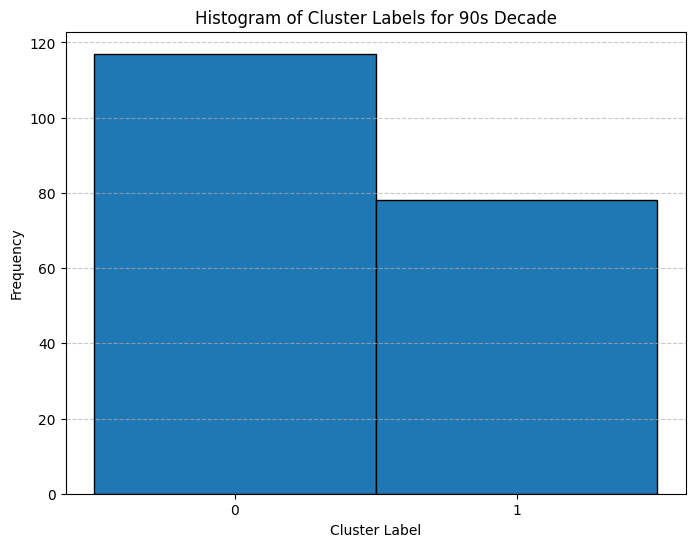

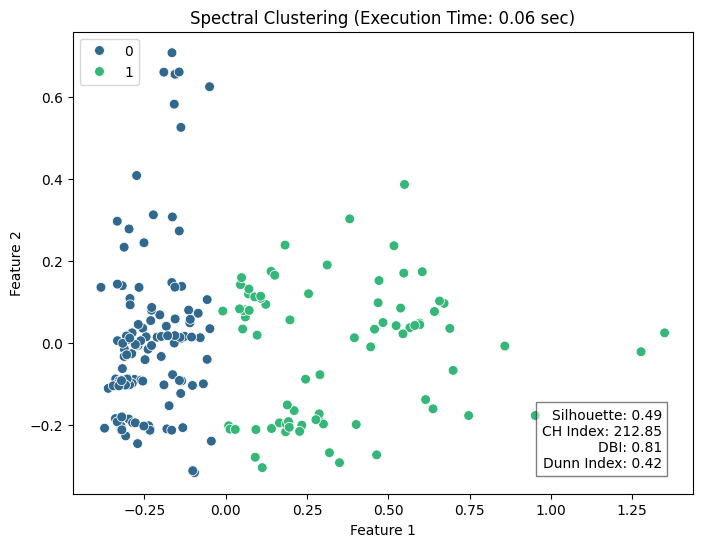

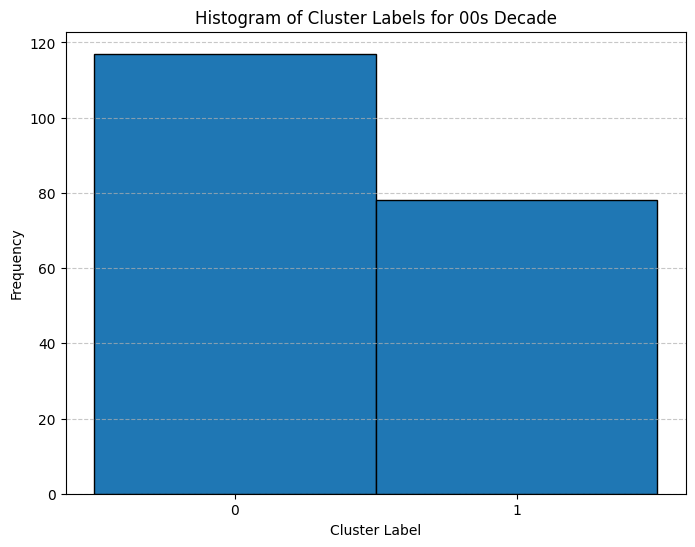

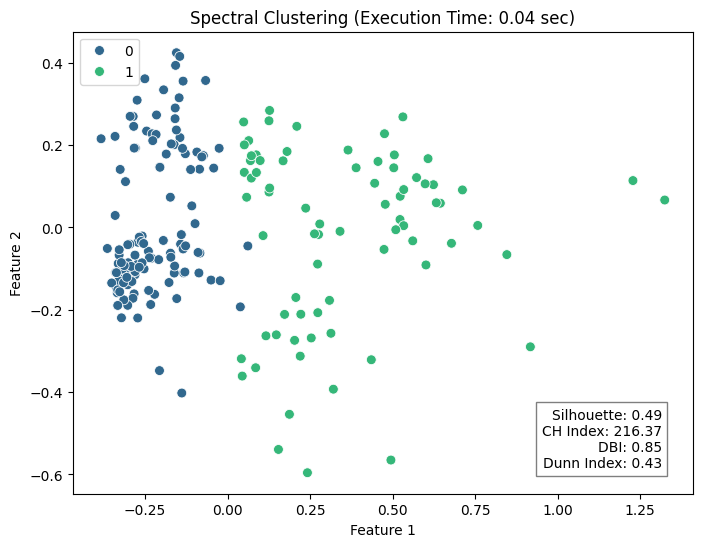

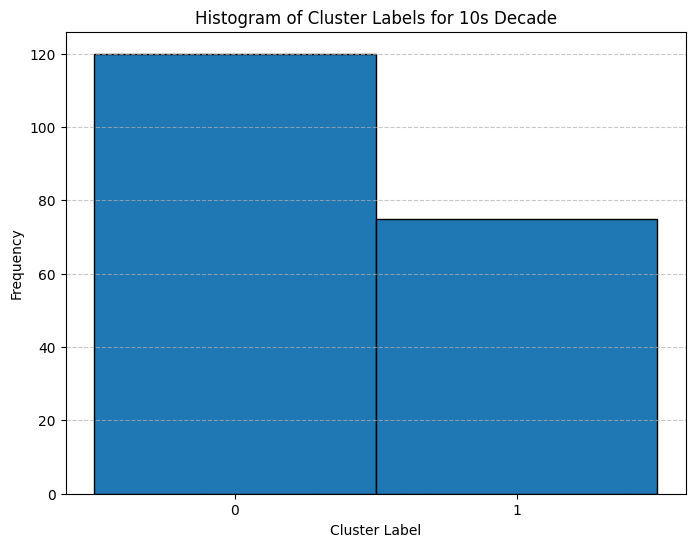

In [1228]:
sc_time = {}
pca_sc_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_pca, decade_label in reduced_data:

    # Perform Spectral Clustering
    start_time = time.time()
    SC = SpectralClustering(n_clusters=2, assign_labels='kmeans',random_state=42, affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')
    pca_sc_labels[i] = SC.fit_predict(data_pca)
    sc_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_pca, pca_sc_labels[i])
    #visualize
    plot_clusters_with_scores(data_pca, pca_sc_labels[i],"Spectral Clustering", sc_time[i])
    plot_cluster_histograms(pca_sc_labels[i], decade_label)
    i = i + 1

In [1229]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "PCA",
                        "Clustering Algorithm": "Spectral Clustering",
                        "Best Parameters": {'n_clusters': 2, 'assign_labels': 'kmeans'},
                        "Dimensionality Reduction Time (s)": pca_time,
                        "Clustering Execution Time (s)": sc_time[i],
                        "Suggested Clusters": len(set(pca_sc_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849                  

### 1.5 MeanShift

Hyperparameter Optimization

In [1232]:
for data_pca, decade_label in reduced_data:
    #estimate optimal bandwidth for each run
    bandwidth = estimate_bandwidth(data_pca)
    print(f"Estimated Bandwidth: {bandwidth:.2f}")

Estimated Bandwidth: 0.32
Estimated Bandwidth: 0.30
Estimated Bandwidth: 0.31


* RandomizedSearch

In [1230]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'bandwidth' : scipy.stats.uniform(0.1, 0.5)
}

meanshift = MeanShift()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    meanshift,
    param_distributions=param_distributions,
    n_iter=10,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(pca_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (RandomizedSearchCV): {'bandwidth': 0.412037280884873}
Best Silhouette Score (RandomizedSearchCV): 0.54


* GridSearch

In [1231]:
param_grid = {
    'bandwidth': np.linspace(0.1, 0.5)
}

meanshift = MeanShift()
grid_search = GridSearchCV(
    meanshift,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(pca_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (GridSearchCV): {'bandwidth': 0.3111111111111111}
Best score (GridSearchCV): 0.53




---



**Execute MeanShift Clustering**

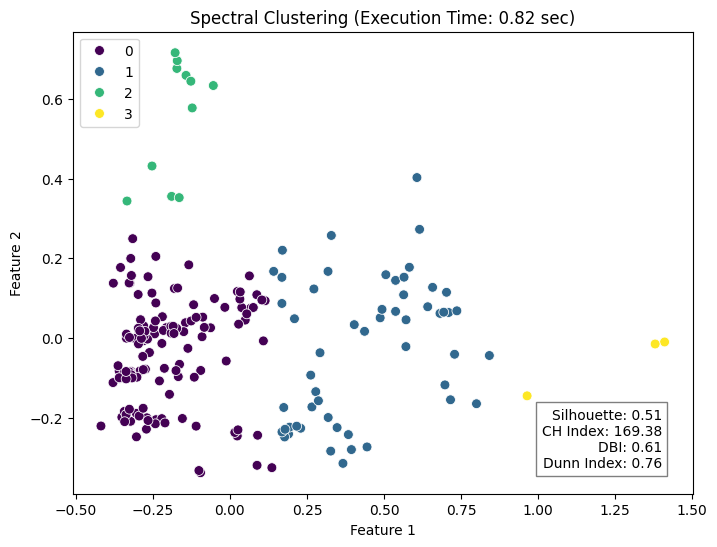

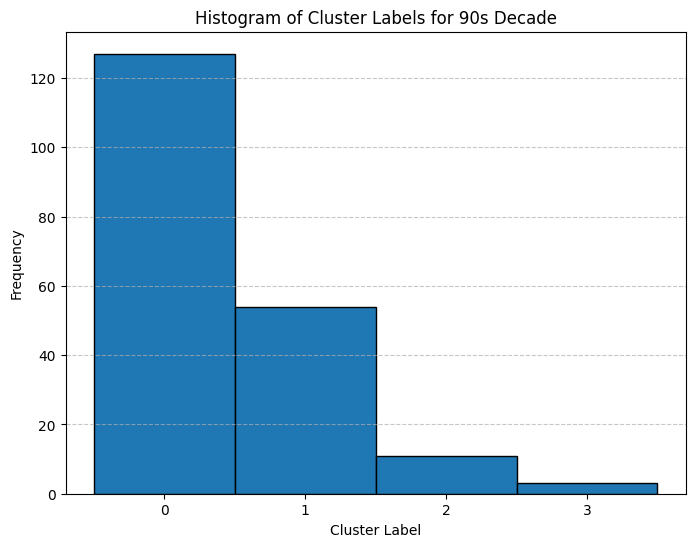

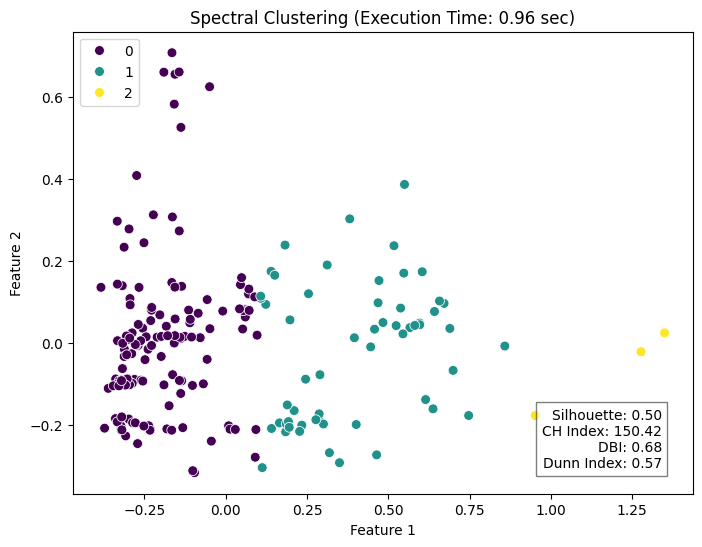

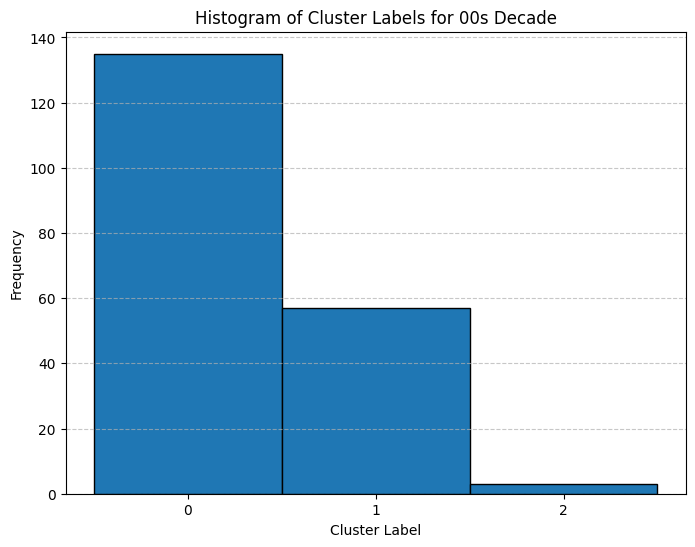

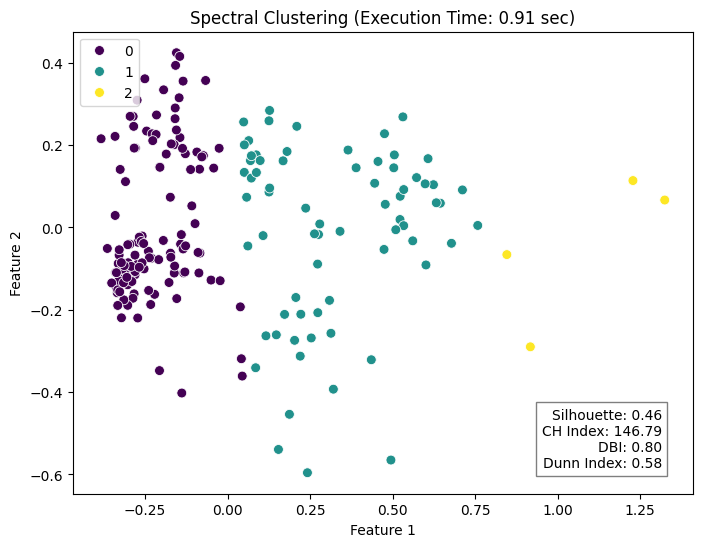

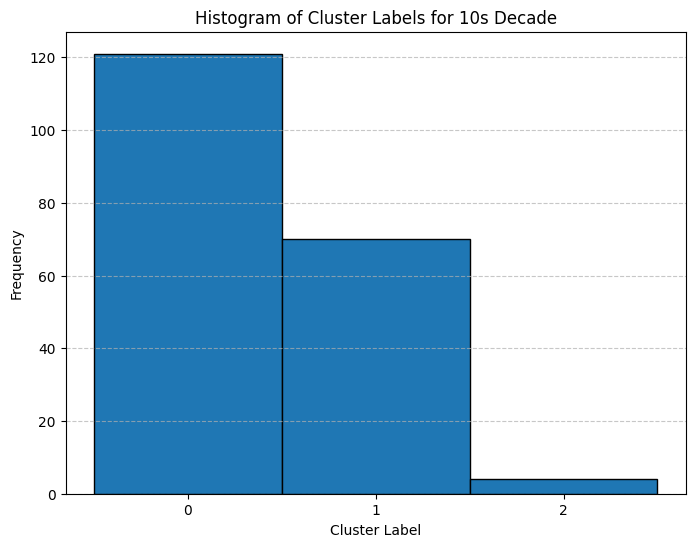

In [1233]:
ms_time = {}
pca_ms_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_pca, decade_label in reduced_data:

    # Perform MeanShift Clustering
    start_time = time.time()
    meanshift = MeanShift(bandwidth = 0.31)
    pca_ms_labels[i] = meanshift.fit_predict(data_pca)
    ms_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_pca, pca_ms_labels[i])
    #visualize
    plot_clusters_with_scores(data_pca, pca_ms_labels[i], "Spectral Clustering", ms_time[i])
    plot_cluster_histograms(pca_ms_labels[i], decade_label)
    i = i + 1

In [1234]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "PCA",
                        "Clustering Algorithm": "MeanShift",
                        "Best Parameters": {'bandwidth': 0.3},
                        "Dimensionality Reduction Time (s)": pca_time,
                        "Clustering Execution Time (s)": ms_time[i],
                        "Suggested Clusters": len(set(pca_ms_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

  Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                      Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                      Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                      Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849                  

## 2. Clustering with t-SNE

### Perform t-SNE

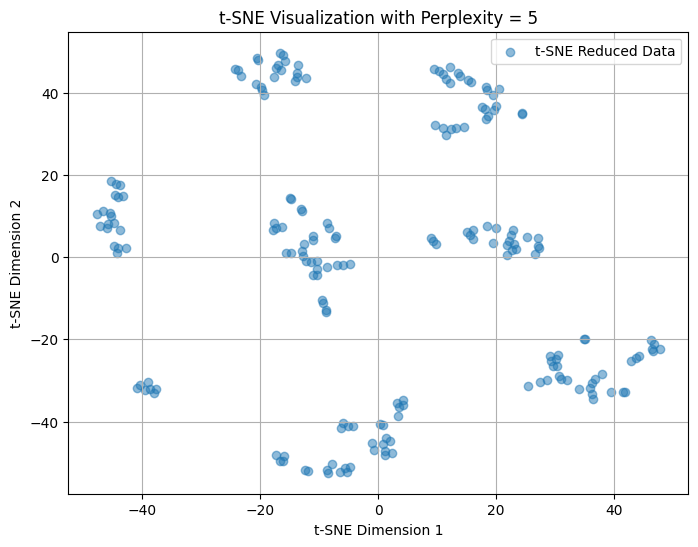

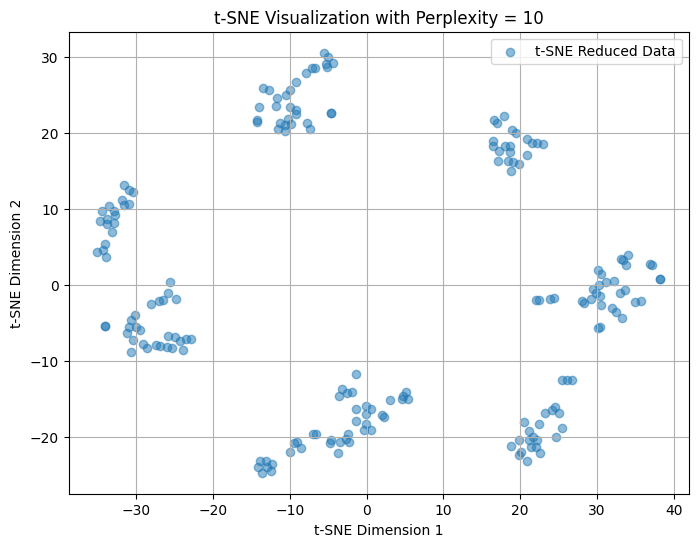

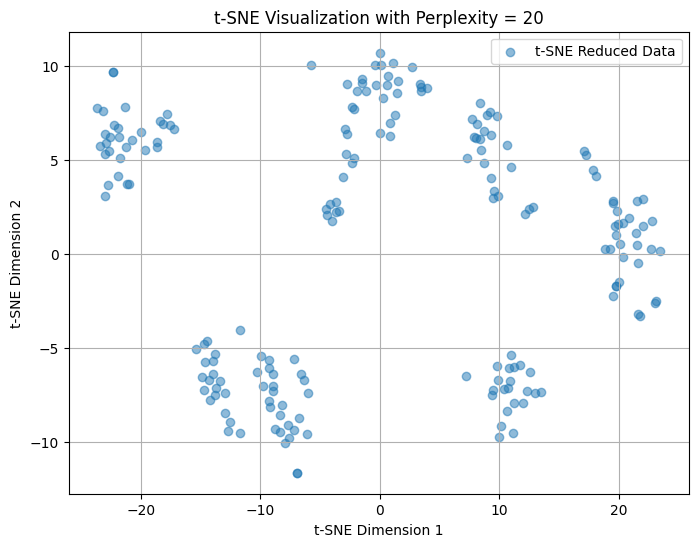

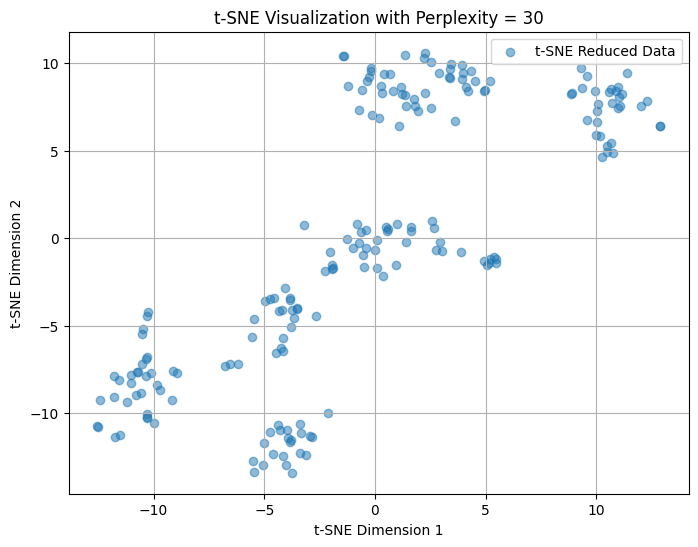

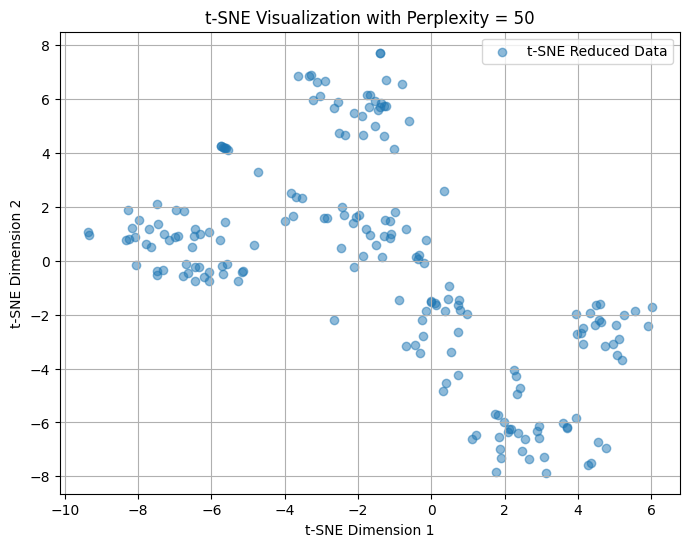

In [1235]:
# Experiment with different perplexity values
perplexities = [5, 10, 20, 30, 50]

for perplexity in perplexities:
    tsne = TSNE(n_components=2, perplexity=perplexity)
    test_tsne = tsne.fit_transform(df_90s)

    plt.figure(figsize=(8, 6))



    plt.scatter(test_tsne[:, 0], test_tsne[:, 1], label='t-SNE Reduced Data', alpha=0.5)
    plt.title(f"t-SNE Visualization with Perplexity = {perplexity}")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")


    plt.legend()
    plt.grid(True)
    plt.show()

t-SNE Training Time: 3.58 seconds


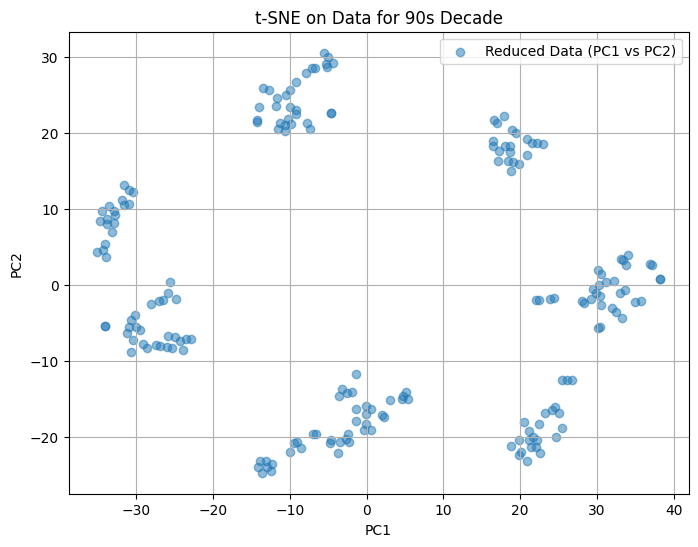

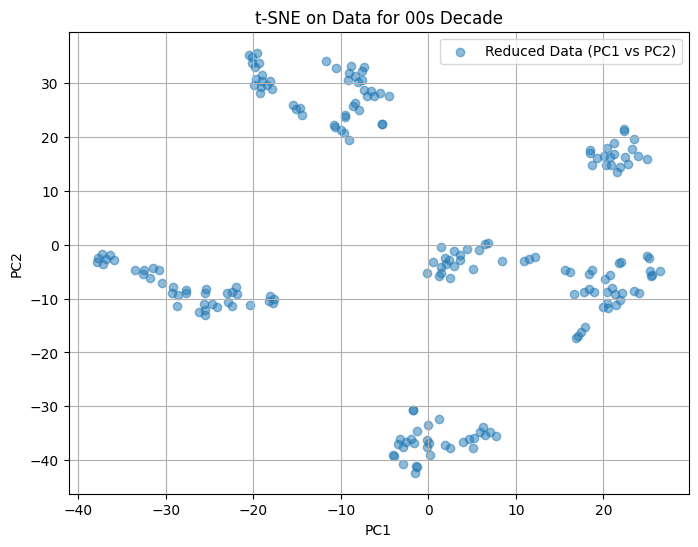

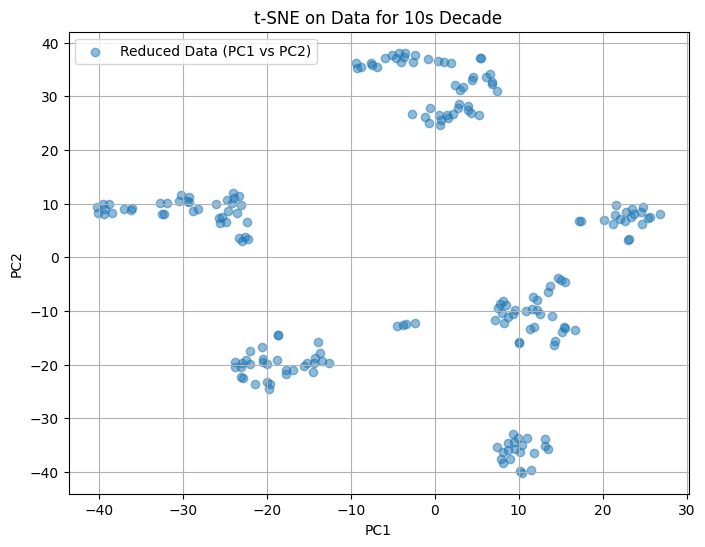

In [1236]:
tsne = TSNE(n_components=2, perplexity = 10)

start_time = time.time()
#tsne dimensionality reduction for 00s decade
tsne_90s = tsne.fit_transform(df_90s)

#tsne dimensionality reduction for 00s decade
tsne_00s = tsne.fit_transform(df_00s)

#tsne dimensionality reduction for 10s decade
tsne_10s = tsne.fit_transform(df_10s)
tsne_time = time.time() - start_time

print(f"t-SNE Training Time: {tsne_time:.2f} seconds")

reduced_data = [
    (tsne_90s, "90s"),
    (tsne_00s, "00s"),
    (tsne_10s, "10s"),
]

# Visualization
for data, decade_label in reduced_data:
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], label='Reduced Data (PC1 vs PC2)', alpha=0.5)
    plt.title(f"t-SNE on Data for {decade_label} Decade")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.grid(True)
    plt.show()

### 2.1 MiniBatch KMeans

HyperParameter Optimization



*   **Elbow Method**



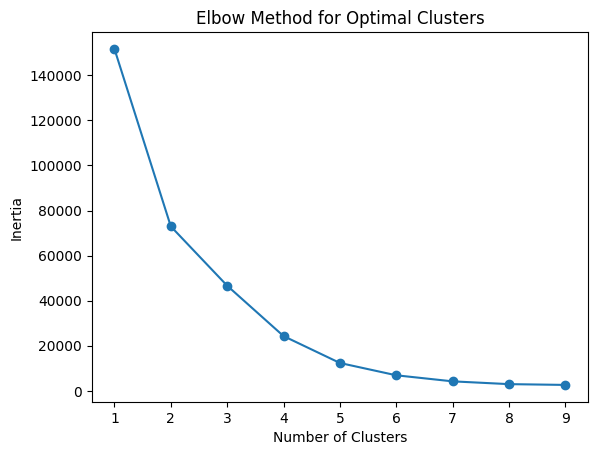

In [1237]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 10):
    minibatch = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    minibatch.fit(tsne_90s)
    inertia.append(minibatch.inertia_)

# Plot the elbow curve
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*   **Grid Search**


In [1238]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

# GridSearchCV
minibatch = MiniBatchKMeans()

grid_search = GridSearchCV(
    minibatch,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(tsne_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters (GridSearchCV): {'batch_size': 50, 'init': 'k-means++', 'n_clusters': 6}
Best Silhouette Score (GridSearchCV): 0.72




*   **Random Search**



In [1239]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

minibatch = MiniBatchKMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    minibatch,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(tsne_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'batch_size': 20, 'init': 'k-means++', 'n_clusters': 6}
Best Silhouette Score (RandomizedSearchCV): 0.72




---



**Run MiniBatch Kmeans**

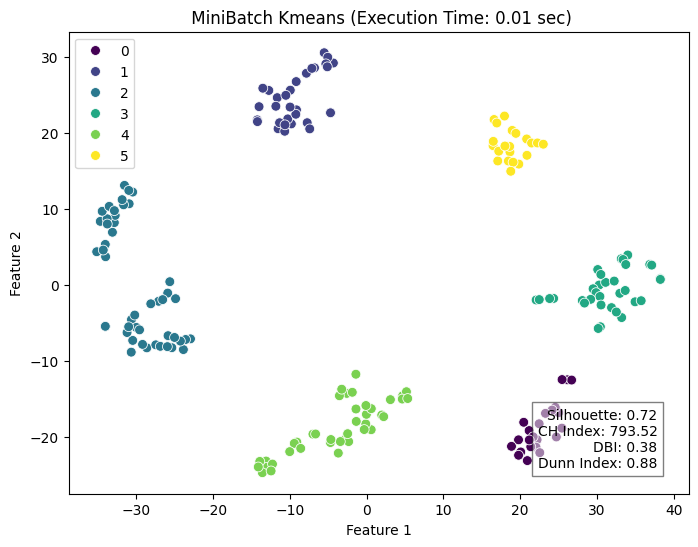

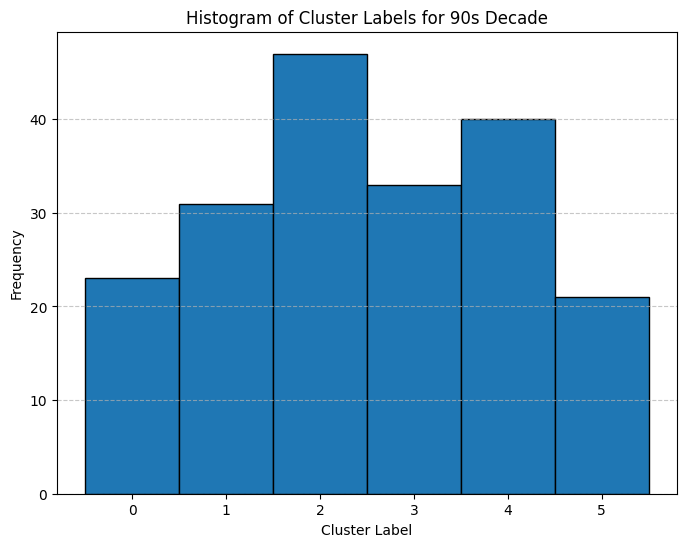

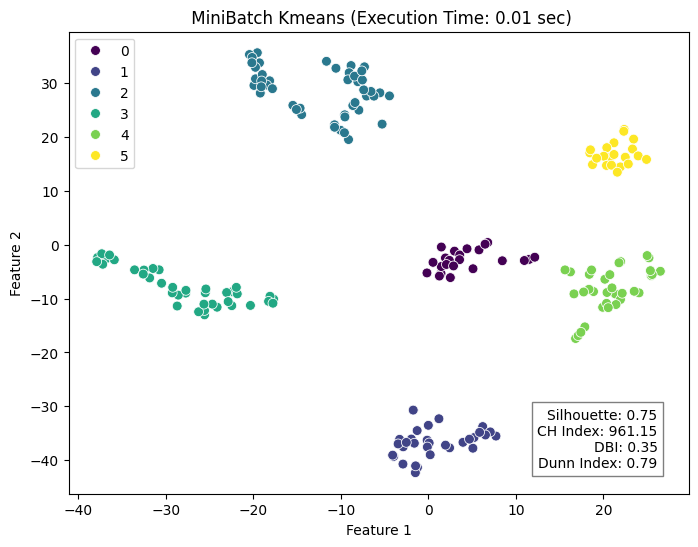

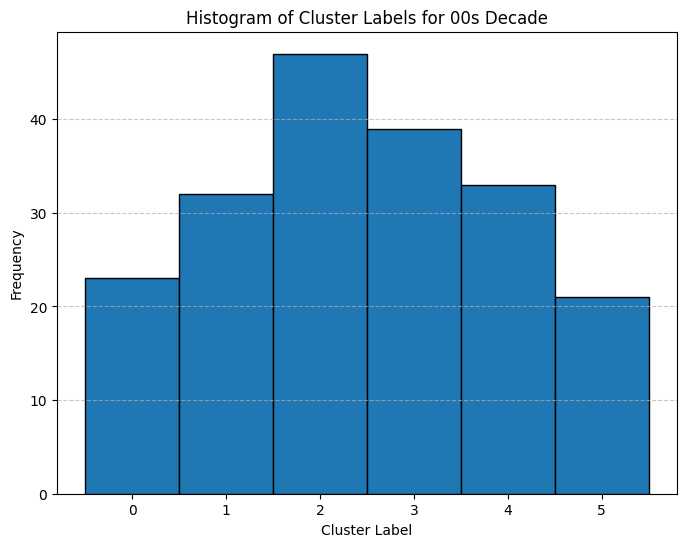

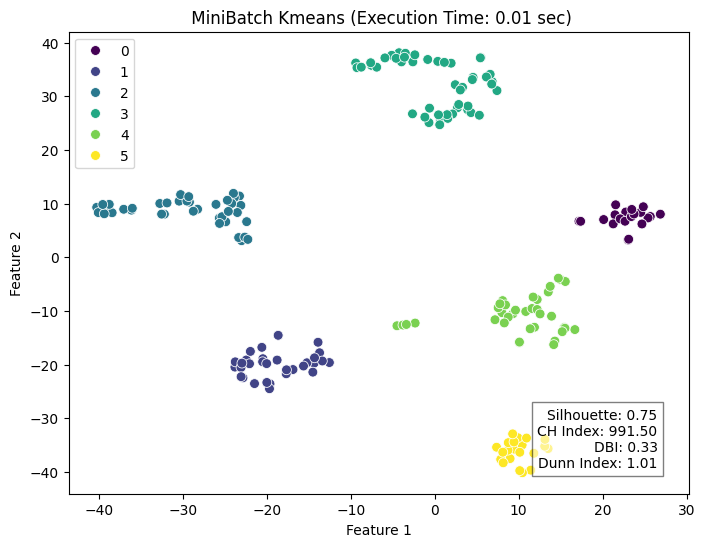

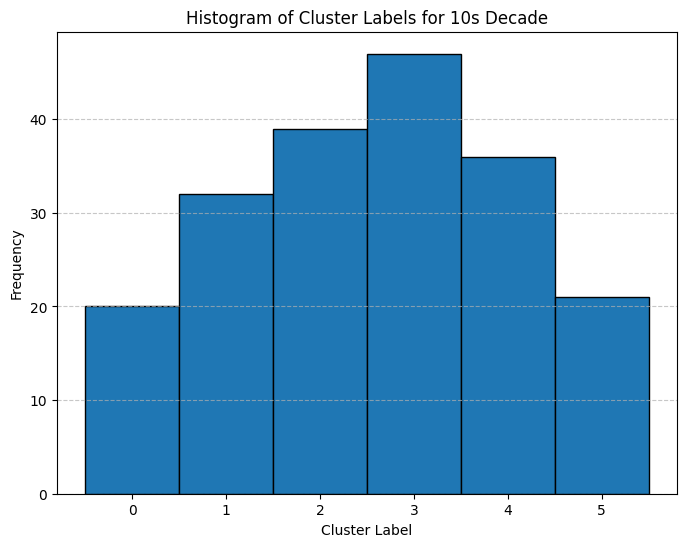

In [1240]:
minibatch_time = {}
tsne_minibatch_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_tsne, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    time_start = time.time()
    minibatch = MiniBatchKMeans(n_clusters = 6, batch_size = 20, init = 'k-means++',  random_state=42)
    tsne_minibatch_labels[i] = minibatch.fit_predict(data_tsne)
    minibatch_time[i] = time.time() - time_start


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i]= performance_score(data_tsne, tsne_minibatch_labels[i])
    #visualize
    plot_clusters_with_scores(data_tsne, tsne_minibatch_labels[i]," MiniBatch Kmeans", minibatch_time[i])
    plot_cluster_histograms(tsne_minibatch_labels[i], decade_label)
    i = i + 1

In [1241]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "t-SNE",
                        "Clustering Algorithm": "MiniBatch Kmeans",
                        "Best Parameters": {'batch_size': 20, 'init': 'k-means++', 'n_clusters': 6},
                        "Dimensionality Reduction Time (s)": tsne_time,
                        "Clustering Execution Time (s)": minibatch_time[i],
                        "Suggested Clusters": len(set(tsne_minibatch_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 2.2 DBSCAN

Hyperparameter optimization

Calculate the distances between each point and use the two values as the max and min values for hyperparameter optimization of the epsilon parameter

In [1242]:
# Example usage for t-SNE reduced data of the 90s decade
min_eps_90s, max_eps_90s = optimize_eps(tsne_90s)
print(f"Suggested min_eps for 90s: {min_eps_90s}")
print(f"Suggested max_eps for 90s: {max_eps_90s}")


min_eps_00s, max_eps_00s = optimize_eps(tsne_00s)
print(f"Suggested min_eps for 00s: {min_eps_00s}")
print(f"Suggested max_eps for 00s: {max_eps_00s}")

min_eps_10s, max_eps_10s = optimize_eps(tsne_10s)
print(f"Suggested min_eps for 10s: {min_eps_10s}")
print(f"Suggested max_eps for 10s: {max_eps_10s}")

Suggested min_eps for 90s: 0.6577629422357217
Suggested max_eps for 90s: 0.960115530313391
Suggested min_eps for 00s: 0.6577629422357217
Suggested max_eps for 00s: 0.960115530313391
Suggested min_eps for 10s: 0.6577629422357217
Suggested max_eps for 10s: 0.960115530313391


* Randomized Search   



In [1291]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'eps': scipy.stats.uniform(0.3, 1.0),  # Uniform distribution for eps
    'min_samples': scipy.stats.randint(2, 11)  # Integer distribution for min_samples
}

dbscan = DBSCAN()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    dbscan,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(tsne_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'eps': 0.5962735057040824, 'min_samples': 2}
Best Silhouette Score (RandomizedSearchCV): -0.12068894542753697




*   GridSearch



In [1292]:
# Parameter grid for GridSearchCV
param_grid = {
    'eps': np.linspace(0.3, 1.0),  # Uniform grid for eps
    'min_samples': range(2, 11)        # Integer range for min_samples
}

# GridSearchCV
dbscan = DBSCAN()

grid_search = GridSearchCV(
    dbscan,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(tsne_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_}")

Fitting 5 folds for each of 450 candidates, totalling 2250 fits
Best parameters (GridSearchCV): {'eps': 0.5142857142857142, 'min_samples': 2}
Best Silhouette Score (GridSearchCV): -0.031005069985985755




---------------------------------------



**Execute DBSCAN Clustering**

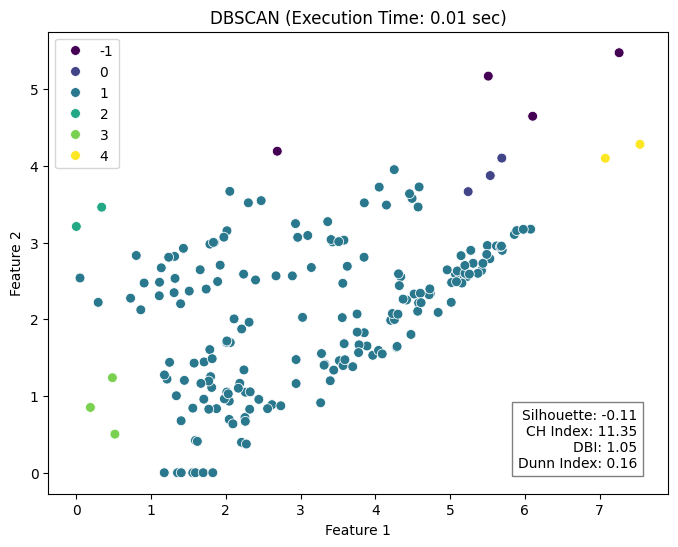

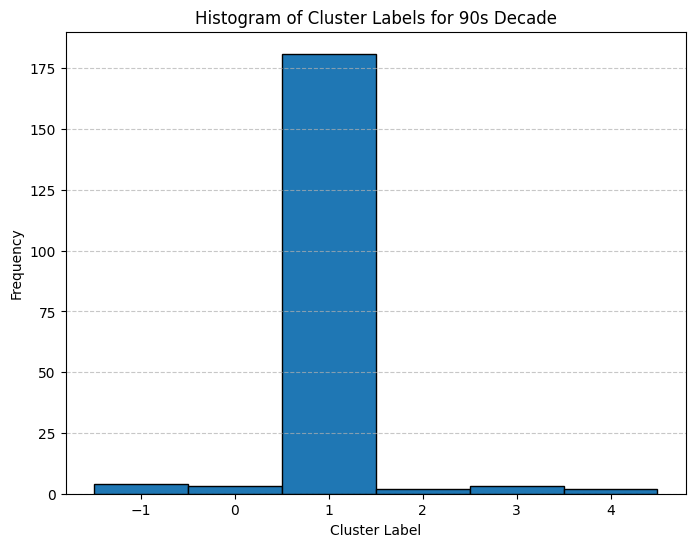

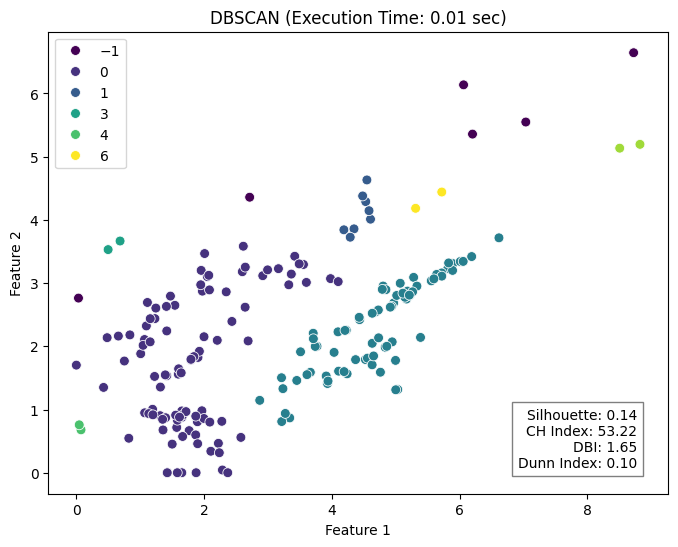

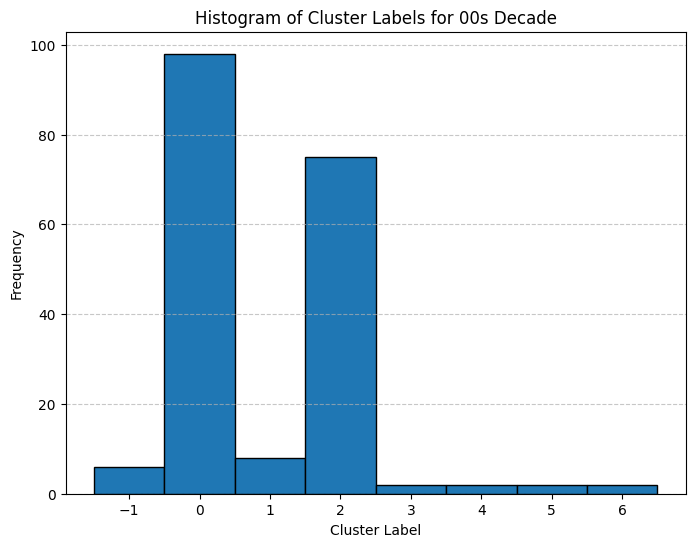

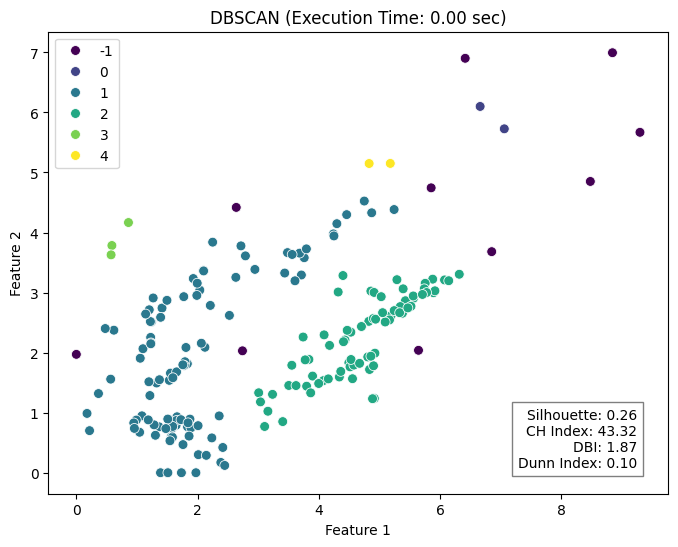

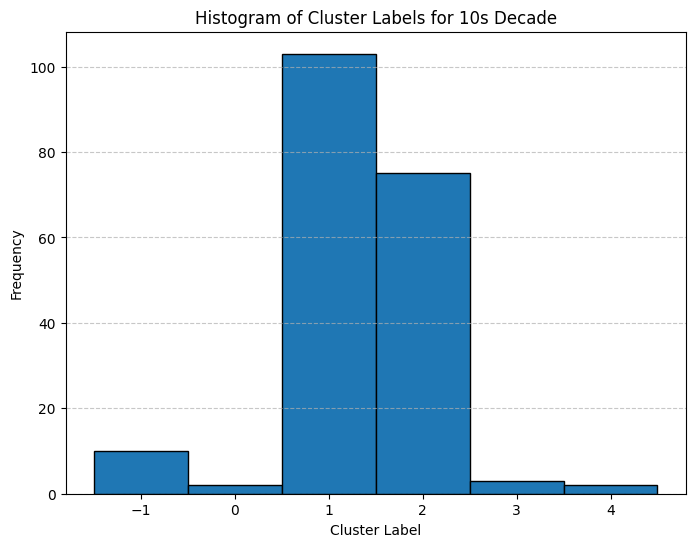

In [1293]:
dbscan_time = {}
tsne_dbscan_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_tsne, decade_label in reduced_data:

    # Perform DBSCAN clustering
    start_time = time.time()
    dbscan = DBSCAN(eps=0.6, min_samples=2)
    tsne_dbscan_labels[i] = dbscan.fit_predict(data_tsne)
    dbscan_time[i] = time.time() - start_time


    #visualize dbscan clustering with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_tsne, tsne_dbscan_labels[i])
    #visualize
    plot_clusters_with_scores(data_tsne, tsne_dbscan_labels[i],"DBSCAN", dbscan_time[i])
    plot_cluster_histograms(tsne_dbscan_labels[i], decade_label)
    i = i + 1

In [1246]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "t-SNE",
                        "Clustering Algorithm": "DBSCAN",
                        "Best Parameters": {'eps': 0.4, 'min_samples': 2},
                        "Dimensionality Reduction Time (s)": tsne_time,
                        "Clustering Execution Time (s)": dbscan_time[i],
                        "Suggested Clusters": len(set(tsne_dbscan_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 2.3 KMeans

HyperParameter Optimization



*   **Elbow Method**


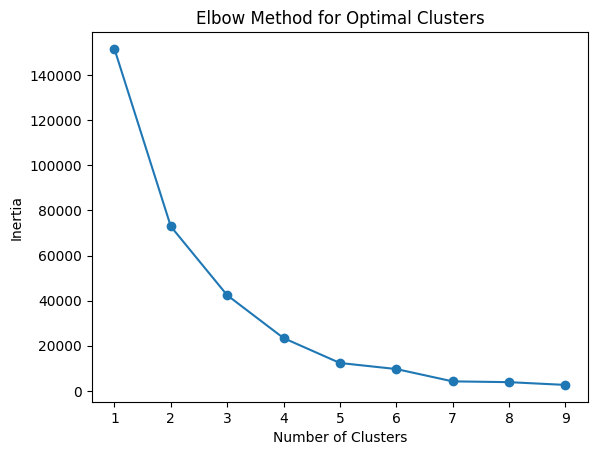

In [1247]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(tsne_90s)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*  **Grid Search**



In [1248]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'init': ['k-means++', 'random']
}

# GridSearchCV
kmeans = KMeans()

grid_search = GridSearchCV(
    kmeans,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(tsne_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters (GridSearchCV): {'init': 'k-means++', 'n_clusters': 6}
Best Silhouette Score (GridSearchCV): 0.72




*   **Random Search**



In [1249]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),  # Uniform distribution for eps
    'init': ['k-means++', 'random'] # Integer distribution for min_samples
}

kmeans = KMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    kmeans,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(tsne_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'init': 'random', 'n_clusters': 6}
Best Silhouette Score (RandomizedSearchCV): 0.72




---



**Execute Kmeans Clustering**

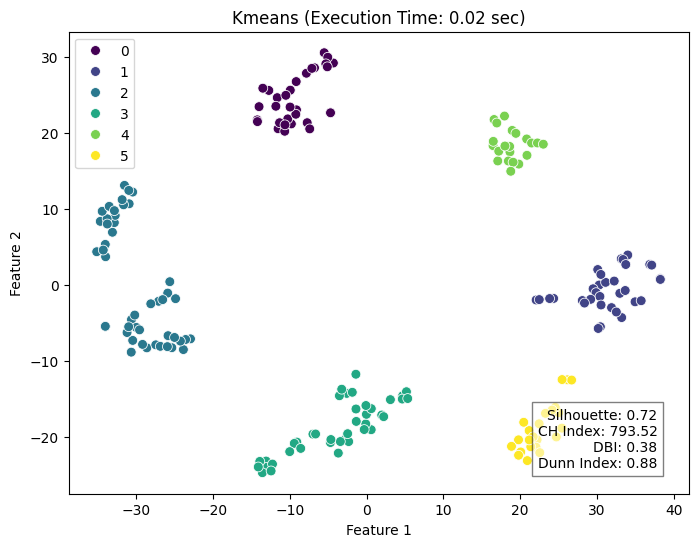

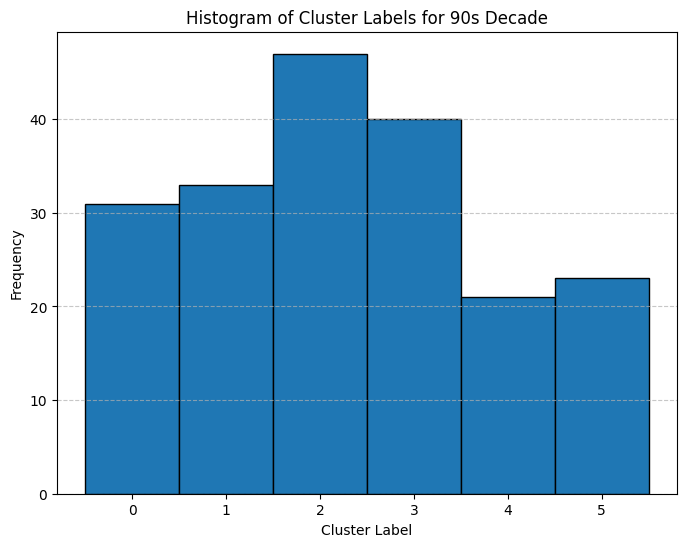

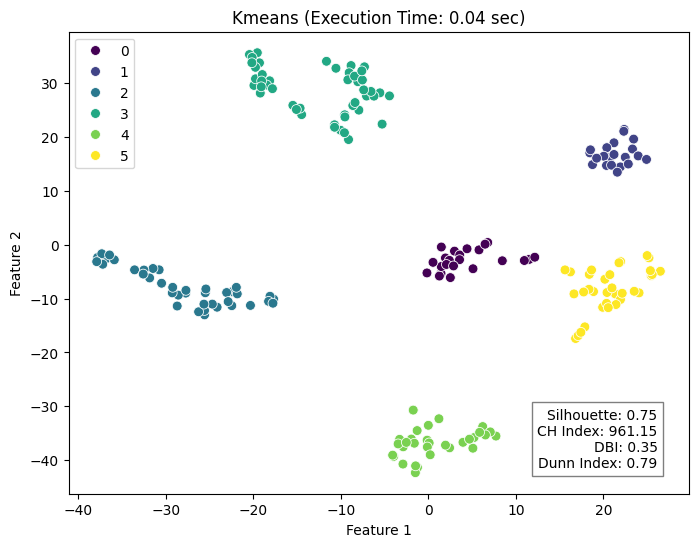

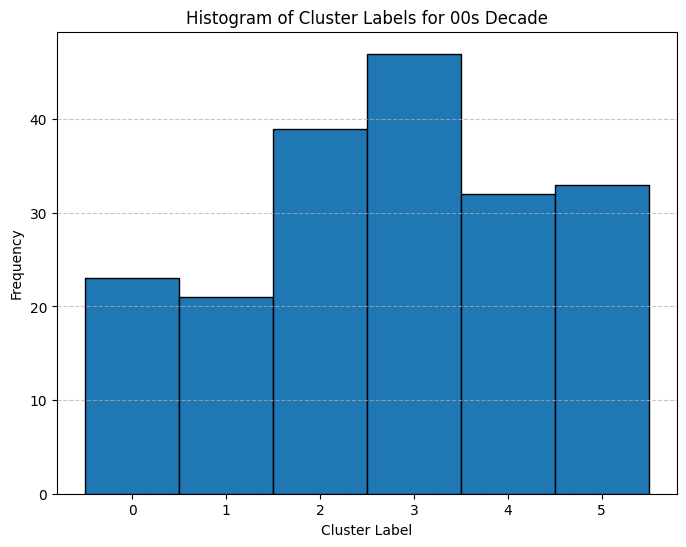

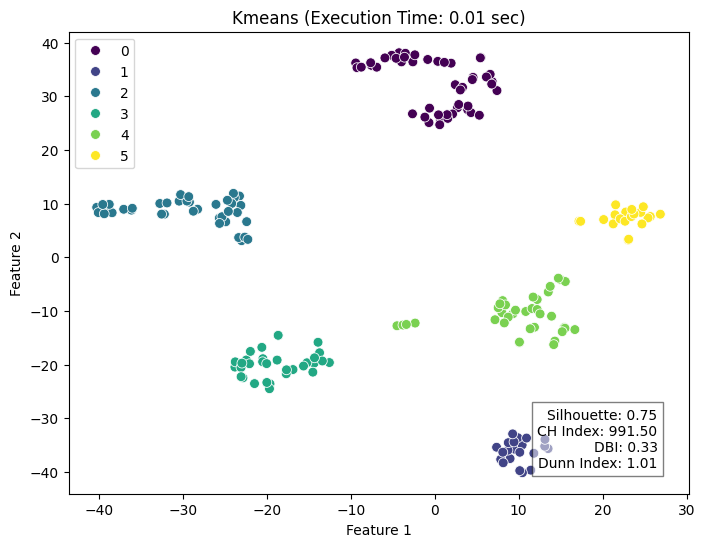

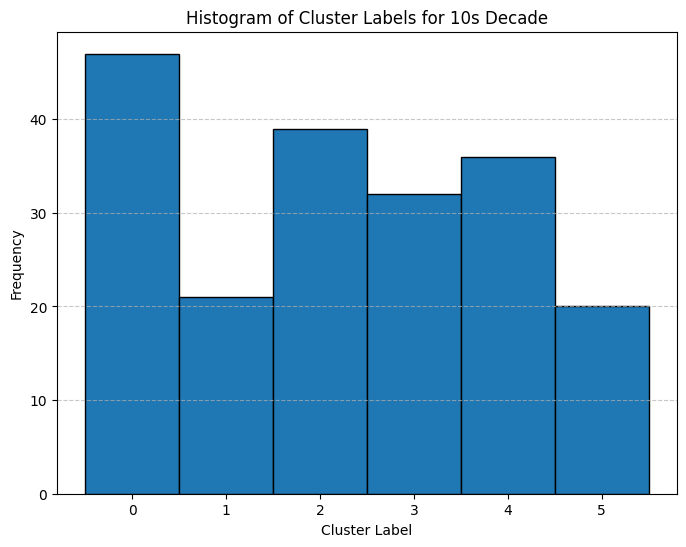

In [1250]:
kmeans_time = {}
tsne_kmeans_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_tsne, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    start_time = time.time()
    kmeans = KMeans(n_clusters=6, init = 'random', random_state=42)
    tsne_kmeans_labels[i] = kmeans.fit_predict(data_tsne)
    kmeans_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_tsne, tsne_kmeans_labels[i])
    #visualize
    plot_clusters_with_scores(data_tsne, tsne_kmeans_labels[i], "Kmeans", kmeans_time[i])
    plot_cluster_histograms(tsne_kmeans_labels[i], decade_label)
    i = i + 1

In [1251]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "t-SNE",
                        "Clustering Algorithm": "Kmeans",
                        "Best Parameters": {'init': 'random', 'n_clusters': 6},
                        "Dimensionality Reduction Time (s)": tsne_time,
                        "Clustering Execution Time (s)": kmeans_time[i],
                        "Suggested Clusters": len(set(tsne_kmeans_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 2.4 Spectral Clustering

Hyperparameter Optimization



*   GridSearch



In [1252]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}

# GridSearchCV
SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=35, eigen_solver='arpack')

grid_search = GridSearchCV(
    SC,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(tsne_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (GridSearchCV): {'assign_labels': 'kmeans', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.48




*   RandomizedSearch


In [1253]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}


SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=35, eigen_solver='arpack')

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    SC,
    param_distributions=param_distributions,
    n_iter=18,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(tsne_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (RandomizedSearchCV): {'n_clusters': 2, 'assign_labels': 'kmeans'}
Best Silhouette Score (RandomizedSearchCV): 0.48




---



**Execute Spectral Clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


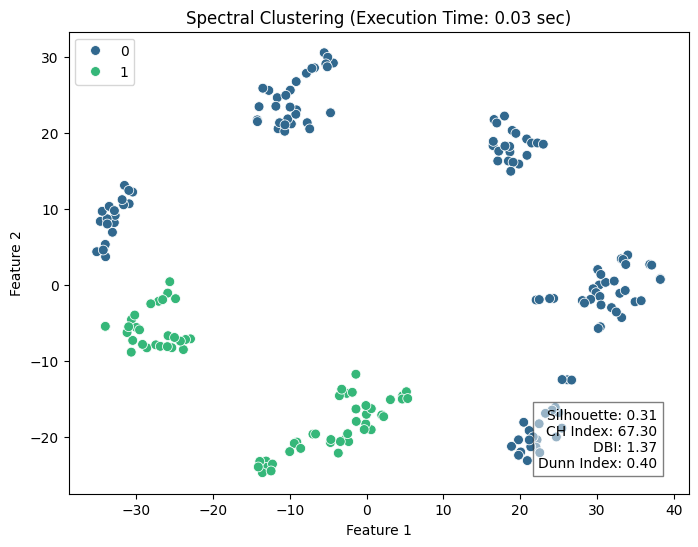

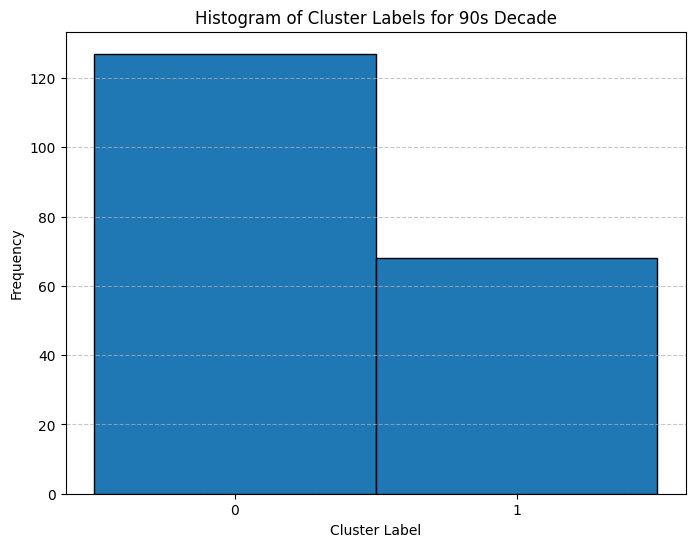

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


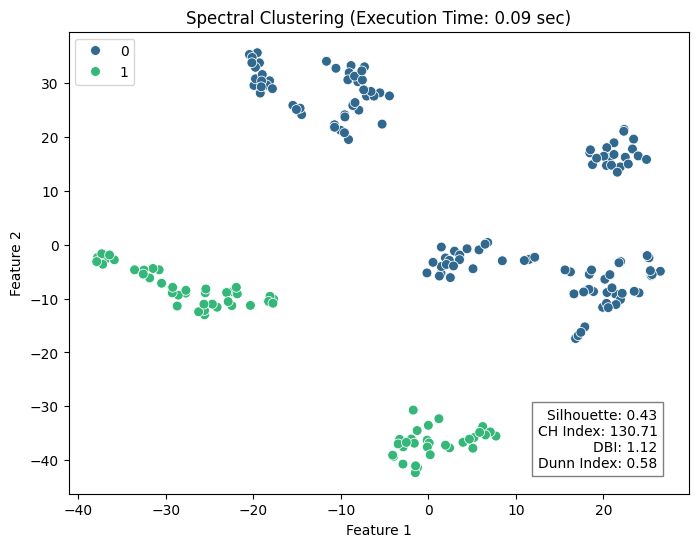

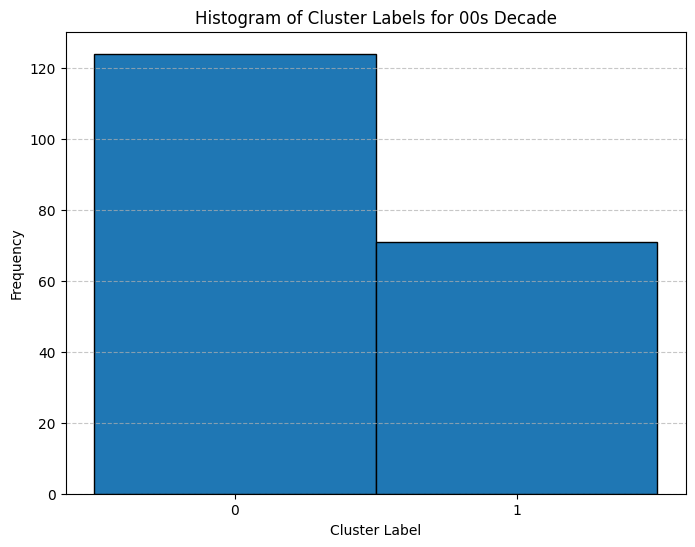

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


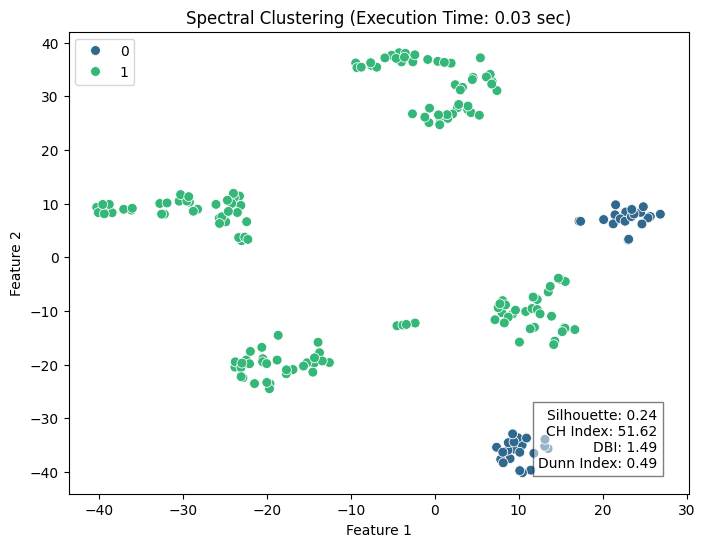

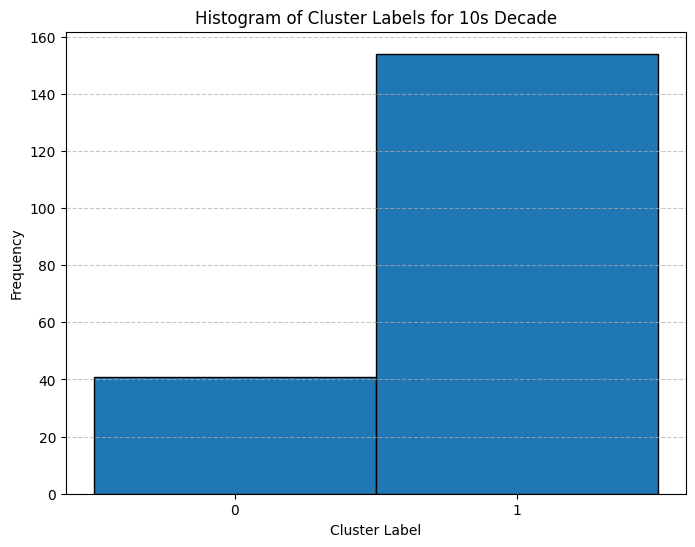

In [1254]:
sc_time = {}
tsne_sc_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_tsne, decade_label in reduced_data:

    # Perform Spectral Clustering
    start_time = time.time()
    SC = SpectralClustering(n_clusters=2, assign_labels='kmeans',random_state=42, affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')
    tsne_sc_labels[i] = SC.fit_predict(data_tsne)
    sc_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_tsne, tsne_sc_labels[i])
    #visualize
    plot_clusters_with_scores(data_tsne, tsne_sc_labels[i],"Spectral Clustering", sc_time[i])
    plot_cluster_histograms(tsne_sc_labels[i], decade_label)
    i = i + 1

In [1255]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "t-SNE",
                        "Clustering Algorithm": "Spectral Clustering",
                        "Best Parameters": {'n_clusters': 2, 'assign_labels': 'kmeans'},
                        "Dimensionality Reduction Time (s)": tsne_time,
                        "Clustering Execution Time (s)": sc_time[i],
                        "Suggested Clusters": len(set(tsne_sc_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 2.5 MeanShift

Hyperparameter Optimization

In [1256]:
for data_tsne, decade_label in reduced_data:
    #estimate optimal bandwidth for each run
    bandwidth = estimate_bandwidth(data_tsne)
    print(f"Estimated Bandwidth: {bandwidth:.2f}")

Estimated Bandwidth: 25.47
Estimated Bandwidth: 29.51
Estimated Bandwidth: 29.37


* RandomizedSearch

In [1257]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'bandwidth': np.linspace(20.0, 30.0, 10)
}

meanshift = MeanShift()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    meanshift,
    param_distributions=param_distributions,
    n_iter=10,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(tsne_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (RandomizedSearchCV): {'bandwidth': 21.11111111111111}
Best Silhouette Score (RandomizedSearchCV): 0.60


* GridSearch

In [1258]:
param_grid = {
    'bandwidth': np.linspace(20.0, 30.0, 10)
}

meanshift = MeanShift()
grid_search = GridSearchCV(
    meanshift,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(tsne_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (GridSearchCV): {'bandwidth': 21.11111111111111}
Best score (GridSearchCV): 0.60




---



**Execute MeanShift Clustering**

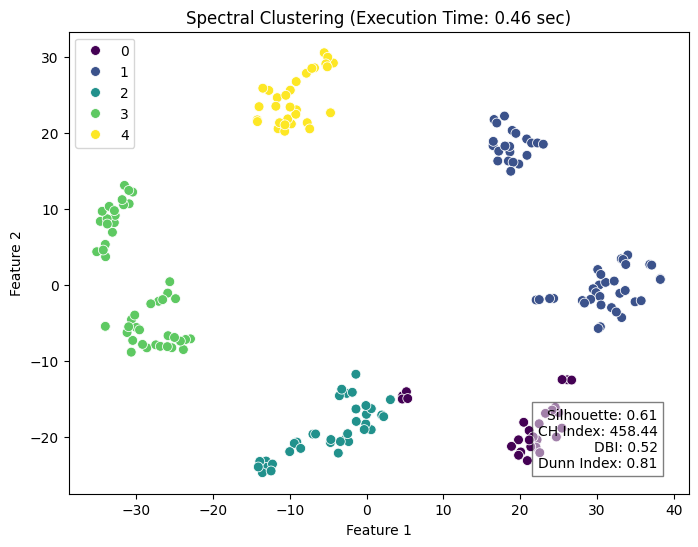

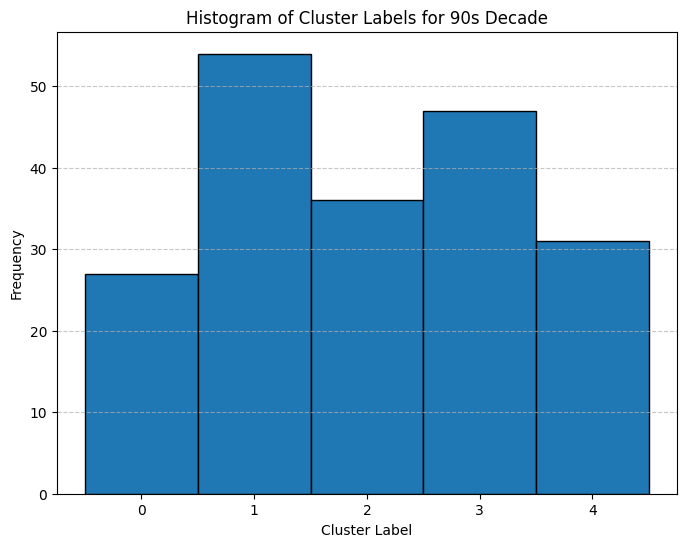

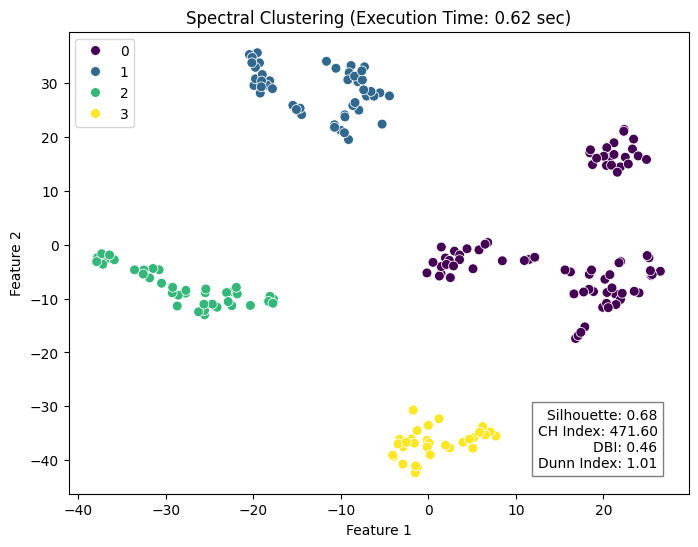

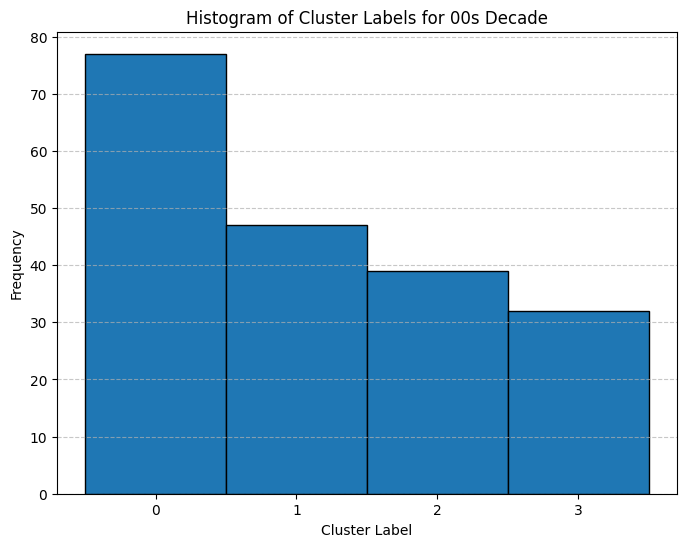

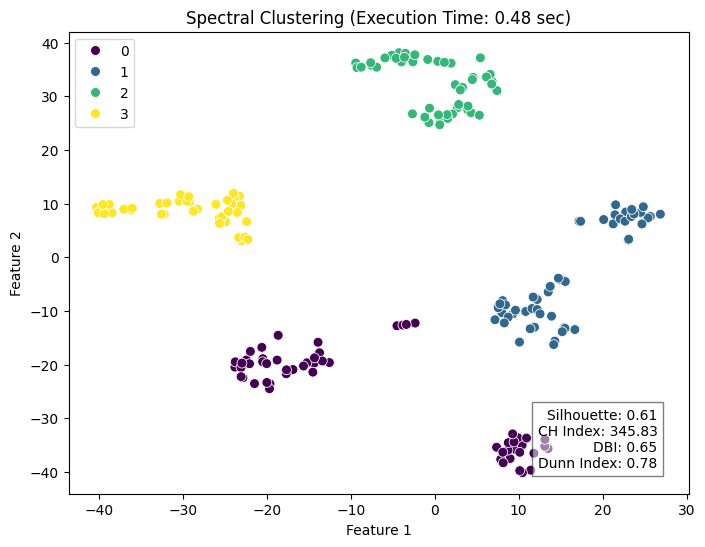

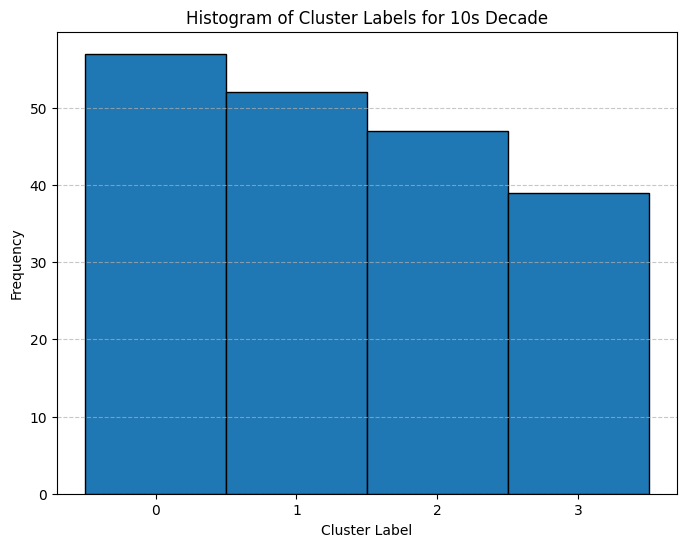

In [1259]:
ms_time = {}
tsne_ms_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_tsne, decade_label in reduced_data:

    # Perform MeanShift Clustering
    start_time = time.time()
    meanshift = MeanShift(bandwidth = 21.1)
    tsne_ms_labels[i] = meanshift.fit_predict(data_tsne)
    ms_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_tsne, tsne_ms_labels[i])
    #visualize
    plot_clusters_with_scores(data_tsne, tsne_ms_labels[i], "Spectral Clustering", ms_time[i])
    plot_cluster_histograms(tsne_ms_labels[i], decade_label)
    i = i + 1

In [1260]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "t-SNE",
                        "Clustering Algorithm": "MeanShift",
                        "Best Parameters": {'bandwidth': 0.3},
                        "Dimensionality Reduction Time (s)": tsne_time,
                        "Clustering Execution Time (s)": ms_time[i],
                        "Suggested Clusters": len(set(tsne_ms_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

##3. Clustering with SAE

### Perform SAE

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0869 - val_loss: 0.0807
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0808 - val_loss: 0.0684
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0631 - val_loss: 0.0524
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0509 - val_loss: 0.0437
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0432 - val_loss: 0.0379
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0362 - val_loss: 0.0323
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0331 - val_loss: 0.0267
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0277 - val_loss: 0.0221
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0238 - val_loss: 0.0201
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0213 - val_loss: 0.0187
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0196 - val_loss: 0.0176
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step -

<ipython-input-1262-9b737ce11368>:76: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data[:, 0], data[:, 1], alpha=0.7, cmap='viridis')


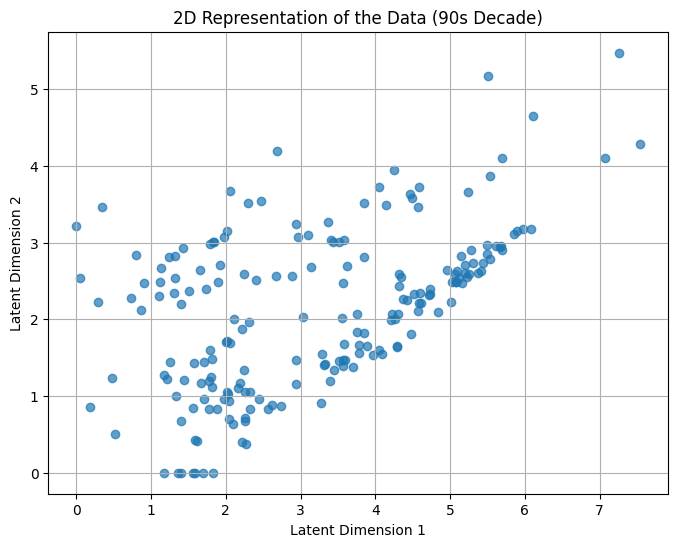

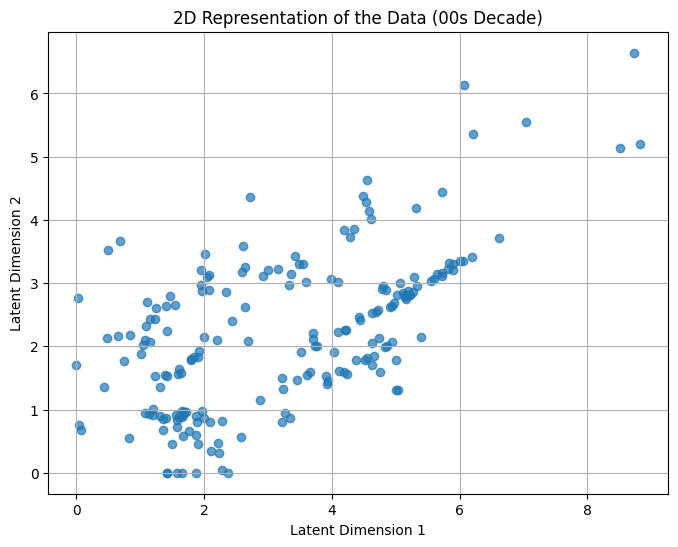

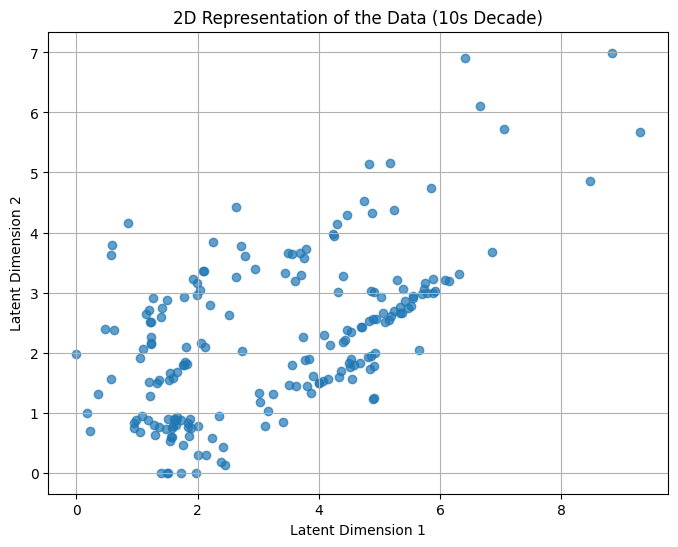

In [1262]:
# Dimensions
input_dim = 7  # Number of features
encoding_dim = 2  # Target dimensions for reduction

# Encoder
encoder_input = layers.Input(shape=(input_dim,))
encoded = layers.Dense(128, activation='relu')(encoder_input)
encoded = layers.Dense(64, activation='relu')(encoded)
encoder_output = layers.Dense(encoding_dim, activation='relu')(encoded)


# Decoder
decoded = layers.Dense(64, activation='relu')(encoder_output)
decoded = layers.Dense(128, activation='relu')(decoded)
decoder_output = layers.Dense(input_dim, activation='sigmoid')(decoded)

# Autoencoder model
autoencoder = models.Model(encoder_input, decoder_output, name="Autoencoder")

#Encoder model
encoder = models.Model(encoder_input, encoder_output, name="Encoder")

# Compile the model
autoencoder.compile(optimizer='adam', loss='mse')

start_time = time.time()

# Train the autoencoder for each decade separately
history_90s = autoencoder.fit(
    df_90s, df_90s,
    epochs=100,
    batch_size=16,
    shuffle=True,
    validation_split=0.2,
    verbose=1
)

sae_90s = encoder.predict(df_90s)

history_00s = autoencoder.fit(
    df_00s, df_00s,
    epochs=100,
    batch_size=16,
    shuffle=True,
    validation_split=0.2,
    verbose=1
)

sae_00s = encoder.predict(df_00s)

history_10s = autoencoder.fit(
    df_10s, df_10s,
    epochs=100,
    batch_size=16,
    shuffle=True,
    validation_split=0.2,
    verbose=1
)

sae_10s = encoder.predict(df_10s)

sae_time = time.time() - start_time

# Store the reduced data
reduced_data = [
    (sae_90s, "90s"),
    (sae_00s, "00s"),
    (sae_10s, "10s")
]

print(f"SAE Training Time: {sae_time:.2f} seconds")

# Visualize the reduced data
for data, label in reduced_data:
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], alpha=0.7, cmap='viridis')
    plt.title(f"2D Representation of the Data ({label} Decade)")
    plt.xlabel("Latent Dimension 1")
    plt.ylabel("Latent Dimension 2")
    plt.grid(True)
    plt.show()

### 3.1 MiniBatch KMeans

HyperParameter Optimization



*   **Elbow Method**



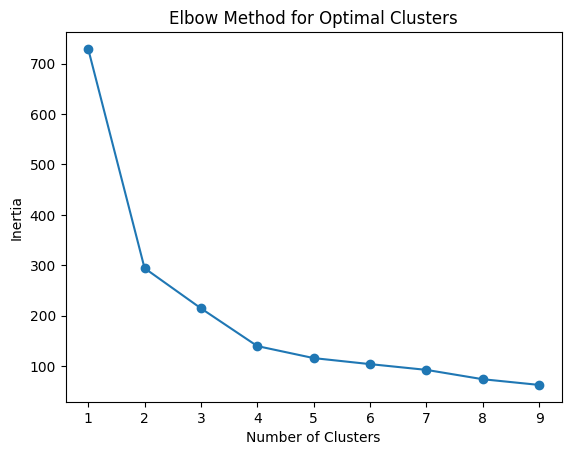

In [1263]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 10):
    minibatch = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    minibatch.fit(sae_90s)
    inertia.append(minibatch.inertia_)

# Plot the elbow curve
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*   **Grid Search**


In [1264]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

# GridSearchCV
minibatch = MiniBatchKMeans()

grid_search = GridSearchCV(
    minibatch,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(sae_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters (GridSearchCV): {'batch_size': 50, 'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.51




*   **Random Search**



In [1265]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),
    'batch_size': [10, 20, 50, 100],
    'init': ['k-means++', 'random']
}

minibatch = MiniBatchKMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    minibatch,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(sae_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'batch_size': 20, 'init': 'random', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.52




---



**Run MiniBatch Kmeans**

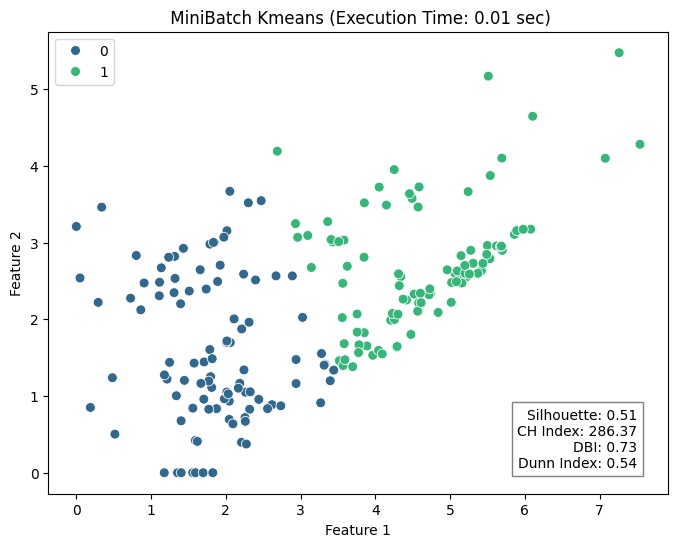

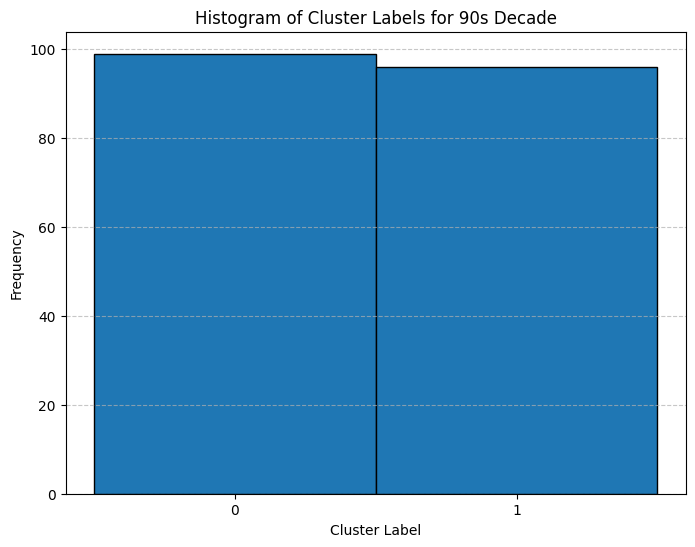

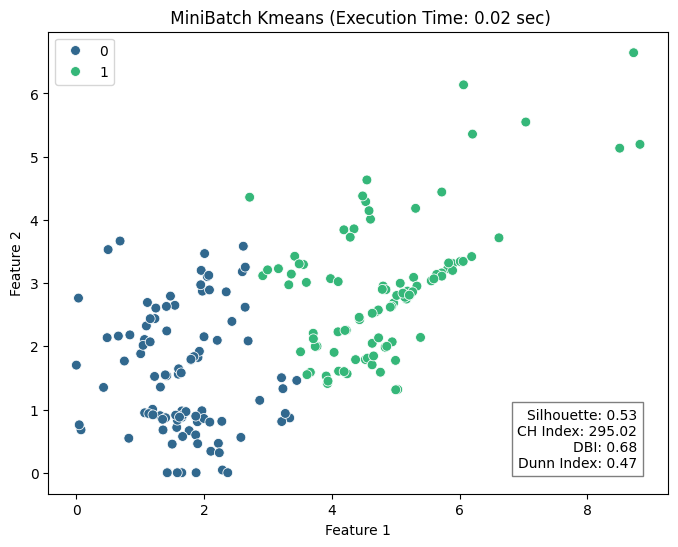

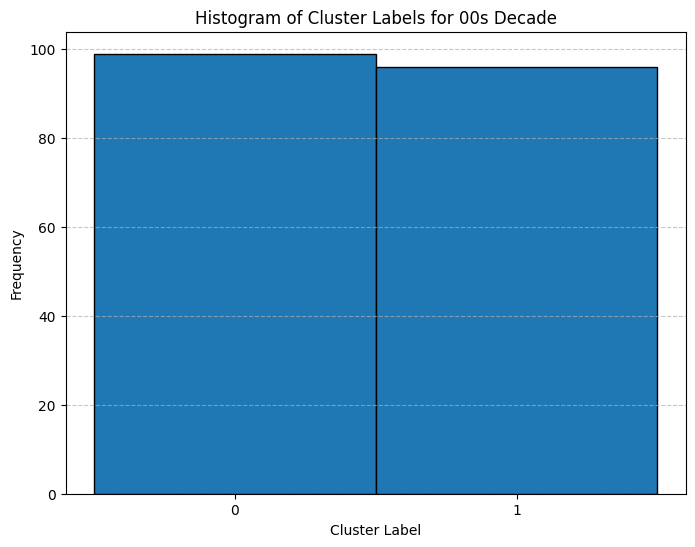

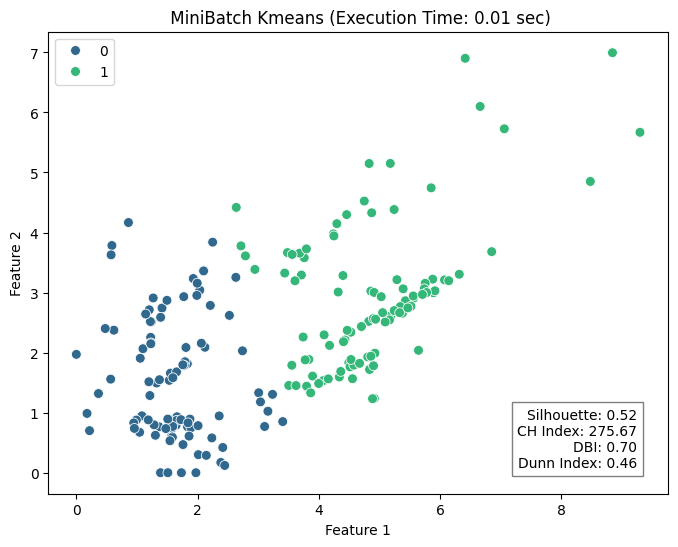

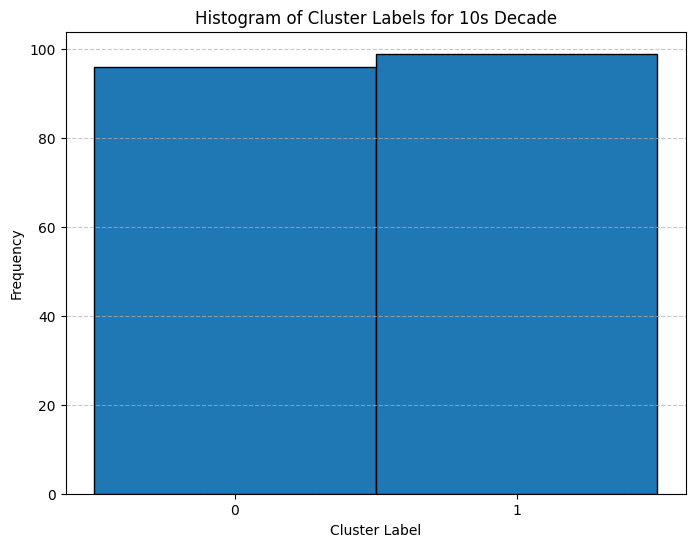

In [1266]:
minibatch_time = {}
sae_minibatch_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_sae, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    time_start = time.time()
    minibatch = MiniBatchKMeans(n_clusters = 2, batch_size = 10, init = 'k-means++',  random_state=42)
    sae_minibatch_labels[i] = minibatch.fit_predict(data_sae)
    minibatch_time[i] = time.time() - time_start


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i]= performance_score(data_sae, sae_minibatch_labels[i])
    #visualize
    plot_clusters_with_scores(data_sae, sae_minibatch_labels[i]," MiniBatch Kmeans", minibatch_time[i])
    plot_cluster_histograms(sae_minibatch_labels[i], decade_label)
    i = i + 1

In [1267]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "SAE",
                        "Clustering Algorithm": "MiniBatch Kmeans",
                        "Best Parameters": {'batch_size': 10, 'init': 'k-means++', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": sae_time,
                        "Clustering Execution Time (s)": minibatch_time[i],
                        "Suggested Clusters": len(set(sae_minibatch_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 3.2 DBSCAN

Hyperparameter optimization

Calculate the distances between each point and use the two values as the max and min values for hyperparameter optimization of the epsilon parameter

In [1268]:
# Example usage for SAE reduced data of the 90s decade
min_eps_90s, max_eps_90s = optimize_eps(sae_90s)
print(f"Suggested min_eps for 90s: {min_eps_90s}")
print(f"Suggested max_eps for 90s: {max_eps_90s}")


min_eps_00s, max_eps_00s = optimize_eps(sae_00s)
print(f"Suggested min_eps for 00s: {min_eps_00s}")
print(f"Suggested max_eps for 00s: {max_eps_00s}")

min_eps_10s, max_eps_10s = optimize_eps(sae_10s)
print(f"Suggested min_eps for 10s: {min_eps_10s}")
print(f"Suggested max_eps for 10s: {max_eps_10s}")

Suggested min_eps for 90s: 0.6577629422357217
Suggested max_eps for 90s: 0.960115530313391
Suggested min_eps for 00s: 0.6577629422357217
Suggested max_eps for 00s: 0.960115530313391
Suggested min_eps for 10s: 0.6577629422357217
Suggested max_eps for 10s: 0.960115530313391


* Randomized Search   



In [1269]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'eps': scipy.stats.uniform(0.1, 1.2),  # Uniform distribution for eps
    'min_samples': scipy.stats.randint(2, 11)  # Integer distribution for min_samples
}

dbscan = DBSCAN()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    dbscan,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(sae_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'eps': 1.211561054216019, 'min_samples': 10}
Best Silhouette Score (RandomizedSearchCV): 0.4121035099029541




*   GridSearch



In [1270]:
# Parameter grid for GridSearchCV
param_grid = {
    'eps': np.linspace(0.1, 1.2),  # Uniform grid for eps
    'min_samples': range(2, 11)        # Integer range for min_samples
}

# GridSearchCV
dbscan = DBSCAN()

grid_search = GridSearchCV(
    dbscan,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(sae_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_}")

Fitting 5 folds for each of 450 candidates, totalling 2250 fits
Best parameters (GridSearchCV): {'eps': 1.1775510204081634, 'min_samples': 9}
Best Silhouette Score (GridSearchCV): 0.4185241162776947




--------------------------------------------------------------------------------





**Execute DBSCAN Clustering**

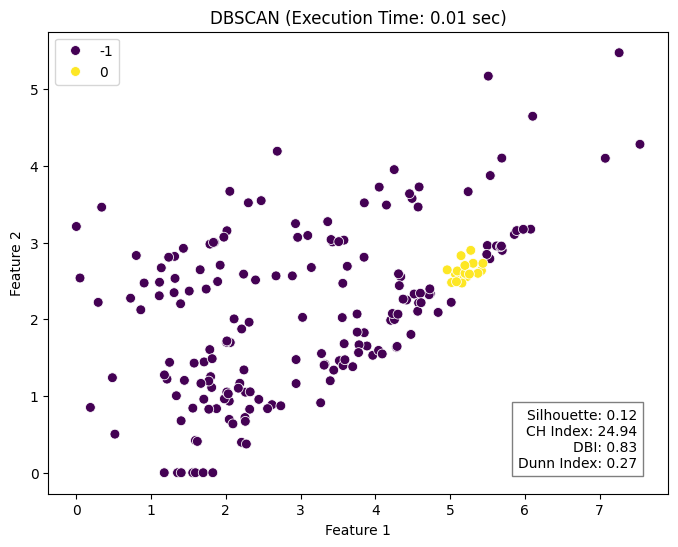

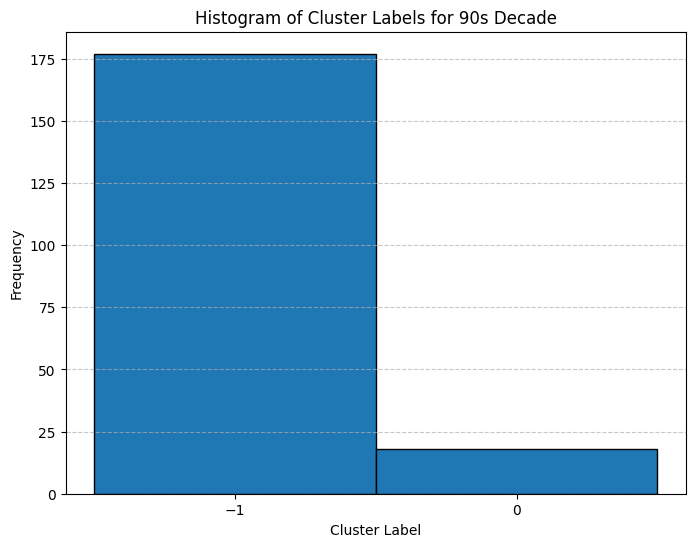

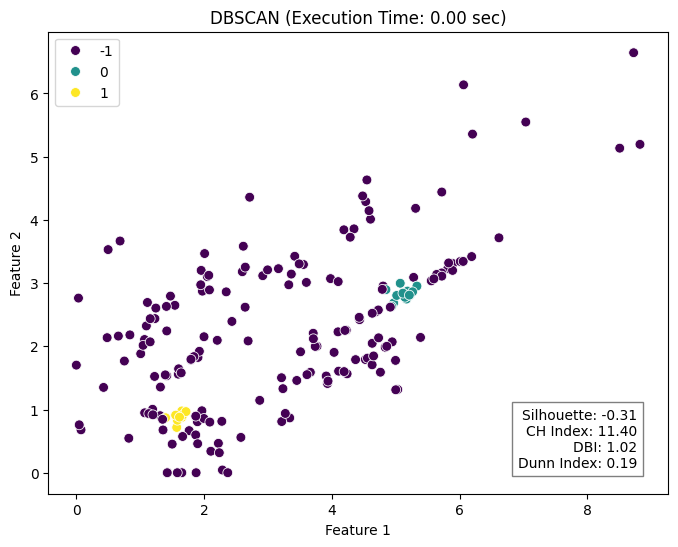

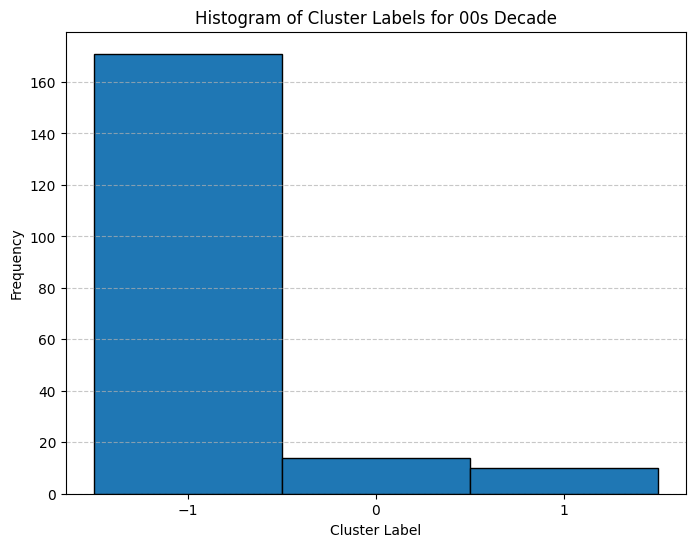

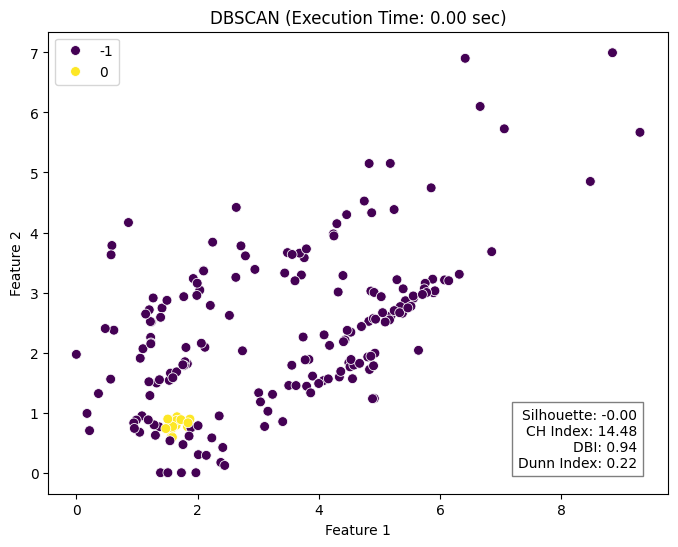

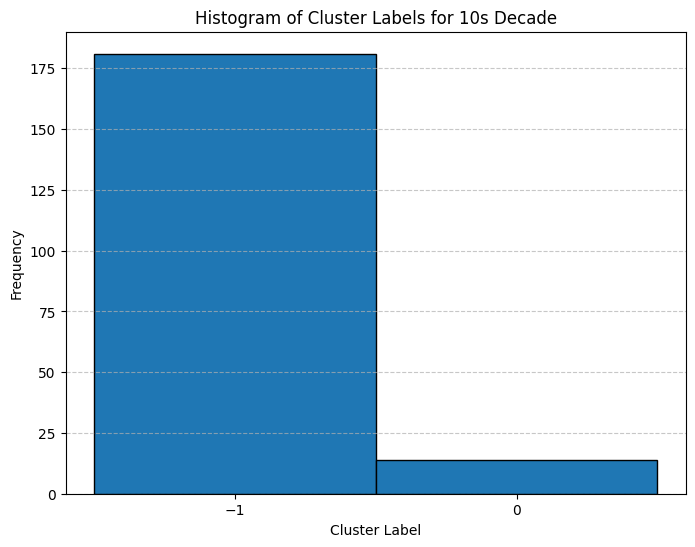

In [1271]:
dbscan_time = {}
sae_dbscan_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_sae, decade_label in reduced_data:

    # Perform DBSCAN clustering
    start_time = time.time()
    dbscan = DBSCAN(eps=0.2, min_samples=10)
    sae_dbscan_labels[i] = dbscan.fit_predict(data_sae)
    dbscan_time[i] = time.time() - start_time


    #visualize dbscan clustering with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_sae, sae_dbscan_labels[i])
    #visualize
    plot_clusters_with_scores(data_sae, sae_dbscan_labels[i],"DBSCAN", dbscan_time[i])
    plot_cluster_histograms(sae_dbscan_labels[i], decade_label)
    i = i + 1

In [1272]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "SAE",
                        "Clustering Algorithm": "DBSCAN",
                        "Best Parameters": {'eps': 0.2, 'min_samples': 10},
                        "Dimensionality Reduction Time (s)": sae_time,
                        "Clustering Execution Time (s)": dbscan_time[i],
                        "Suggested Clusters": len(set(sae_dbscan_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

### 3.3 KMeans

HyperParameter Optimization



*   **Elbow Method**


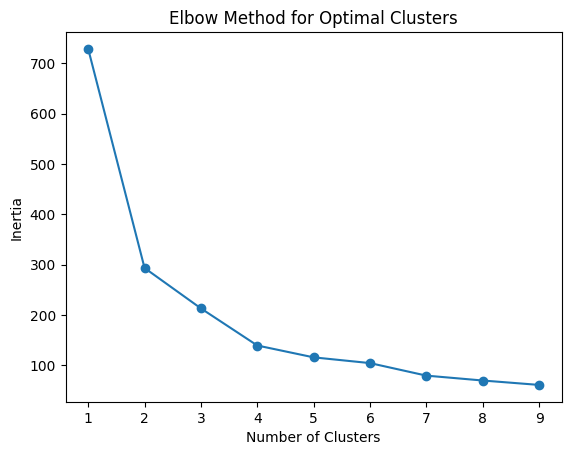

In [1273]:
inertia = []

# Test different numbers of clusters
for n_clusters in range(1, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(sae_90s)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Clusters")
plt.show()



*  **Grid Search**



In [1274]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'init': ['k-means++', 'random']
}

# GridSearchCV
kmeans = KMeans()

grid_search = GridSearchCV(
    kmeans,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(sae_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters (GridSearchCV): {'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.51




*   **Random Search**



In [1275]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': scipy.stats.randint(1, 7),  # Uniform distribution for eps
    'init': ['k-means++', 'random'] # Integer distribution for min_samples
}

kmeans = KMeans()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    kmeans,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(sae_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'init': 'k-means++', 'n_clusters': 2}
Best Silhouette Score (RandomizedSearchCV): 0.51




---



**Execute Kmeans Clustering**

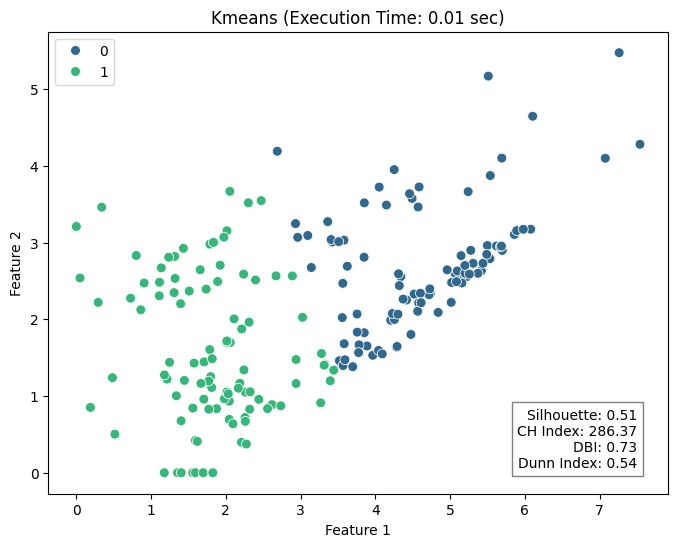

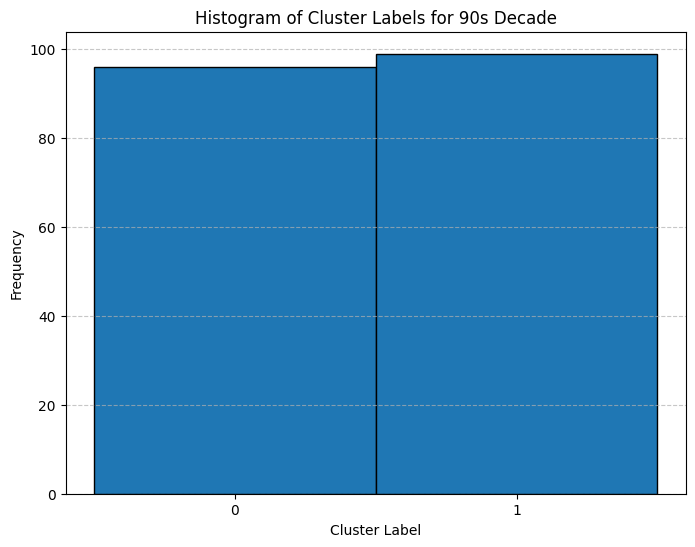

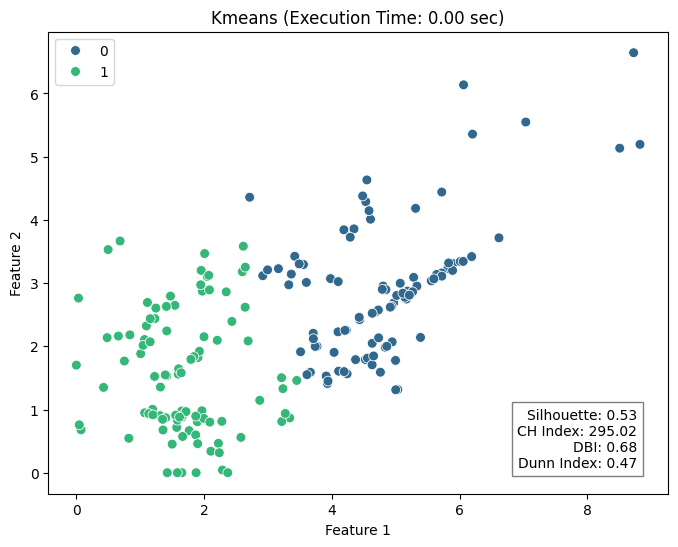

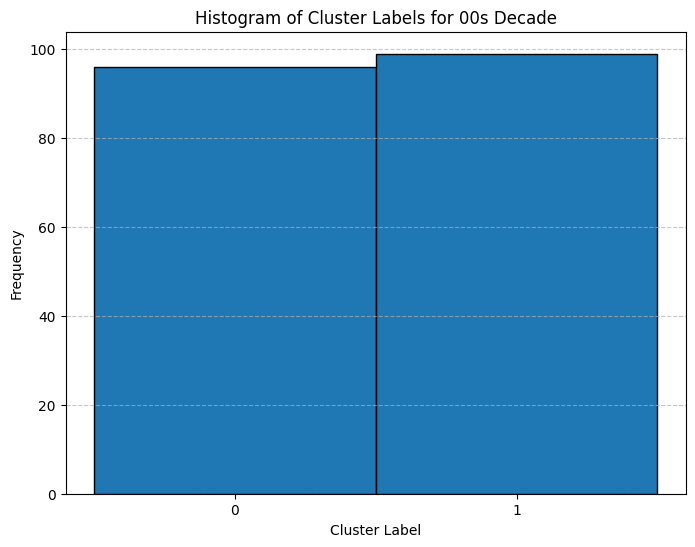

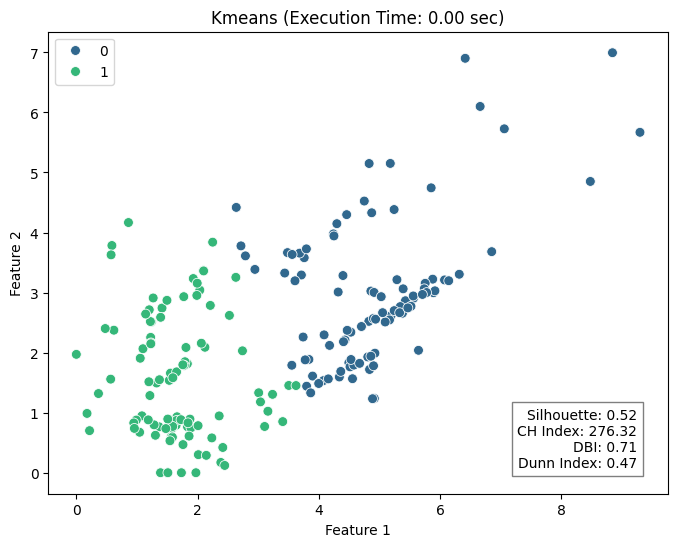

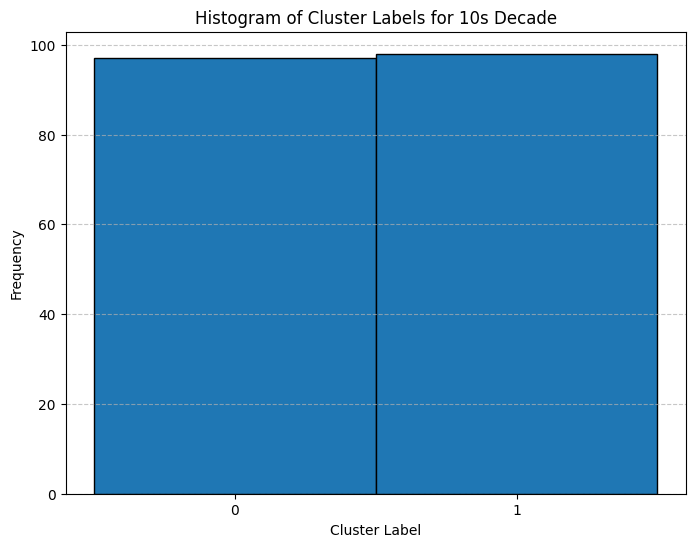

In [1276]:
kmeans_time = {}
sae_kmeans_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_sae, decade_label in reduced_data:

    # Perform MiniBatchKMeans clustering
    start_time = time.time()
    kmeans = KMeans(n_clusters=2, init = 'k-means++', random_state=42)
    sae_kmeans_labels[i] = kmeans.fit_predict(data_sae)
    kmeans_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_sae, sae_kmeans_labels[i])
    #visualize
    plot_clusters_with_scores(data_sae, sae_kmeans_labels[i], "Kmeans", kmeans_time[i])
    plot_cluster_histograms(sae_kmeans_labels[i], decade_label)
    i = i + 1

In [1277]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "SAE",
                        "Clustering Algorithm": "Kmeans",
                        "Best Parameters": {'init': 'k-means++', 'n_clusters': 2},
                        "Dimensionality Reduction Time (s)": sae_time,
                        "Clustering Execution Time (s)": kmeans_time[i],
                        "Suggested Clusters": len(set(sae_kmeans_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

###3.4 Spectral Clustering

Hyperparameter Optimization



*   GridSearch



In [1278]:
# Parameter grid for GridSearchCV
param_grid = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}

# GridSearchCV
SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=35, eigen_solver='arpack')

grid_search = GridSearchCV(
    SC,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(sae_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best Silhouette Score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (GridSearchCV): {'assign_labels': 'kmeans', 'n_clusters': 2}
Best Silhouette Score (GridSearchCV): 0.49




*   RandomizedSearch


In [1279]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'n_clusters': range(1, 7),
    'assign_labels': ['kmeans', 'discretize', 'cluster_qr']
}


SC = SpectralClustering(affinity='nearest_neighbors', n_neighbors=35, eigen_solver='arpack')

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    SC,
    param_distributions=param_distributions,
    n_iter=18,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(sae_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters (RandomizedSearchCV): {'n_clusters': 2, 'assign_labels': 'kmeans'}
Best Silhouette Score (RandomizedSearchCV): 0.49




---



**Execute Spectral Clustering**

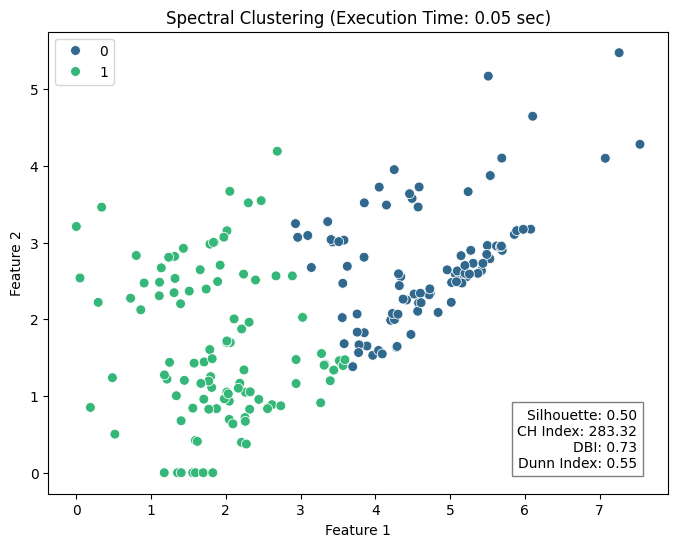

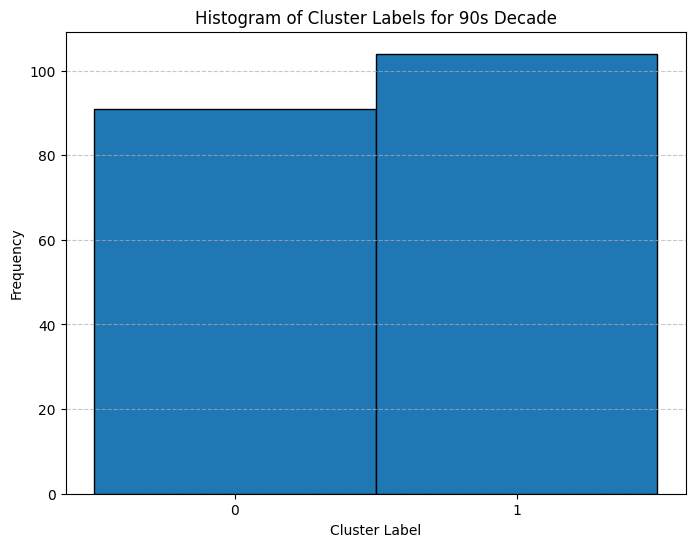

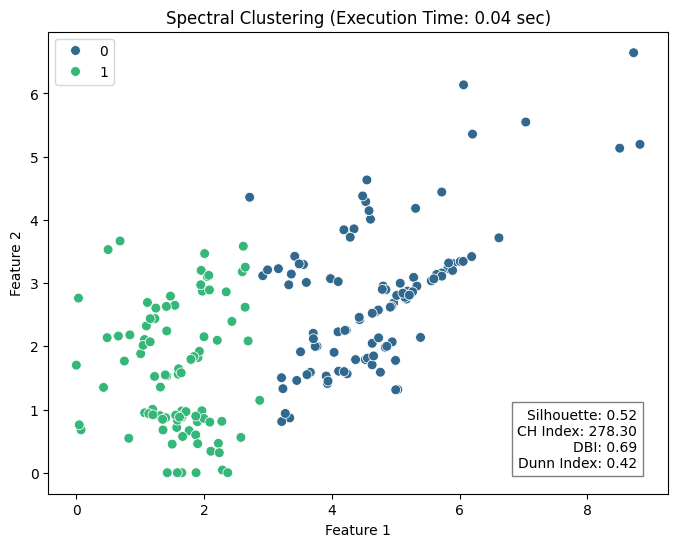

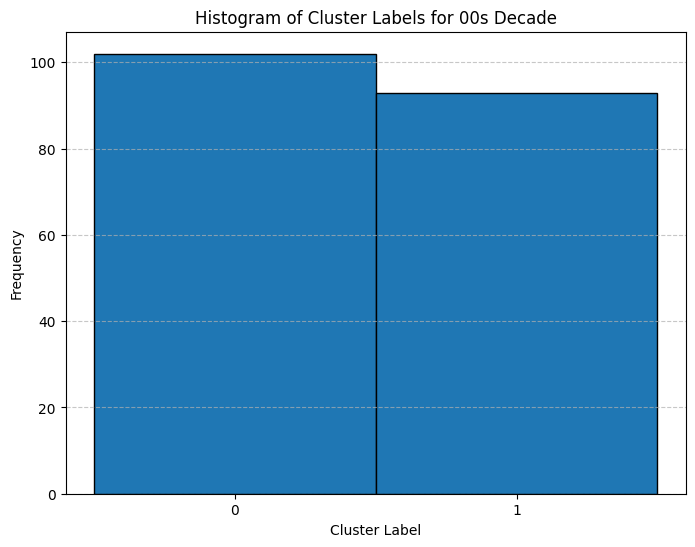

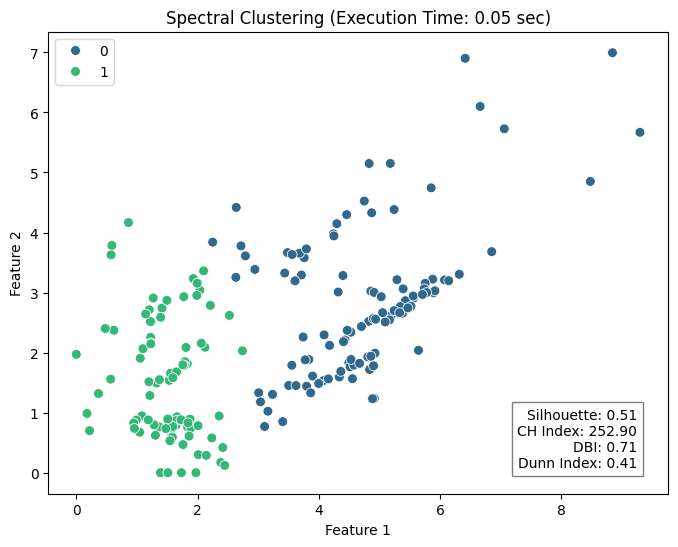

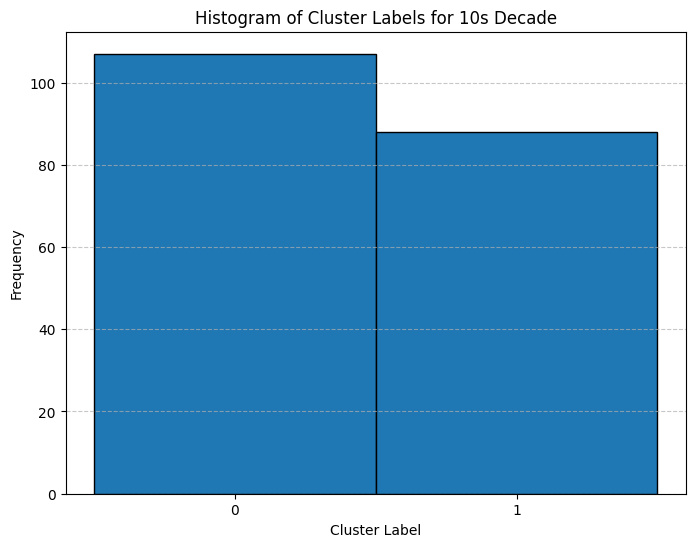

In [1280]:
sc_time = {}
sae_sc_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_sae, decade_label in reduced_data:

    # Perform Spectral Clustering
    start_time = time.time()
    SC = SpectralClustering(n_clusters=2, assign_labels='kmeans',random_state=42, affinity='nearest_neighbors', n_neighbors=10, eigen_solver='arpack')
    sae_sc_labels[i] = SC.fit_predict(data_sae)
    sc_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_sae, sae_sc_labels[i])
    #visualize
    plot_clusters_with_scores(data_sae, sae_sc_labels[i],"Spectral Clustering", sc_time[i])
    plot_cluster_histograms(sae_sc_labels[i], decade_label)
    i = i + 1

In [1281]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "SAE",
                        "Clustering Algorithm": "Spectral Clustering",
                        "Best Parameters": {'n_clusters': 2, 'assign_labels': 'kmeans'},
                        "Dimensionality Reduction Time (s)": sae_time,
                        "Clustering Execution Time (s)": sc_time[i],
                        "Suggested Clusters": len(set(sae_sc_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

###3.5 MeanShift

Hyperparameter Optimization

In [1282]:
for data_sae, decade_label in reduced_data:
    #estimate optimal bandwidth for each run
    bandwidth = estimate_bandwidth(data_sae)
    print(f"Estimated Bandwidth: {bandwidth:.2f}")

Estimated Bandwidth: 1.57
Estimated Bandwidth: 1.68
Estimated Bandwidth: 1.77


* RandomizedSearch

In [1283]:
# Parameter distributions for RandomizedSearchCV
param_distributions = {
    'bandwidth': np.linspace(0.2, 1.5, 10)
}

meanshift = MeanShift()

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    meanshift,
    param_distributions=param_distributions,
    n_iter=10,  # Number of random combinations to try
    scoring=silhouette_scorer,
    random_state=42,
    verbose=1
)

random_search.fit(sae_90s)

print(f"Best parameters (RandomizedSearchCV): {random_search.best_params_}")
print(f"Best Silhouette Score (RandomizedSearchCV): {random_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (RandomizedSearchCV): {'bandwidth': 1.3555555555555556}
Best Silhouette Score (RandomizedSearchCV): 0.50


* GridSearch

In [1284]:
param_grid = {
    'bandwidth': np.linspace(0.2, 0.5, 10)
}

meanshift = MeanShift()
grid_search = GridSearchCV(
    meanshift,
    param_grid=param_grid,
    scoring=silhouette_scorer,
    verbose=1
)

grid_search.fit(sae_90s)

print(f"Best parameters (GridSearchCV): {grid_search.best_params_}")
print(f"Best score (GridSearchCV): {grid_search.best_score_:.2f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters (GridSearchCV): {'bandwidth': 0.5}
Best score (GridSearchCV): 0.44




---



**Execute MeanShift Clustering**

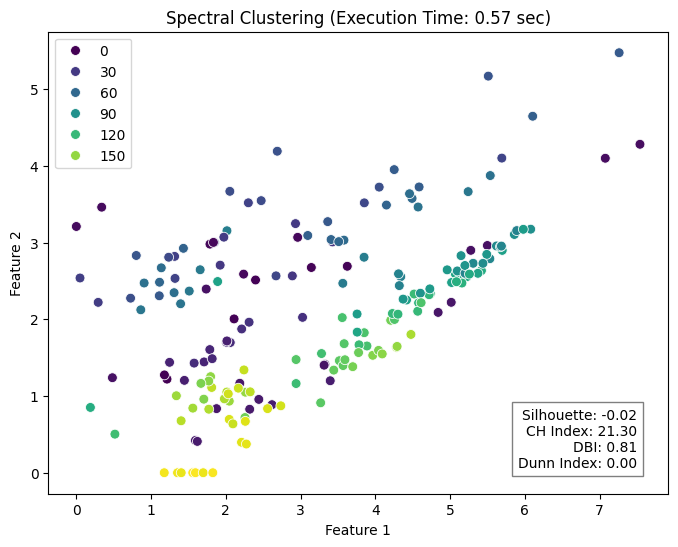

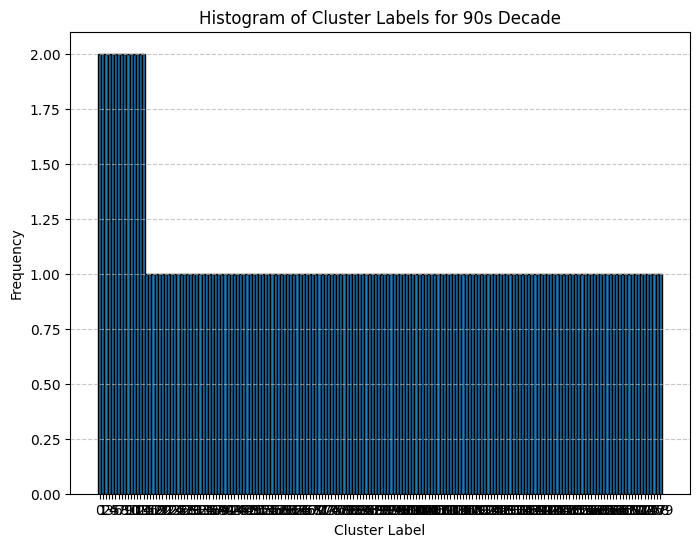

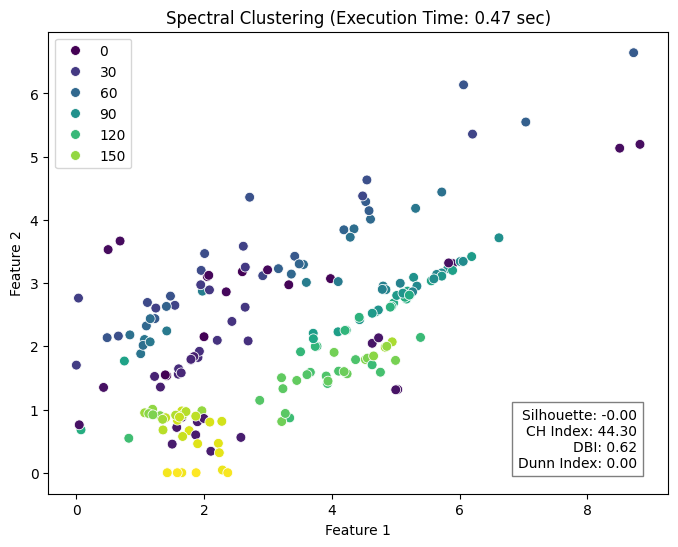

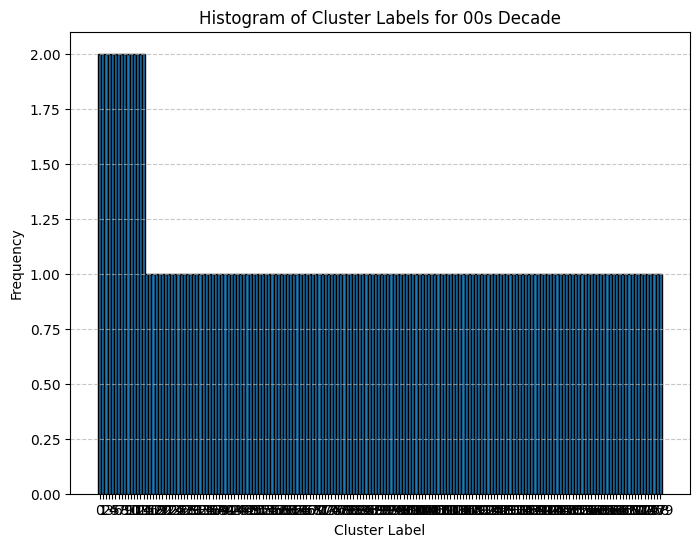

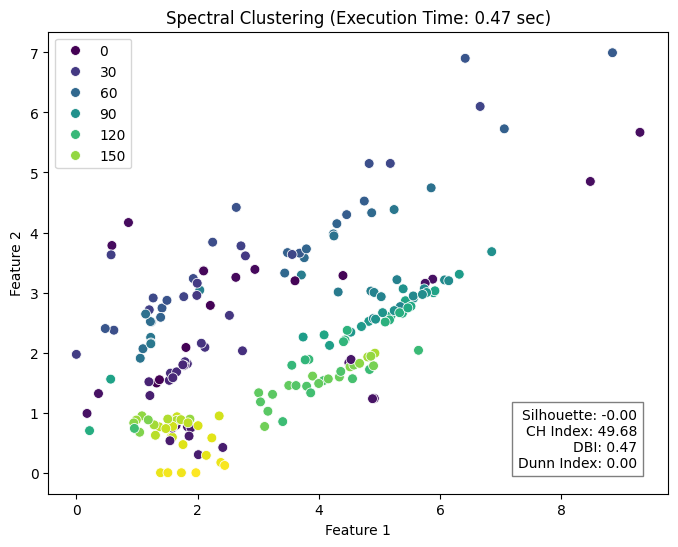

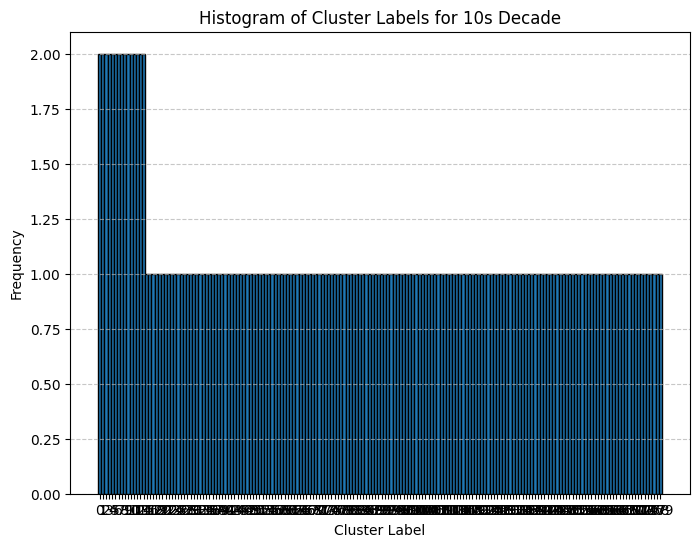

In [1285]:
ms_time = {}
sae_ms_labels = {}
sil = {}
ch = {}
db = {}
dunn = {}
i = 0
for data_sae, decade_label in reduced_data:

    # Perform MeanShift Clustering
    start_time = time.time()
    meanshift = MeanShift(bandwidth = 0.43)
    sae_ms_labels[i] = meanshift.fit_predict(data_tsne)
    ms_time[i] = time.time() - start_time


    #visualize clustering with minibatch kmeans with performance scores
    sil[i], ch[i], db[i], dunn[i] = performance_score(data_sae, sae_ms_labels[i])
    #visualize
    plot_clusters_with_scores(data_sae, sae_ms_labels[i], "Spectral Clustering", ms_time[i])
    plot_cluster_histograms(sae_ms_labels[i], decade_label)
    i = i + 1

In [1286]:
for i, decade in decade_dfs.items():
    #store data in new row and store new row in dataframe
    new_row = pd.DataFrame([{
                        "Dimensionality Reduction": "SAE",
                        "Clustering Algorithm": "MeanShift",
                        "Best Parameters": {'bandwidth': 0.43},
                        "Dimensionality Reduction Time (s)": sae_time,
                        "Clustering Execution Time (s)": ms_time[i],
                        "Suggested Clusters": len(set(sae_ms_labels[i])),
                        "Calinski-Harabasz Index": ch[i],
                        "Davies-Bouldin Index": db[i],
                        "Silhouette Score": sil[i],
                        "Dunn Index": dunn[i]
                    }])

    #add new row to final dataframe
    decade_dfs[i] = pd.concat([decade, new_row], ignore_index=True)
    print(decade_dfs[i].to_string())

   Dimensionality Reduction Clustering Algorithm                                            Best Parameters  Dimensionality Reduction Time (s)  Clustering Execution Time (s)  Suggested Clusters  Calinski-Harabasz Index  Davies-Bouldin Index  Silhouette Score  Dunn Index
0                       Raw     MiniBatch Kmeans  {'batch_size': 100, 'init': 'k-means++', 'n_clusters': 2}                           0.000000                       0.005502                   2               109.341302              1.181223          0.383658    0.486153
1                       Raw               DBSCAN                             {'eps': 0.6, 'min_samples': 2}                           0.000000                       0.007387                   2                16.726907              0.467032          0.536654    0.893611
2                       Raw               Kmeans                        {'init': 'random', 'n_clusters': 2}                           0.000000                       0.005849              

# Inspecting results

In [1287]:
#drop null values (cases of clustering withonly 1 cluster found)
for i, df in decade_dfs.items():
    df.dropna(inplace = True)

In [1326]:
metrics = {
    0 : "Calinski-Harabasz Index",
    1 : "Davies-Bouldin Index",
    2 : "Silhouette Score",
    3 : "Dunn Index"
}

for i, df in decade_dfs.items():
    print(f"Best rows for {1990 if i == 0 else 2000 if i == 1 else 2010}s decade:\n")
    for j , column in metrics.items():
      if j == 1:
        best_value = df[column].min()
        index = df[column].idxmin()
        best_row = df.loc[index]
      else :
        best_value = df[column].max()
        index = df[column].idxmax()
        best_row = df.loc[index]  # Get the entire row with the max value

          # Get the entire row with the min value

      print(f"Column: {column} Best: {best_value}")
      print("------------------------------------------------------------------")
      print(f"{best_row[['Dimensionality Reduction', 'Clustering Algorithm']]}")
      print("\n")




Best rows for 1990s decade:

Column: Calinski-Harabasz Index Best: 793.5225753758787
------------------------------------------------------------------
Dimensionality Reduction               t-SNE
Clustering Algorithm        MiniBatch Kmeans
Name: 10, dtype: object


Column: Davies-Bouldin Index Best: 0.25216262621456426
------------------------------------------------------------------
Dimensionality Reduction       PCA
Clustering Algorithm        DBSCAN
Name: 6, dtype: object


Column: Silhouette Score Best: 0.7152562737464905
------------------------------------------------------------------
Dimensionality Reduction               t-SNE
Clustering Algorithm        MiniBatch Kmeans
Name: 10, dtype: object


Column: Dunn Index Best: 0.9854308297335376
------------------------------------------------------------------
Dimensionality Reduction       PCA
Clustering Algorithm        DBSCAN
Name: 6, dtype: object


Best rows for 2000s decade:

Column: Calinski-Harabasz Index Best: 961.15009

In [1369]:
import plotly.express as px

def plot_maps_for_best_results(best_results, data_map, countries):

    for decade, results in best_results.items():
        for metric, reduction_method, clustering_algorithm, labels in results:
            # Get the data and countries for the current decade
            data = data_map[decade][reduction_method]

            # Create the DataFrame for the map
            map_df = pd.DataFrame({
                "Country": countries,
                "Cluster": labels
            })

            # Plot the map
            title = f"Clustering Results for {metric} ({decade}, {reduction_method}, {clustering_algorithm})"
            fig = px.choropleth(
                data_frame=map_df,
                locations="Country",
                locationmode="country names",
                color="Cluster",
                color_continuous_scale=px.colors.sequential.Reds,
                title=title
            )
            fig.update_layout(legend_title_text="Cluster")
            fig.show()



# Define the best results for each decade
best_results = {
    "90s": [
        ("Calinski-Harabasz Index", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[0]),
        ("Davies-Bouldin Index", "PCA", "DBSCAN", pca_dbscan_labels[0]),
        ("Silhouette Score", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[0]),
        ("Dunn Index", "PCA", "DBSCAN", pca_dbscan_labels[0])
    ],
    "00s": [
        ("Calinski-Harabasz Index", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[1]),
        ("Davies-Bouldin Index", "PCA", "DBSCAN", pca_dbscan_labels[1]),
        ("Silhouette Score", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[1]),
        ("Dunn Index", "t-SNE", "MeanShift", tsne_ms_labels[1])
    ],
    "10s": [
        ("Calinski-Harabasz Index", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[2]),
        ("Davies-Bouldin Index", "PCA", "DBSCAN", pca_dbscan_labels[2]),
        ("Silhouette Score", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[2]),
        ("Dunn Index", "t-SNE", "MiniBatch Kmeans", tsne_kmeans_labels[2])
    ]
}


# Define the data mapping for each decade
data_map = {
    "90s": {"t-SNE": tsne_90s, "PCA": pca_90s, "Raw": df_90s},
    "00s": {"t-SNE": tsne_00s, "PCA": pca_00s, "Raw": df_00s},
    "10s": {"t-SNE": tsne_10s, "PCA": pca_10s, "Raw": df_10s}
}


# Run the method
plot_maps_for_best_results(best_results, data_map, countries)
